# Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Bidirectional, Dense, Dropout, Input, Flatten, Concatenate, Add

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, auc

## Final Data Prepare

In [ ]:
same_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/same_final.csv')
int_df = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_fin_fin_data/int_final.csv')

In [ ]:
same_df['Date'] = pd.to_datetime(same_df['Date'])
int_df['Date'] = pd.to_datetime(int_df['Date'])

In [ ]:
boolean_columns = [
    "Covid19",
    "US_President_Republican",
    "US_President_Democratic",
    "KR_President_Democratic",
    "KR_President_Conservative",
    "KR_President_Neutral"
]

same_df[boolean_columns] = same_df[boolean_columns].astype(bool)
int_df[boolean_columns] = int_df[boolean_columns].astype(bool)

# Set Index
same_df.set_index('Date', inplace = True)
int_df.set_index('Date', inplace = True)

# Normalization
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']
target = ['Close']

x_train_same = same_df[features][:3519].values
y_train_same = same_df[target][:3519].values

x_val_same = same_df[features][3519:4692].values
y_val_same = same_df[target][3519:4692].values

x_test_same = same_df[features][4692:].values
y_test_same = same_df[target][4692:].values

x_scaler_same_df, y_scaler_same_df = MinMaxScaler(), MinMaxScaler()

x_train_same = x_scaler_same_df.fit_transform(x_train_same)
y_train_same = y_scaler_same_df.fit_transform(y_train_same.reshape(-1, 1))

x_val_same = x_scaler_same_df.transform(x_val_same)
y_val_same = y_scaler_same_df.transform(y_val_same.reshape(-1, 1))

x_test_same = x_scaler_same_df.transform(x_test_same)
y_test_same = y_scaler_same_df.transform(y_test_same.reshape(-1, 1))

In [ ]:
x_train_int = int_df[features][:3519].values
y_train_int = int_df[target][:3519].values

x_val_int = int_df[features][3519:4692].values
y_val_int = int_df[target][3519:4692].values

x_test_int = int_df[features][4692:].values
y_test_int = int_df[target][4692:].values

x_scaler_int_df, y_scaler_int_df = MinMaxScaler(), MinMaxScaler()

x_train_int = x_scaler_int_df.fit_transform(x_train_int)
y_train_int = y_scaler_int_df.fit_transform(y_train_int.reshape(-1, 1))

x_val_int = x_scaler_int_df.transform(x_val_int)
y_val_int = y_scaler_int_df.transform(y_val_int.reshape(-1, 1))

x_test_int = x_scaler_int_df.transform(x_test_int)
y_test_int = y_scaler_int_df.transform(y_test_int.reshape(-1, 1))

### Feature Selection

In [ ]:
features0_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'US_10',  'WTI', 'Exchange',
      'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']

features0_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1']

In [ ]:
len(features0_int)

13

In [ ]:
selected_x_train_same = same_df[features0_same][:3519].values
selected_y_train_same = same_df[target][:3519].values

selected_x_val_same = same_df[features0_same][3519:4692].values
selected_y_val_same = same_df[target][3519:4692].values

selected_x_test_same = same_df[features0_same][4692:].values
selected_y_test_same = same_df[target][4692:].values

x_scaler_selected_same_df, y_scaler_selected_same_df = MinMaxScaler(), MinMaxScaler()

selected_x_train_same = x_scaler_selected_same_df.fit_transform(selected_x_train_same)
selected_y_train_same = y_scaler_selected_same_df.fit_transform(selected_y_train_same.reshape(-1, 1))

selected_x_val_same = x_scaler_selected_same_df.transform(selected_x_val_same)
selected_y_val_same = y_scaler_selected_same_df.transform(selected_y_val_same.reshape(-1, 1))

selected_x_test_same = x_scaler_selected_same_df.transform(selected_x_test_same)
selected_y_test_same = y_scaler_selected_same_df.transform(selected_y_test_same.reshape(-1, 1))

In [ ]:
selected_x_train_int = int_df[features0_int][:3519].values
selected_y_train_int = int_df[target][:3519].values

selected_x_val_int = int_df[features0_int][3519:4692].values
selected_y_val_int = int_df[target][3519:4692].values

selected_x_test_int = int_df[features0_int][4692:].values
selected_y_test_int = int_df[target][4692:].values

x_scaler_selected_int_df, y_scaler_selected_int_df = MinMaxScaler(), MinMaxScaler()

selected_x_train_int = x_scaler_selected_int_df.fit_transform(selected_x_train_int)
selected_y_train_int = y_scaler_selected_int_df.fit_transform(selected_y_train_int.reshape(-1, 1))

selected_x_val_int = x_scaler_selected_int_df.transform(selected_x_val_int)
selected_y_val_int = y_scaler_selected_int_df.transform(selected_y_val_int.reshape(-1, 1))

selected_x_test_int = x_scaler_selected_int_df.transform(selected_x_test_int)
selected_y_test_int = y_scaler_selected_int_df.transform(selected_y_test_int.reshape(-1, 1))

In [ ]:
selected_x_train_int.shape

(3519, 13)

In [ ]:
print(x_scaler_selected_int_df.n_features_in_)

13


## Without Outlier Process Data Prepare

In [ ]:
same_wo = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/same_no_outlier.csv')
int_wo = pd.read_csv('/content/drive/MyDrive/Time Series Project/Stock Price/data/real_final_data/int_no_outlier.csv')

In [ ]:
boolean_columns = [
    "Covid19",
    "US_President_Republican",
    "US_President_Democratic",
    "KR_President_Democratic",
    "KR_President_Conservative",
    "KR_President_Neutral"
]

same_wo[boolean_columns] = same_wo[boolean_columns].astype(bool)
int_wo[boolean_columns] = int_wo[boolean_columns].astype(bool)

# Set Index
same_wo.set_index('Date', inplace = True)
int_wo.set_index('Date', inplace = True)

# Normalization
features = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction','SE_Operating_Profit', 'SE_Net_Profit', 'SE_Total_Equity',
       'SE_Total_Liabilities', 'SE_Revenue', 'SE_Foreign', 'US_Inflation', 'KR_Inflation', 'CN_Inflation', 'US_GDP_Annual', 'KR_GDP_Annual',
       'CN_GDP_Annual', 'US_Economic_Growth_Rate', 'KR_Economic_Growth_Rate', 'US_Base', 'US_10', 'KR_Base', 'KR_10', 'WTI', 'Exchange', 'SOX_Close',
       'Phone', 'KR_Unemployment', 'Covid19', 'US_President_Republican', 'US_President_Democratic', 'KR_President_Democratic', 'KR_President_Conservative', 'KR_President_Neutral',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']
target = ['Close']

x_train_same_wo = same_wo[features][:3519].values
y_train_same_wo = same_wo[target][:3519].values

x_val_same_wo = same_wo[features][3519:4692].values
y_val_same_wo = same_wo[target][3519:4692].values

x_test_same_wo = same_wo[features][4692:].values
y_test_same_wo = same_wo[target][4692:].values

x_scaler_same_wo, y_scaler_same_wo = MinMaxScaler(), MinMaxScaler()

x_train_same_wo = x_scaler_same_wo.fit_transform(x_train_same_wo)
y_train_same_wo = y_scaler_same_wo.fit_transform(y_train_same_wo.reshape(-1, 1))

x_val_same_wo = x_scaler_same_wo.transform(x_val_same_wo)
y_val_same_wo = y_scaler_same_wo.transform(y_val_same_wo.reshape(-1, 1))

x_test_same_wo = x_scaler_same_wo.transform(x_test_same_wo)
y_test_same_wo = y_scaler_same_wo.transform(y_test_same_wo.reshape(-1, 1))

In [ ]:
x_train_int_wo = int_wo[features][:3519].values
y_train_int_wo = int_wo[target][:3519].values

x_val_int_wo = int_wo[features][3519:4692].values
y_val_int_wo = int_wo[target][3519:4692].values

x_test_int_wo = int_wo[features][4692:].values
y_test_int_wo = int_wo[target][4692:].values

x_scaler_int_wo, y_scaler_int_wo = MinMaxScaler(), MinMaxScaler()

x_train_int_wo = x_scaler_int_wo.fit_transform(x_train_int_wo)
y_train_int_wo = y_scaler_int_wo.fit_transform(y_train_int_wo.reshape(-1, 1))

x_val_int_wo = x_scaler_int_wo.transform(x_val_int_wo)
y_val_int_wo = y_scaler_int_wo.transform(y_val_int_wo.reshape(-1, 1))

x_test_int_wo = x_scaler_int_wo.transform(x_test_int_wo)
y_test_int_wo = y_scaler_int_wo.transform(y_test_int_wo.reshape(-1, 1))

### Feature Selection

In [ ]:
features2_same = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30']

features2_int = ['Open', 'High', 'Low', 'Volume', 'Change', 'Transaction', 'WTI', 'SOX_Close',
       'BB_High', 'BB_Low', 'RSI', 'Volume_Price_Ratio', 'Volume_Momentum', 'High_Low_Volatility', 'Lag_1', 'Lag_30', 'Lag_60', 'Lag_90']

In [ ]:
selected_x_train_same_wo = same_wo[features2_same][:3519].values
selected_y_train_same_wo = same_wo[target][:3519].values

selected_x_val_same_wo = same_wo[features2_same][3519:4692].values
selected_y_val_same_wo = same_wo[target][3519:4692].values

selected_x_test_same_wo = same_wo[features2_same][4692:].values
selected_y_test_same_wo = same_wo[target][4692:].values

x_scaler_selected_same_wo, y_scaler_selected_same_wo = MinMaxScaler(), MinMaxScaler()

selected_x_train_same_wo = x_scaler_selected_same_wo.fit_transform(selected_x_train_same_wo)
selected_y_train_same_wo = y_scaler_selected_same_wo.fit_transform(selected_y_train_same_wo.reshape(-1, 1))

selected_x_val_same_wo = x_scaler_selected_same_wo.transform(selected_x_val_same_wo)
selected_y_val_same_wo = y_scaler_selected_same_wo.transform(selected_y_val_same_wo.reshape(-1, 1))

selected_x_test_same_wo = x_scaler_selected_same_wo.transform(selected_x_test_same_wo)
selected_y_test_same_wo = y_scaler_selected_same_wo.transform(selected_y_test_same_wo.reshape(-1, 1))

In [ ]:
selected_x_train_int_wo = int_wo[features2_int][:3519].values
selected_y_train_int_wo = int_wo[target][:3519].values

selected_x_val_int_wo = int_wo[features2_int][3519:4692].values
selected_y_val_int_wo = int_wo[target][3519:4692].values

selected_x_test_int_wo = int_wo[features2_int][4692:].values
selected_y_test_int_wo = int_wo[target][4692:].values

x_scaler_selected_int_wo, y_scaler_selected_int_wo = MinMaxScaler(), MinMaxScaler()

selected_x_train_int_wo = x_scaler_selected_int_wo.fit_transform(selected_x_train_int_wo)
selected_y_train_int_wo = y_scaler_selected_int_wo.fit_transform(selected_y_train_int_wo.reshape(-1, 1))

selected_x_val_int_wo = x_scaler_selected_int_wo.transform(selected_x_val_int_wo)
selected_y_val_int_wo = y_scaler_selected_int_wo.transform(selected_y_val_int_wo.reshape(-1, 1))

selected_x_test_int_wo = x_scaler_selected_int_wo.transform(selected_x_test_int_wo)
selected_y_test_int_wo = y_scaler_selected_int_wo.transform(selected_y_test_int_wo.reshape(-1, 1))

# Model Setting

In [ ]:
!pip install wandb -qU

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 44.9 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow

In [ ]:
import wandb
from wandb.integration.keras import WandbCallback

In [ ]:
wandb.login(key='my_key')

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yebin. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU is set to be used.")
    except RuntimeError as e:
        print(f"Error setting GPU memory growth: {e}")
else:
    print("No GPU found. Using CPU instead.")

In [ ]:
def create_sequences(X, y, time_steps):
    sequences, labels = [], []
    for i in range(len(X) - time_steps):
        sequences.append(X[i:i+time_steps])
        labels.append(y[i+time_steps])
    return np.array(sequences), np.array(labels)

def rmse_metric(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class Attention(Layer):
    def __init__(self, **kwargs):
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='attention_weight', shape=(input_shape[-1], input_shape[-1]),
                                 initializer='random_normal', trainable=True)
        self.b = self.add_weight(name='attention_bias', shape=(input_shape[-1],),
                                 initializer='zeros', trainable=True)
        self.V = self.add_weight(name='attention_score', shape=(input_shape[-1], 1),
                                 initializer='random_normal', trainable=True)

    def call(self, inputs):
        # Attention mechanism
        score = tf.nn.tanh(tf.tensordot(inputs, self.W, axes=1) + self.b)
        attention_weights = tf.nn.softmax(tf.tensordot(score, self.V, axes=1), axis=1)
        context_vector = attention_weights * inputs
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector

In [ ]:
class MultiHeadAttentionLayer(tf.keras.layers.Layer):
    def __init__(self, num_heads, key_dim):
        super(MultiHeadAttentionLayer, self).__init__()
        self.attention = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)

    def call(self, query, value):
        return self.attention(query=query, value=value, key=value)

In [ ]:
early_stopping = EarlyStopping(
    monitor='val_loss',  # 모니터할 지표 (예: 'val_loss' 또는 'val_rmse')
    patience=5,          # 성능 향상이 없는 epoch 수 (5번 동안 개선 없으면 중단)
    restore_best_weights=True,  # 가장 성능이 좋은 가중치를 복원
    mode = 'min'
    #verbose=1            # 로그 출력 여부
)

# LSTM - Same

##### Initial

In [ ]:
wandb.init(project="LSTM Final - Same", name="initial", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 30,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/Initial.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_same_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0248 - mse: 0.0248
Epoch 1: val_loss improved from inf to 0.06395, saving model to /content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/Initial.weights.h5
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 0.0244 - mse: 0.0244 - val_loss: 0.0639 - val_mse: 0.0639
Epoch 2/30
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 6.6389e-04 - mse: 6.6389e-04
Epoch 1: val_loss did not improve from 0.06395
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 6.6180e-04 - mse: 6.6180e-04 - val_loss: 0.0664 - val_mse: 0.0664
Epoch 3/30
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4.4444e-04 - mse: 4.4444e-04
Epoch 1: val_loss improved from 0.06395 to 0.05942, saving model to /content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/Initial.weights.h5
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - loss: 4.4369e-04 - mse: 4.4369e-04 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, 30, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

Train VS Val loss

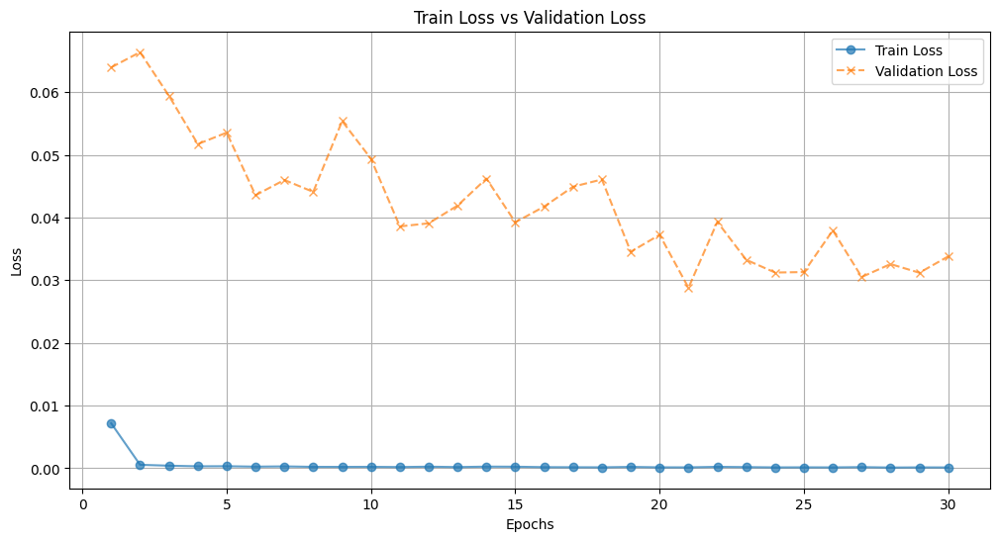

In [ ]:
# 에포크 범위 생성
epochs = list(range(1, wandb.config.epochs + 1))

# Train Loss / Validation Loss Plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_loss_history, label='Train Loss', marker='o', linestyle='-', alpha=0.7)
plt.plot(epochs, val_loss_history, label='Validation Loss', marker='x', linestyle='--', alpha=0.7)
plt.title('Train Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


RMSE

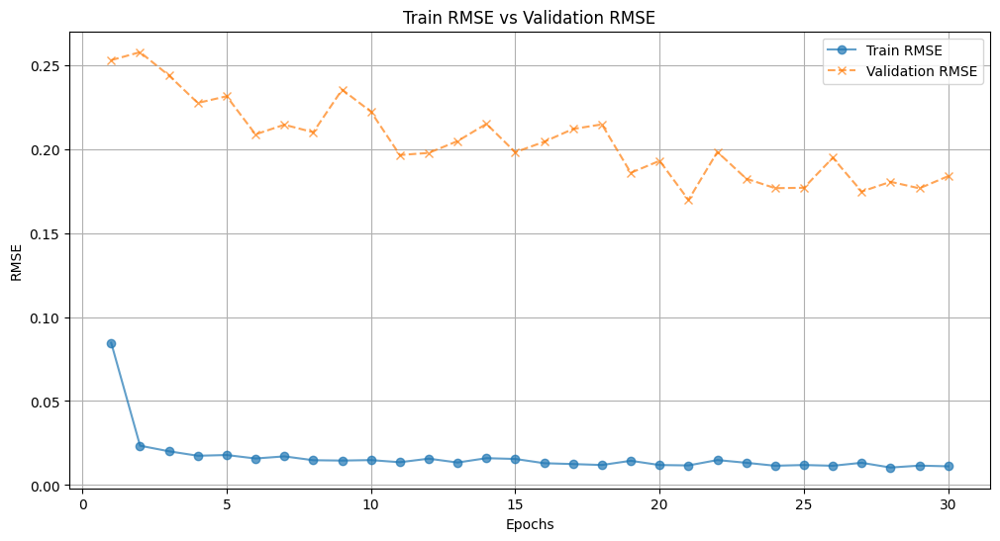

In [ ]:
import numpy as np

# RMSE 계산
train_rmse = np.sqrt(train_loss_history)
val_rmse = np.sqrt(val_loss_history)

# RMSE Plot
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_rmse, label='Train RMSE', marker='o', linestyle='-', alpha=0.7)
plt.plot(epochs, val_rmse, label='Validation RMSE', marker='x', linestyle='--', alpha=0.7)
plt.title('Train RMSE vs Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.grid(True)
plt.show()


Prediction

36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


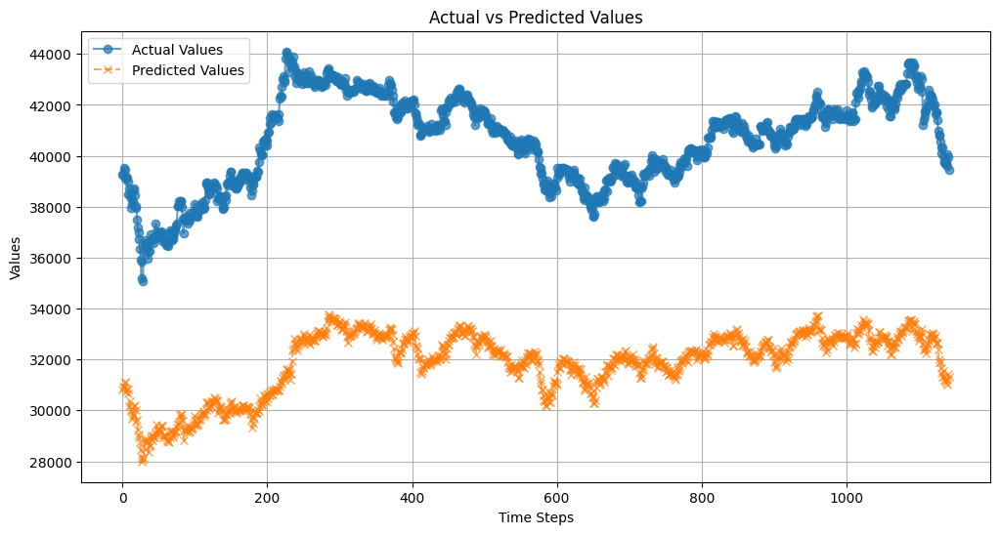

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)

y_pred = model_same_init.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

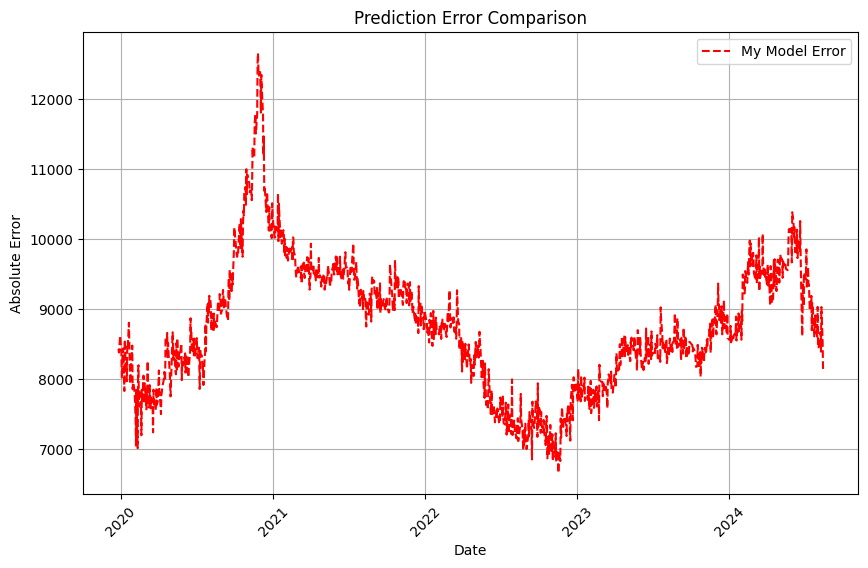

In [ ]:
dates = same_df[4692:-30].index
diff_my = abs(y_test - y_pred)
plt.figure(figsize = (10,6))
plt.plot(dates, diff_my, label="My Model Error", color='red', linestyle='--')
plt.title("Prediction Error Comparison")
plt.xlabel("Date")
plt.ylabel("Absolute Error")
plt.legend()
plt.xticks(rotation=45)
plt.grid()
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▅▆▄▄▄▆▅▃▃▃▄▃▃▄▄▂▃▁▃▂▁▁▃▁▂▁▂
val_mse,██▇▅▆▄▄▄▆▅▃▃▃▄▃▃▄▄▂▃▁▃▂▁▁▃▁▂▁▂
epoch,30
train_loss,0.00012
train_mse,0.00012
val_loss,0.0338
val_mse,0.0338


##### hyper1

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper1", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper1 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_same_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0547 - mse: 0.0547 - val_loss: 0.0372 - val_mse: 0.0372
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 7.5780e-04 - mse: 7.5780e-04 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.9287e-04 - mse: 3.9287e-04 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.1284e-04 - mse: 3.1284e-04 - val_loss: 0.0204 - val_mse: 0.0204
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.4405e-04 - mse: 2.4405e-04 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.2505e-04 - mse: 2.2505e-04 - val_loss: 0.0154 - val_mse: 0.0154
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.0141e-04 - mse: 2.0141e-04 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.7127e-04 - mse: 1.7127e-04 - val_loss: 0.0135 - val_mse:

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, 5, 64)               │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


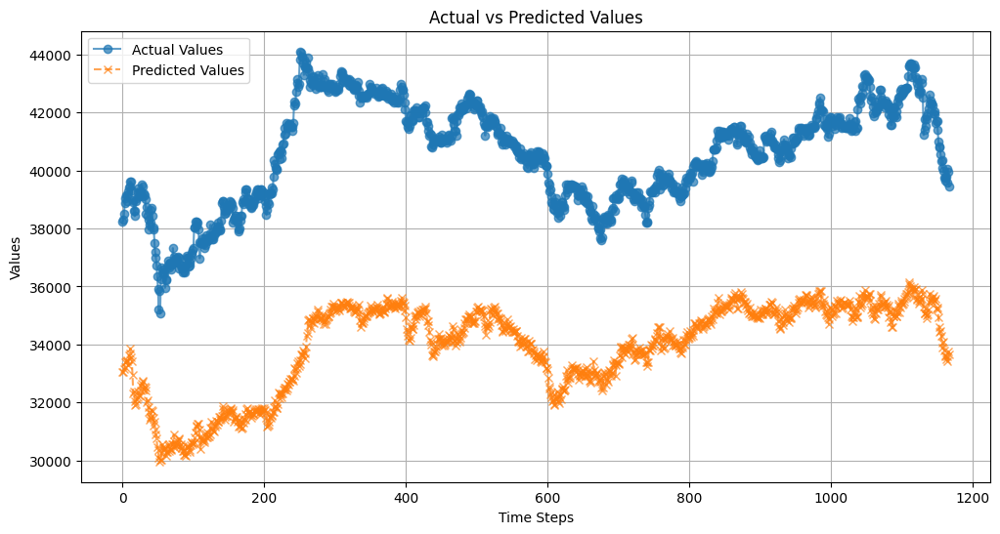

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper1.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▄▃▃▂▂▁▂▂▂▁▂▁▂▂▂▂▃▂▂▂▂▂▃▃▂▂▂▂
val_mse,█▃▄▃▃▂▂▁▂▂▂▁▂▁▂▂▂▂▃▂▂▂▂▂▃▃▂▂▂▂
epoch,30
train_loss,0.00012
train_mse,0.00012
val_loss,0.01781
val_mse,0.01781


##### hyper2

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper2", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper2.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0550 - mse: 0.0550 - val_loss: 0.0473 - val_mse: 0.0473
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 6.0101e-04 - mse: 6.0101e-04 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 3.9062e-04 - mse: 3.9062e-04 - val_loss: 0.0266 - val_mse: 0.0266
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.1083e-04 - mse: 3.1083e-04 - val_loss: 0.0214 - val_mse: 0.0214
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.3534e-04 - mse: 2.3534e-04 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.0066e-04 - mse: 2.0066e-04 - val_loss: 0.0182 - val_mse: 0.0182
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.1015e-04 - mse: 2.1015e-04 - val_loss: 0.0199 - val_mse: 0.0199
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.7430e-04 - mse: 1.7430e-04 - val_loss: 0.0181 - val_mse:

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 5, 64)               │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 196,229 (766.52 KB)

 Trainable params: 65,409 (255.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 130,820 (511.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


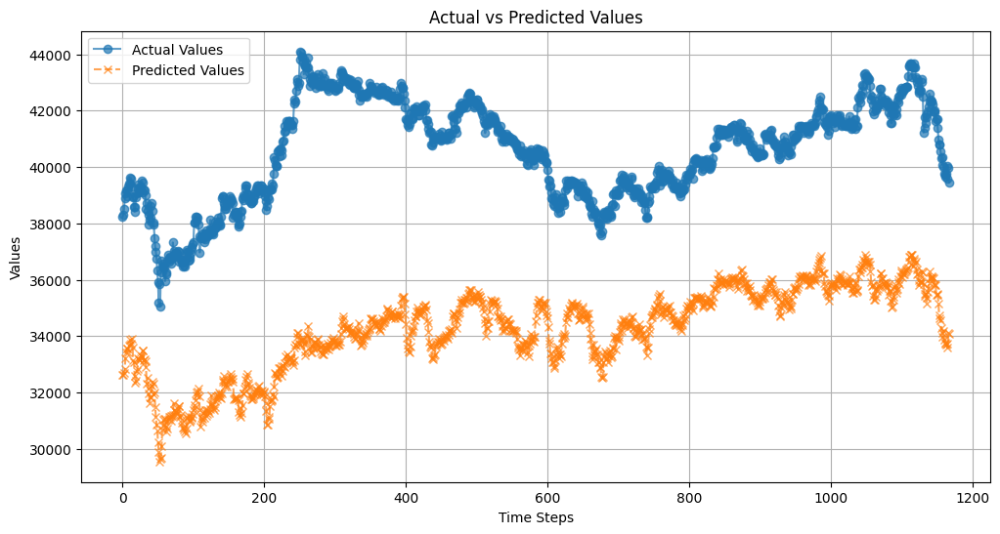

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper2.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▃▂▁▁▂▁▁▁▁▂▂▂▂▁▁▂▂▁▁▂▂▂▂▂▂▂▁▂
val_mse,█▅▃▂▁▁▂▁▁▁▁▂▂▂▂▁▁▂▂▁▁▂▂▂▂▂▂▂▁▂
epoch,30
train_loss,0.00014
train_mse,0.00014
val_loss,0.01986
val_mse,0.01986


##### hyper3

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper3", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper3.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper3 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper3.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper3.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper3.summary()

wandb: Currently logged in as: yebin. Use `wandb login --relogin` to force relogin


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0752 - mse: 0.0752 - val_loss: 0.0401 - val_mse: 0.0401
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 7.7117e-04 - mse: 7.7117e-04 - val_loss: 0.0288 - val_mse: 0.0288
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.7469e-04 - mse: 4.7469e-04 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.1541e-04 - mse: 4.1541e-04 - val_loss: 0.0234 - val_mse: 0.0234
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.2935e-04 - mse: 3.2935e-04 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.9992e-04 - mse: 2.9992e-04 - val_loss: 0.0191 - val_mse: 0.0191
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.3509e-04 - mse: 2.3509e-04 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.5012e-04 - mse: 2.5012e-04 - val_loss: 0.0158 - val_mse: 0.0

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 5, 64)               │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 295,301 (1.13 MB)

 Trainable params: 98,433 (384.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 196,868 (769.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


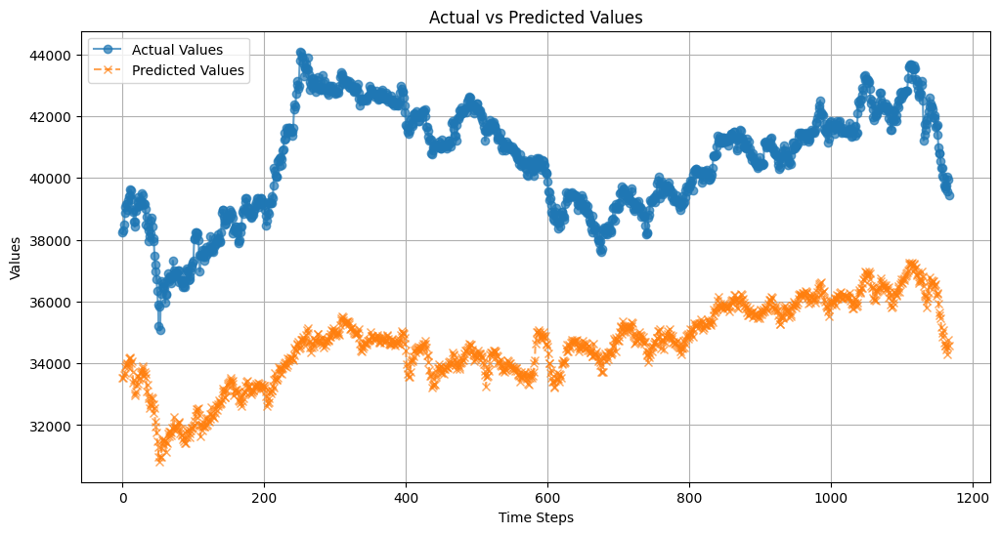

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper3.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▄▃▂▂▂▂▂▁▁▁▁▂▂▁▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▁▂▂▂▁▂▂▁
val_mse,█▅▄▄▃▂▂▂▂▂▁▁▁▁▂▁▂▂▂▂▂▁▂▂▃▂▂▂▂▂▁▂▂▂▂▂▁▂▂▁
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.01369
val_mse,0.01369


##### 4

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper4", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper4.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper4 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper4.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper4.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper4.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0555 - mse: 0.0555 - val_loss: 0.0322 - val_mse: 0.0322
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.8474e-04 - mse: 5.8474e-04 - val_loss: 0.0256 - val_mse: 0.0256
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 4.1536e-04 - mse: 4.1536e-04 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.0401e-04 - mse: 3.0401e-04 - val_loss: 0.0190 - val_mse: 0.0190
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.2075e-04 - mse: 3.2075e-04 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.7825e-04 - mse: 2.7825e-04 - val_loss: 0.0187 - val_mse: 0.0187
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.4052e-04 - mse: 2.4052e-04 - val_loss: 0.0158 - val_mse: 0.0158
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.0985e-04 - mse: 2.0985e-04 - val_loss: 0.0156 - val_mse: 0.

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 459,269 (1.75 MB)

 Trainable params: 153,089 (598.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 306,180 (1.17 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


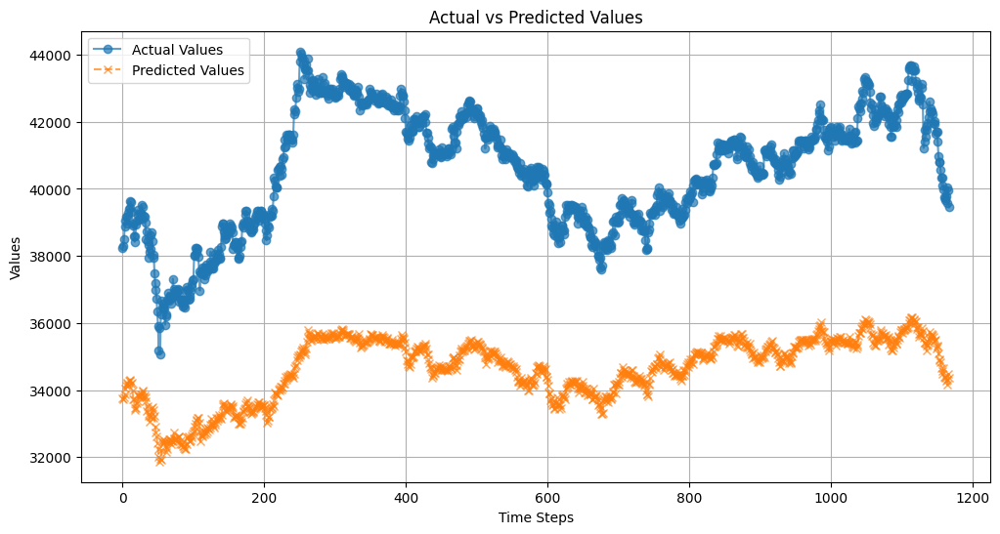

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper4.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▆▄▄▃▂▂▂▃▃▂▂▂▂▂▃▃▂▂▂▂▃▂▂▂▃▃▂▃▂▃▃▂▂▂▁▁▂▂▂
val_mse,█▆▄▄▃▂▂▂▃▃▂▂▂▂▂▃▂▂▂▂▂▃▂▂▂▃▃▂▃▂▃▃▂▂▂▁▁▂▂▂
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.01317
val_mse,0.01317


##### 5

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper5", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper5.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper5 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper5.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper5.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper5.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0893 - mse: 0.0893 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 8.1930e-04 - mse: 8.1930e-04 - val_loss: 0.0242 - val_mse: 0.0242
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 4.4888e-04 - mse: 4.4888e-04 - val_loss: 0.0229 - val_mse: 0.0229
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.6739e-04 - mse: 3.6739e-04 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.5442e-04 - mse: 3.5442e-04 - val_loss: 0.0226 - val_mse: 0.0226
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.5175e-04 - mse: 3.5175e-04 - val_loss: 0.0198 - val_mse: 0.0198
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.0798e-04 - mse: 3.0798e-04 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 2.8381e-04 - mse: 2.8381e-04 - val_loss: 0.0151 - val_mse:

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 626,309 (2.39 MB)

 Trainable params: 208,769 (815.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 417,540 (1.59 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


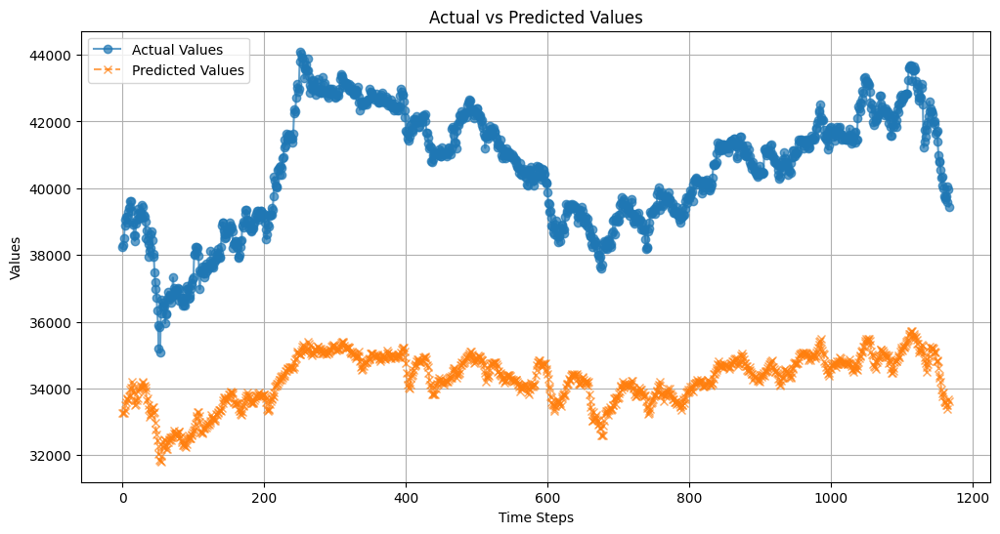

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper5.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▄▄▃▂▁▂▂▂▂▂▁▂▁▁▁▁▂▃▂▂▂▃▂▃▂▂▂▁▂▃▃▂▂▂▃▂▂▂
val_mse,█▄▄▄▄▃▂▁▂▂▂▂▁▂▁▁▁▁▂▃▂▂▂▃▂▃▂▂▂▁▃▃▂▂▂▃▂▂▂▂
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.0158
val_mse,0.0158


##### 6

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper6", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper6.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper6 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper6.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper6.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper6.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - loss: 0.0959 - mse: 0.0959 - val_loss: 0.0341 - val_mse: 0.0341
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 9.0335e-04 - mse: 9.0335e-04 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.4409e-04 - mse: 4.4409e-04 - val_loss: 0.0186 - val_mse: 0.0186
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.3687e-04 - mse: 3.3687e-04 - val_loss: 0.0138 - val_mse: 0.0138
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.2233e-04 - mse: 3.2233e-04 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.0398e-04 - mse: 3.0398e-04 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.8229e-04 - mse: 2.8229e-04 - val_loss: 0.0173 - val_mse: 0.0173
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.1988e-04 - mse: 3.1988e-04 - val_loss: 0.0194 - val_mse: 0.019

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                       │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_11 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_12 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_13 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 638,981 (2.44 MB)

 Trainable params: 212,993 (832.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 425,988 (1.63 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


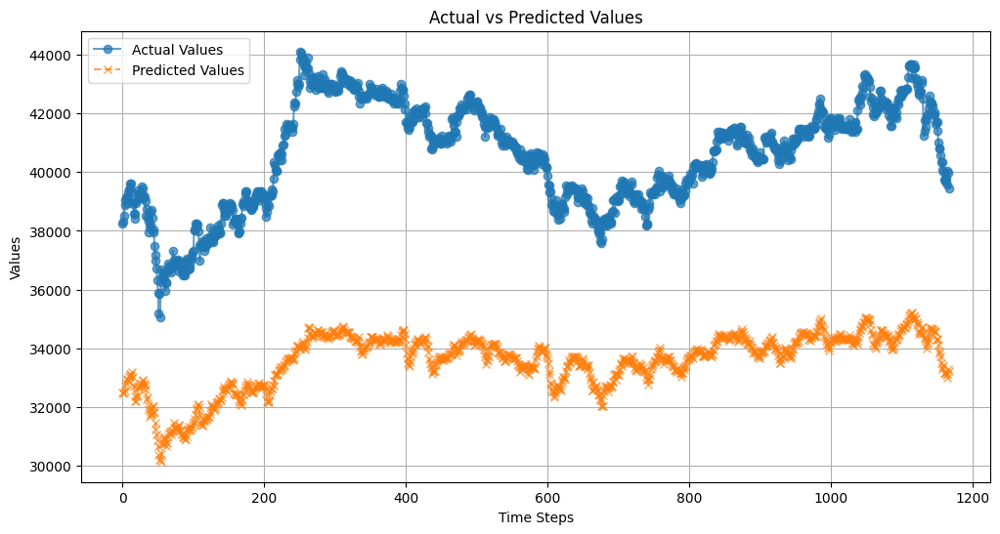

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper6.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆▆▂▅▁▇▄▁▄▄▄▆▄▅▄▃▅▄▅▄▄▅▄▅▅▃█▅▅▅▇▆▆▆▃▄▇▅▅▇
val_mse,█▃▃▁▃▃▃▂▁▂▁▂▃▂▃▁▂▁▃▂▂▂▂▂▂▂▂▂▄▃▃▃▃▃▃▂▂▄▃▃
epoch,50
train_loss,0.00015
train_mse,0.00015
val_loss,0.01945
val_mse,0.01945


##### 7

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper7", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper7.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper7 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper7.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper7.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper7.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1298 - mse: 0.1298 - val_loss: 0.0306 - val_mse: 0.0306
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 9.1952e-04 - mse: 9.1952e-04 - val_loss: 0.0238 - val_mse: 0.0238
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 5.4314e-04 - mse: 5.4314e-04 - val_loss: 0.0200 - val_mse: 0.0200
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 5.2741e-04 - mse: 5.2741e-04 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.9311e-04 - mse: 3.9311e-04 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.8409e-04 - mse: 3.8409e-04 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.3286e-04 - mse: 3.3286e-04 - val_loss: 0.0131 - val_mse: 0.0131
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.4079e-04 - mse: 4.4079e-04 - val_loss: 0.0173 - val_mse:

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_14 (LSTM)                       │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_15 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_16 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_17 (LSTM)                       │ (None, 5, 32)               │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_18 (LSTM)                       │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 614,405 (2.34 MB)

 Trainable params: 204,801 (800.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 409,604 (1.56 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step


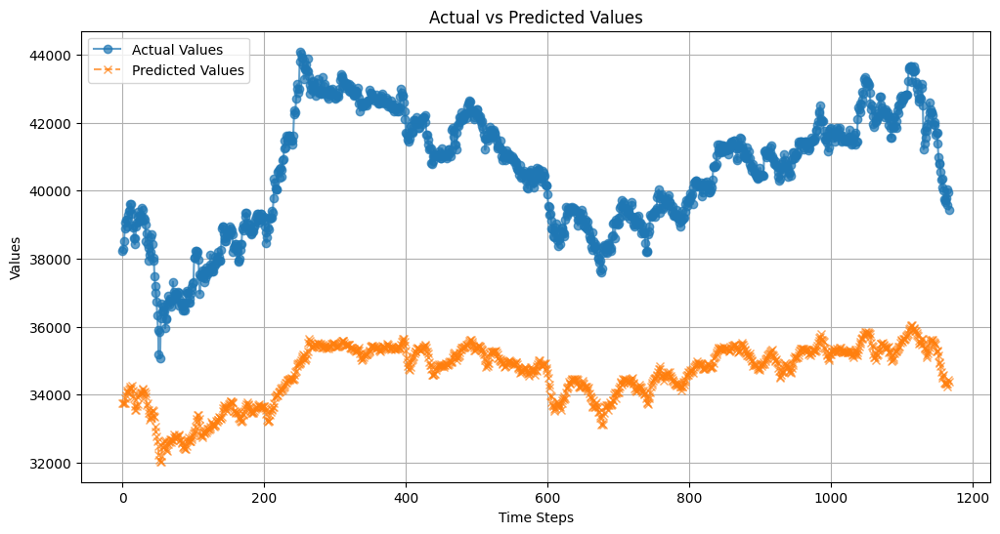

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper7.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▄▃▁▃▂▂▂▂▂▂▁▂▂▂▂▂▆▃▂▂▂▂▃▂▂▁▂▃▃▂▁▂▂▂▁▃▁
val_mse,█▅▄▄▂▁▃▂▂▂▂▂▂▁▂▂▂▁▃▂▃▃▂▂▂▁▂▂▂▂▂▂▃▃▂▁▂▁▂▁
epoch,50
train_loss,0.00023
train_mse,0.00023
val_loss,0.01332
val_mse,0.01332


##### 8

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper8", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper8.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper8 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper8.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper8.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper8.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1252 - mse: 0.1252 - val_loss: 0.0545 - val_mse: 0.0545
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0635 - val_mse: 0.0635
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0726 - val_mse: 0.0726
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 9.3506e-04 - mse: 9.3506e-04 - val_loss: 0.0684 - val_mse: 0.0684
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 7.8271e-04 - mse: 7.8271e-04 - val_loss: 0.0717 - val_mse: 0.0717
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 6.4797e-04 - mse: 6.4797e-04 - val_loss: 0.0662 - val_mse: 0.0662
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 7.1692e-04 - mse: 7.1692e-04 - val_loss: 0.0642 - val_mse: 0.0642
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 6.7064e-04 - mse: 6.7064e-04 - val_loss: 0.0701 - val_mse: 0.0701
Epoch 9

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_19 (LSTM)                       │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_20 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 5, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_21 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_22 (LSTM)                       │ (None, 5, 32)               │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_23 (LSTM)                       │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 614,405 (2.34 MB)

 Trainable params: 204,801 (800.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 409,604 (1.56 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


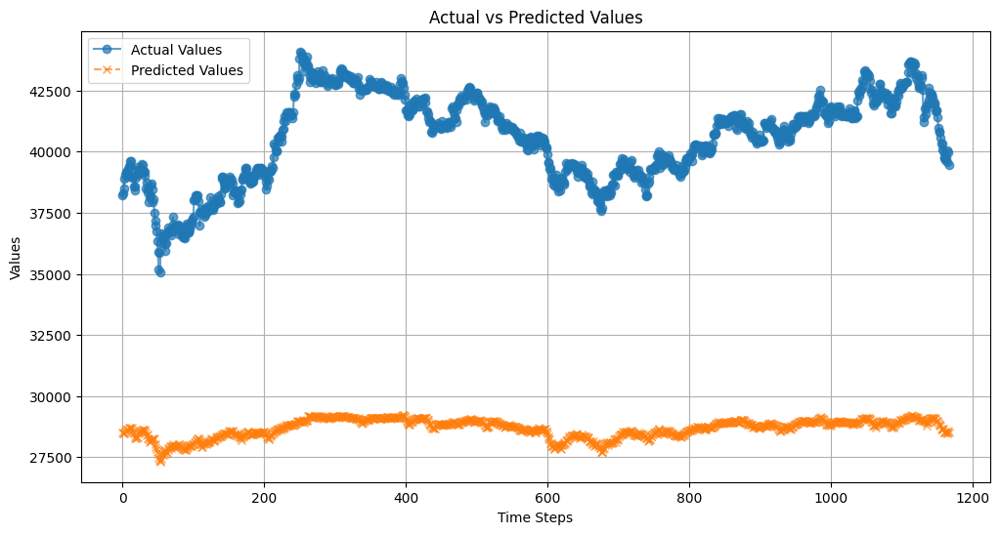

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper8.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▅█▆▇▅▇▅▆▇▇█▂▆▆▅▃▄▅▃▄▃▄▄▆▅▆▆▅▃▆▆▁▅▄▄▃▄▅▂
val_mse,▁▄█▆▇▇▅▆▇▄█▁▆▆▅▂▃▅▃▅▄▃▃▄▆▃▄▆▆▄█▆▆▄▃▃▃▃▄▂
epoch,50
train_loss,0.00026
train_mse,0.00026
val_loss,0.05606
val_mse,0.05606


##### 9

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▁▅▇▆▅█▆▄▄▃▄▇▇▆▃▇▆█▂▄▄▂▄▃▁▇▄█▃█▂▅▅▃▄▄▁▇▂▃
val_mse,▁▅▆▅▃▄▄▄▂▄▇▆▃▄▇█▂▄▃▄▄▃▂▄▇█▃█▄▃▅▃▄▁▄▇▅▂▃▃
epoch,50
train_loss,0.0002
train_mse,0.0002
val_loss,0.06135
val_mse,0.06135


In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper9", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper9.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper9 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.Dropout(0.2),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    #tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper9.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper9.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper9.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.0960 - mse: 0.0960 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0852 - val_mse: 0.0852
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0756 - val_mse: 0.0756
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 7.7478e-04 - mse: 7.7478e-04 - val_loss: 0.0883 - val_mse: 0.0883
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 5.5417e-04 - mse: 5.5417e-04 - val_loss: 0.0642 - val_mse: 0.0642
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 5.7470e-04 - mse: 5.7470e-04 - val_loss: 0.0586 - val_mse: 0.0586
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 4.8776e-04 - mse: 4.8776e-04 - val_loss: 0.0657 - val_mse: 0.0657
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 4.3435e-04 - mse: 4.3435e-04 - val_loss: 0.0682 - val_mse: 0.0682
Epoch 9

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_4 (Bidirectional)      │ (None, 5, 256)              │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_5 (Bidirectional)      │ (None, 5, 128)              │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 5, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_6 (Bidirectional)      │ (None, 5, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_7 (Bidirectional)      │ (None, 5, 64)               │          41,216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_33 (LSTM)                       │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,522,565 (5.81 MB)

 Trainable params: 507,521 (1.94 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,015,044 (3.87 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


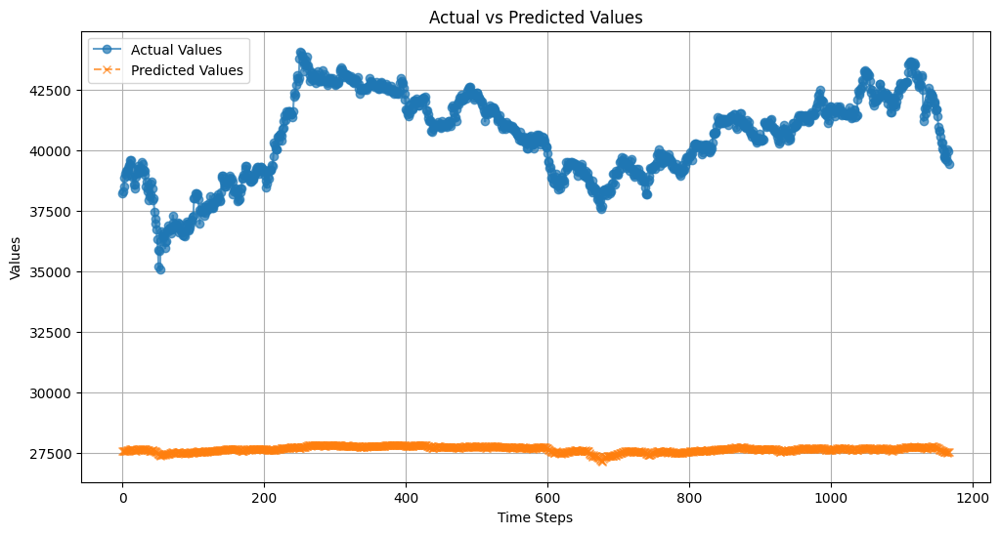

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper9.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▄▇▅█▂▃▃▄▃▄▁▄▂▆▂▃▂▃▃▃▃▂▃▃▃▃▃▅▁▁▄▂▂▂▁▃▂▂▂▃
val_mse,▄▇▅█▂▃▃▄▃▄▂▄▃▆▂▂▃▁▄▃▃▂▄▃▃▃▅▁▂▁▄▃▂▂▁▃▂▂▂▃
epoch,50
train_loss,0.00023
train_mse,0.00023
val_loss,0.06729
val_mse,0.06729


##### 10

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper10", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper10.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper10 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    #tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper10.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper10.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper10.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1022 - mse: 0.1022 - val_loss: 0.0764 - val_mse: 0.0764
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0014 - mse: 0.0014 - val_loss: 0.0874 - val_mse: 0.0874
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 8.2956e-04 - mse: 8.2956e-04 - val_loss: 0.0793 - val_mse: 0.0793
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 7.4357e-04 - mse: 7.4357e-04 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.6722e-04 - mse: 5.6722e-04 - val_loss: 0.0760 - val_mse: 0.0760
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 4.0848e-04 - mse: 4.0848e-04 - val_loss: 0.0676 - val_mse: 0.0676
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 4.9092e-04 - mse: 4.9092e-04 - val_loss: 0.0700 - val_mse: 0.0700
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 3.7893e-04 - mse: 3.7893e-04 - val_loss: 0.0739 - val_mse: 0.0739

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_8 (Bidirectional)      │ (None, 5, 256)              │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_9 (Bidirectional)      │ (None, 5, 128)              │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_10 (Bidirectional)     │ (None, 5, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_11 (Bidirectional)     │ (None, 5, 64)               │          41,216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_38 (LSTM)                       │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,522,565 (5.81 MB)

 Trainable params: 507,521 (1.94 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,015,044 (3.87 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


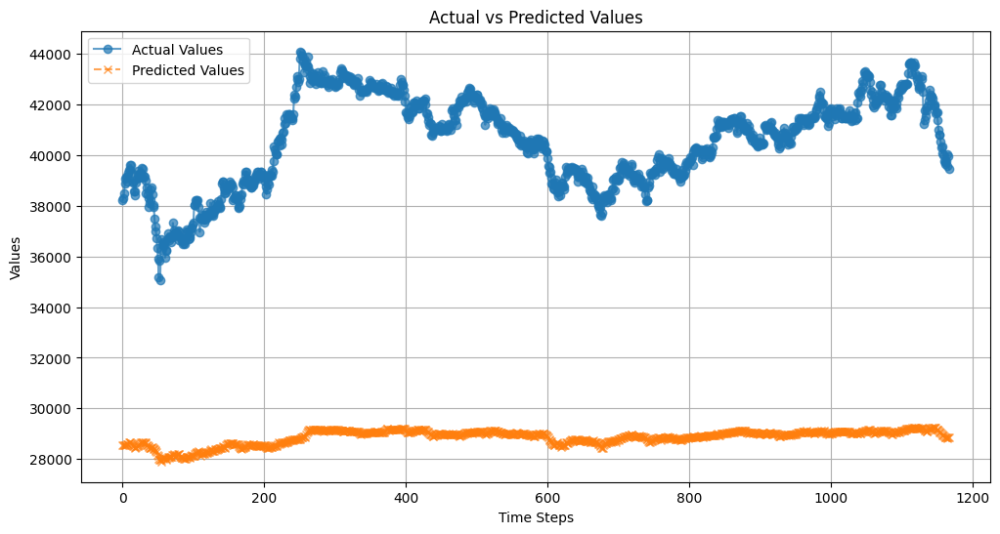

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper10.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆█▆▇▆▄▅▅▄▄▄▅▆▆▆▅▃▄▄▄▄▃▄▂▄▃▄▃▅▅▄▃▄▃▃▂▃▃▂▁
val_mse,▆█▆▇▆▄▅▅▄▆▅▆▆▆▅▃▄▄▄▃▃▄▂▄▃▄▃▅▅▄▃▄▃▃▅▃▃▂▂▁
epoch,50
train_loss,0.00019
train_mse,0.00019
val_loss,0.0545
val_mse,0.0545


##### 11

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper11", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper11.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper11 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper11.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper11.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper11.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0947 - mse: 0.0947 - val_loss: 0.0348 - val_mse: 0.0348
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 5.8117e-04 - mse: 5.8117e-04 - val_loss: 0.0314 - val_mse: 0.0314
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 3.9597e-04 - mse: 3.9597e-04 - val_loss: 0.0271 - val_mse: 0.0271
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 2.5910e-04 - mse: 2.5910e-04 - val_loss: 0.0218 - val_mse: 0.0218
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.2232e-04 - mse: 2.2232e-04 - val_loss: 0.0273 - val_mse: 0.0273
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.2595e-04 - mse: 2.2595e-04 - val_loss: 0.0221 - val_mse: 0.0221
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 2.0703e-04 - mse: 2.0703e-04 - val_loss: 0.0209 - val_mse: 0.0209
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 1.8718e-04 - mse: 1.8718e-04 - val_loss: 0.0211 - val_mse

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_12 (Bidirectional)     │ (None, 5, 256)              │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_13 (Bidirectional)     │ (None, 5, 128)              │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_14 (Bidirectional)     │ (None, 5, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_15 (Bidirectional)     │ (None, 5, 64)               │          41,216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,497,989 (5.71 MB)

 Trainable params: 499,329 (1.90 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 998,660 (3.81 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step


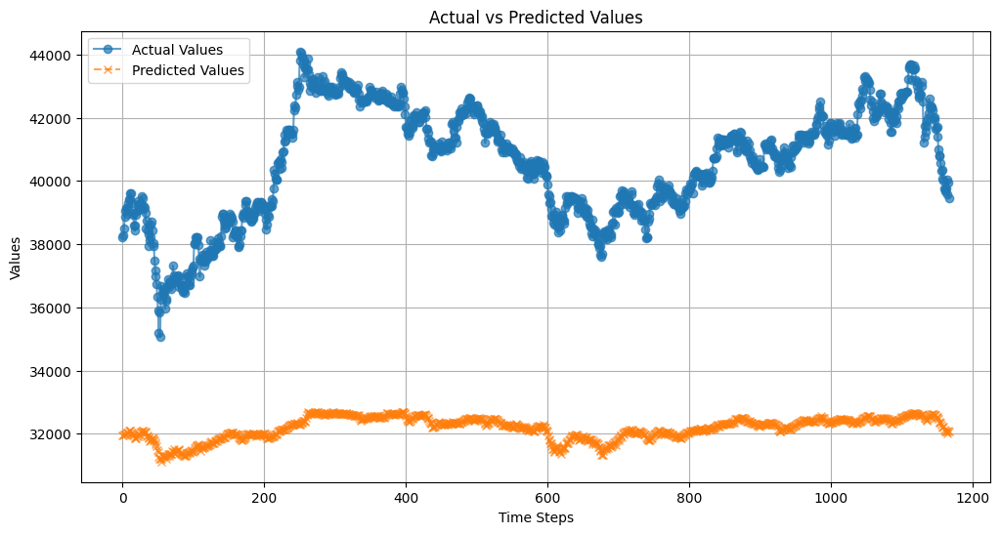

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper11.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▅▅▃▃▃▃▃▃▂▂▄▂▃▃▁▂▃▃▂▂▃▂▃▂▂▄▁▂▂▄▂▂▂▃▃▃▃▂
val_mse,█▇▅▃▃▃▃▃▃▃▂▂▂▄▂▂▃▁▂▃▂▂▃▂▃▂▂▄▁▂▂▄▂▂▂▃▃▃▃▂
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.01984
val_mse,0.01984


##### 12

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper12", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper12.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper12 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper12.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper12.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper12.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.0254 - val_mse: 0.0254
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 5.9482e-04 - mse: 5.9482e-04 - val_loss: 0.0245 - val_mse: 0.0245
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.8851e-04 - mse: 3.8851e-04 - val_loss: 0.0206 - val_mse: 0.0206
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.6180e-04 - mse: 2.6180e-04 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.1922e-04 - mse: 2.1922e-04 - val_loss: 0.0168 - val_mse: 0.0168
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.6363e-04 - mse: 1.6363e-04 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6674e-04 - mse: 1.6674e-04 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.9357e-04 - mse: 1.9357e-04 - val_loss: 0.0168 - val_mse:

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_16 (Bidirectional)     │ (None, 5, 128)              │          56,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_17 (Bidirectional)     │ (None, 5, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_46 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 626,309 (2.39 MB)

 Trainable params: 208,769 (815.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 417,540 (1.59 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step


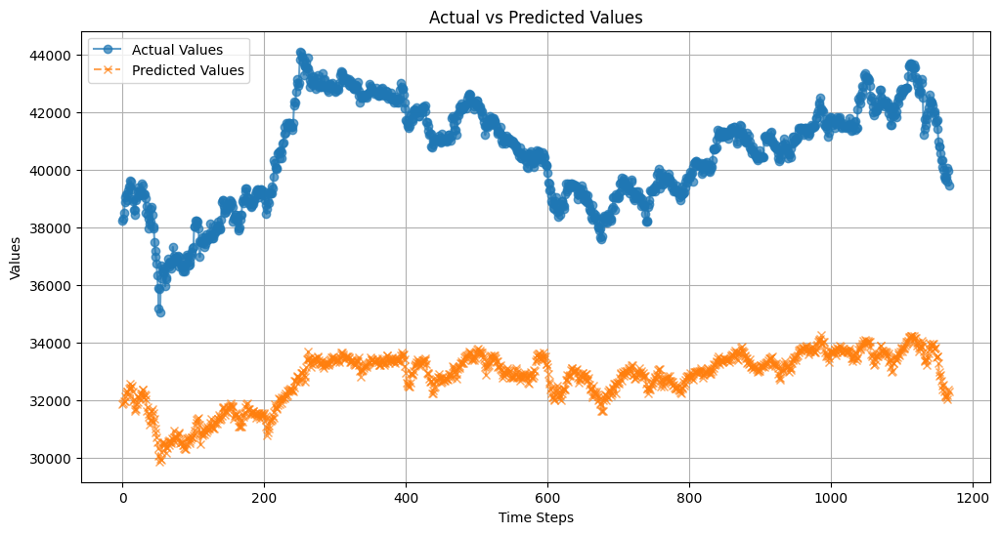

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper12.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▅▂▂▁▂▁▃▂▄▂▄▂▃▂▁▁▃▄▂▃▃▄▂▄▂▄▅▅▃▄▄▃▅▄▁▄▄▆
val_mse,█▇▅▂▂▁▂▁▂▄▂▄▂▃▁▁▃▁▃▄▂▃▄▂▃▂▄▅▅▆▃▄▄▃▅▄▁▄▄▆
epoch,50
train_loss,0.00017
train_mse,0.00017
val_loss,0.02207
val_mse,0.02207


##### 13

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper13", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper13.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper13 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper13.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper13.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper13.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.1848 - mse: 0.1848 - val_loss: 0.1216 - val_mse: 0.1216
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.1112 - val_mse: 0.1112
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 8.5555e-04 - mse: 8.5555e-04 - val_loss: 0.0936 - val_mse: 0.0936
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 7.1007e-04 - mse: 7.1007e-04 - val_loss: 0.0814 - val_mse: 0.0814
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.5830e-04 - mse: 5.5830e-04 - val_loss: 0.0692 - val_mse: 0.0692
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.5060e-04 - mse: 4.5060e-04 - val_loss: 0.0568 - val_mse: 0.0568
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.0582e-04 - mse: 4.0582e-04 - val_loss: 0.0496 - val_mse: 0.0496
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.6463e-04 - mse: 3.6463e-04 - val_loss: 0.0461 - val_mse: 0.0461
Epoch 

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_50 (LSTM)                       │ (None, 5, 64)               │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_51 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_52 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_1 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 295,685 (1.13 MB)

 Trainable params: 98,561 (385.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 197,124 (770.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


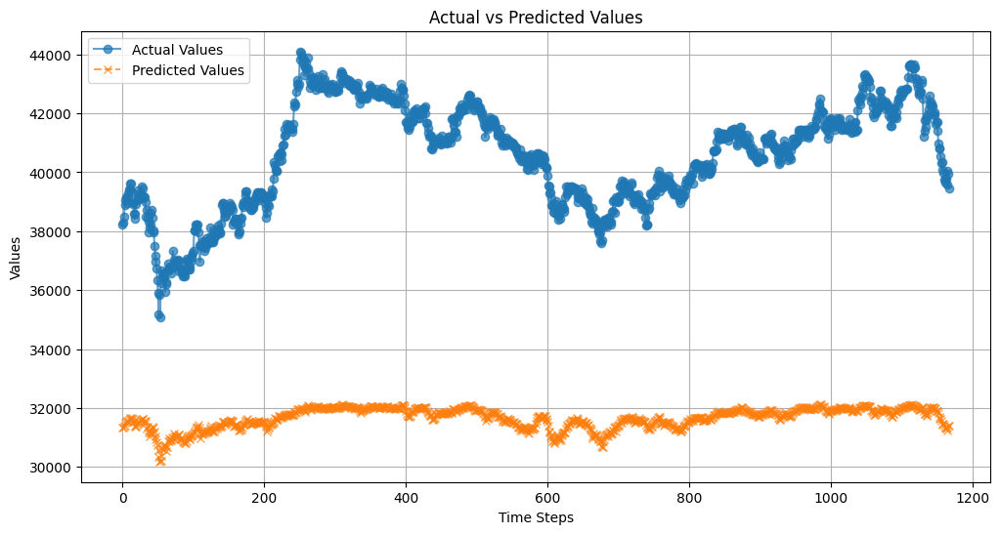

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper13.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▅▄▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▇▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.02368
val_mse,0.02368


##### 14

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper14", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper14.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same, y_train_same, time_steps)
X_val, y_val = create_sequences(x_val_same, y_val_same, time_steps)

model_same_hyper14 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper14.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper14.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper14.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1932 - mse: 0.1932 - val_loss: 0.2094 - val_mse: 0.2094
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0412 - mse: 0.0412 - val_loss: 0.0963 - val_mse: 0.0963
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 9.4165e-04 - mse: 9.4165e-04 - val_loss: 0.0682 - val_mse: 0.0682
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 6.0023e-04 - mse: 6.0023e-04 - val_loss: 0.0588 - val_mse: 0.0588
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 3.8577e-04 - mse: 3.8577e-04 - val_loss: 0.0530 - val_mse: 0.0530
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 3.1127e-04 - mse: 3.1127e-04 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.3171e-04 - mse: 2.3171e-04 - val_loss: 0.0427 - val_mse: 0.0427
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 2.3167e-04 - mse: 2.3167e-04 - val_loss: 0.0430 - val_mse: 0.0430


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_18 (Bidirectional)     │ (None, 5, 128)              │          56,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_19 (Bidirectional)     │ (None, 5, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_55 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_2 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 626,693 (2.39 MB)

 Trainable params: 208,897 (816.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 417,796 (1.59 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


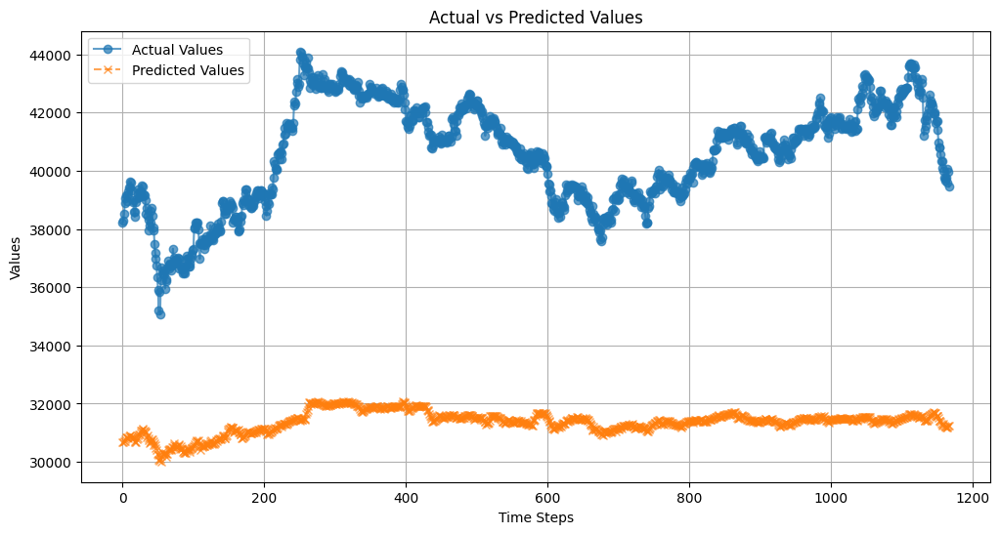

In [ ]:
X_test, y_test = create_sequences(x_test_same, y_test_same, wandb.config.time_steps)
y_test = y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper14.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.02633
val_mse,0.02633


#### Feature Selection

##### 15

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper15", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64, 64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper15.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_same, selected_y_train_same, time_steps)
X_val, y_val = create_sequences(selected_x_val_same, selected_y_val_same, time_steps)

model_same_hyper15 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_same)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper15.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper15.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper15.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0877 - mse: 0.0877 - val_loss: 0.0233 - val_mse: 0.0233
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 5.6574e-04 - mse: 5.6574e-04 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.6399e-04 - mse: 3.6399e-04 - val_loss: 0.0134 - val_mse: 0.0134
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.7813e-04 - mse: 2.7813e-04 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7547e-04 - mse: 2.7547e-04 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.3793e-04 - mse: 2.3793e-04 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.6229e-04 - mse: 2.6229e-04 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.4405e-04 - mse: 2.4405e-04 - val_loss: 0.0120 - val_mse: 0.0

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_45 (LSTM)                       │ (None, 5, 64)               │          21,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_46 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_47 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 275,333 (1.05 MB)

 Trainable params: 91,777 (358.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 183,556 (717.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


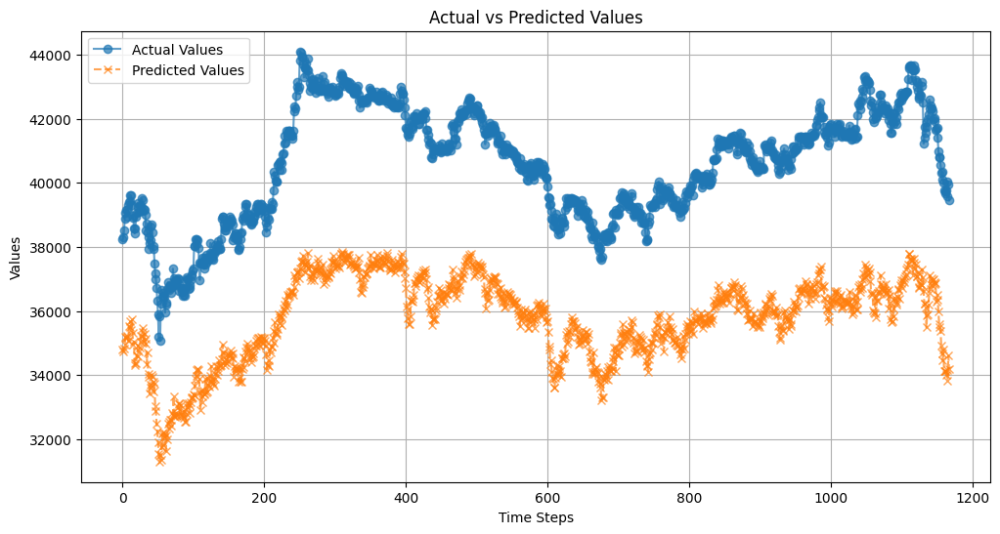

In [ ]:
X_test, y_test = create_sequences(selected_x_test_same, selected_y_test_same, wandb.config.time_steps)
y_test = selected_y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper15.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▃▂▁▁▂▃▁▂▁▁▂▂▂▂▂▂▂▂▃▂▃▂▃▂▃▁▁▂▂▂▂▂▁▁▂▁▂▂
val_mse,█▅▃▂▁▁▂▁▂▂▁▂▂▂▂▂▂▂▂▂▃▂▃▂▃▂▃▁▁▂▂▂▂▂▁▁▂▁▂▂
epoch,50
train_loss,0.00019
train_mse,0.00019
val_loss,0.01206
val_mse,0.01206


##### 16

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper16", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,128,128],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper16.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_same, selected_y_train_same, time_steps)
X_val, y_val = create_sequences(selected_x_val_same, selected_y_val_same, time_steps)

model_same_hyper16 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_same)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper16.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper16.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper16.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0636 - mse: 0.0636 - val_loss: 0.0165 - val_mse: 0.0165
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.5083e-04 - mse: 4.5083e-04 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.8901e-04 - mse: 2.8901e-04 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4724e-04 - mse: 2.4724e-04 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.4482e-04 - mse: 2.4482e-04 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.2300e-04 - mse: 2.2300e-04 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.1201e-04 - mse: 2.1201e-04 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.6297e-04 - mse: 2.6297e-04 - val_loss: 0.0097 - val_mse: 0.00

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_48 (LSTM)                       │ (None, 5, 128)              │          75,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_49 (LSTM)                       │ (None, 5, 128)              │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_50 (LSTM)                       │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,066,757 (4.07 MB)

 Trainable params: 355,585 (1.36 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 711,172 (2.71 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


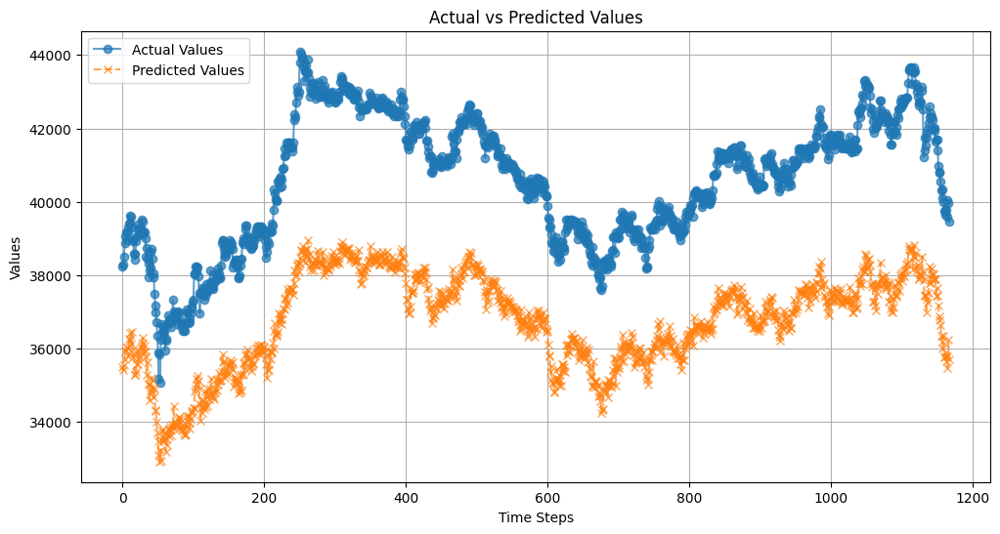

In [ ]:
X_test, y_test = create_sequences(selected_x_test_same, selected_y_test_same, wandb.config.time_steps)
y_test = selected_y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper16.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▂▁▁▂▃▂▂▂▂▂▃▂▁▁▂▂▃▂▄▂▂▂▃▂▂▂▂▂▂▃▄▂▂▂▂▂▄▂
val_mse,█▃▂▁▁▂▃▂▂▂▂▃▂▁▂▂▂▂▃▂▄▂▂▂▃▂▂▂▂▂▂▃▂▂▃▂▂▄▃▃
epoch,50
train_loss,0.00018
train_mse,0.00018
val_loss,0.01069
val_mse,0.01069


##### 17

In [ ]:
wandb.init(project="LSTM Final - Same", name="hyper17", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,128,128],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/hyper17.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_same, selected_y_train_same, time_steps)
X_val, y_val = create_sequences(selected_x_val_same, selected_y_val_same, time_steps)

model_same_hyper17 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_same)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_hyper17.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_hyper17.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_hyper17.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0408 - mse: 0.0408 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.4401e-04 - mse: 2.4401e-04 - val_loss: 0.0118 - val_mse: 0.0118
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.4482e-04 - mse: 1.4482e-04 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 1.4185e-04 - mse: 1.4185e-04 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.5087e-04 - mse: 1.5087e-04 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 1.1995e-04 - mse: 1.1995e-04 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 1.4023e-04 - mse: 1.4023e-04 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.3867e-04 - mse: 1.3867e-04 - val_loss: 0.0114 - val_mse:

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_8 (Bidirectional)      │ (None, 5, 256)              │         151,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_9 (Bidirectional)      │ (None, 5, 256)              │         394,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_53 (LSTM)                       │ (None, 128)                 │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,278,661 (8.69 MB)

 Trainable params: 759,553 (2.90 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,519,108 (5.79 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


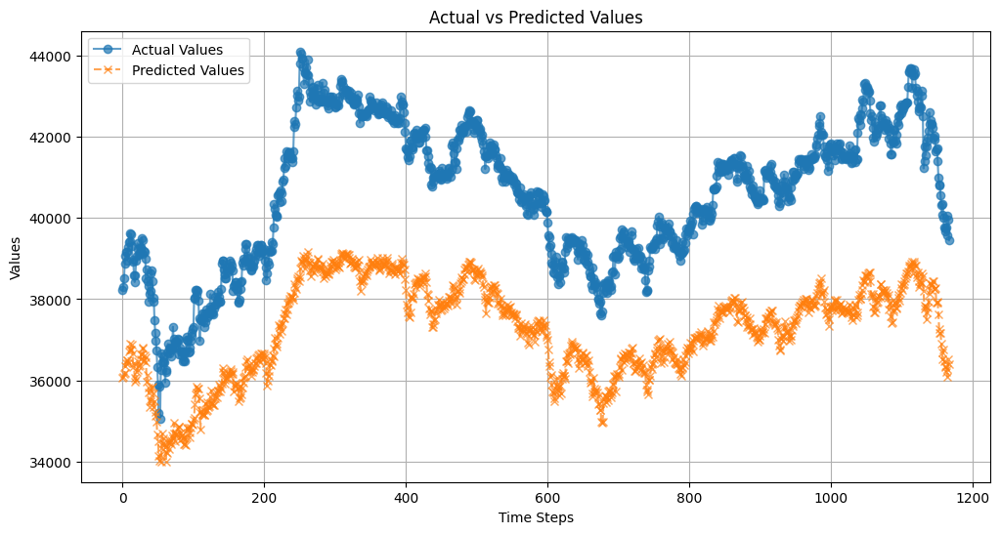

In [ ]:
X_test, y_test = create_sequences(selected_x_test_same, selected_y_test_same, wandb.config.time_steps)
y_test = selected_y_test_same[wandb.config.time_steps:]

y_pred = model_same_hyper17.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▄▁▂▂▃▄▄▄▄▄▅▅▄▅▅▅▄▂▇▆▄▂▅▃▅▄▇▅▂▄▃▄▄▄▂▃▄▁
val_mse,█▃▄▁▂▃▄▄▄▄▇▄▅▅▄▅▅▅▄▂▇▆▄▂▃▅▄▇▅▆▆▄▃▄▄▄▂▃▄▁
epoch,50
train_loss,0.00018
train_mse,0.00018
val_loss,0.0102
val_mse,0.0102


# LSTM - Interp

##### Initial

In [ ]:
wandb.init(project="LSTM Final - Interp", name="initial", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 30,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_Initial.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_int_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0429 - mse: 0.0429 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 6.3886e-04 - mse: 6.3886e-04 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.5768e-04 - mse: 4.5768e-04 - val_loss: 0.0251 - val_mse: 0.0251
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.6824e-04 - mse: 3.6824e-04 - val_loss: 0.0232 - val_mse: 0.0232
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7354e-04 - mse: 2.7354e-04 - val_loss: 0.0211 - val_mse: 0.0211
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.0614e-04 - mse: 3.0614e-04 - val_loss: 0.0178 - val_mse: 0.0178
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.5512e-04 - mse: 4.5512e-04 - val_loss: 0.0210 - val_mse: 0.0210
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 1.6064e-04 - mse: 1.6064e-04 - val_loss: 0.0193 - val_mse: 0

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_11 (LSTM)                       │ (None, 30, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_12 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


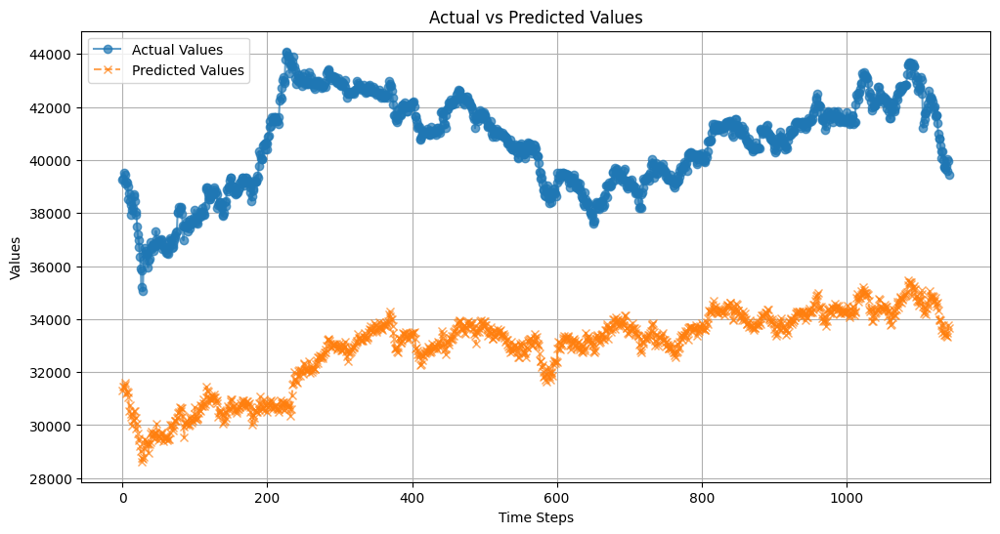

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps)
y_test = y_test_int[wandb.config.time_steps:]

y_pred = model_int_init.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▂▆▅▅▃▄▄▅▃▃▃▃▃▂▄▂▃▃▄█▆▄▅▂▃▂▃▁▄
val_mse,▂▂▆▅▅▃▄▄▅▃▃▃▃▃▂▄▂▃▃▄█▆▄▅▂▃▂▃▁▄
epoch,30
train_loss,0.00014
train_mse,0.00014
val_loss,0.01897
val_mse,0.01897


##### 1

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper1", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,128,128],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper1 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 3.4310e-04 - mse: 3.4310e-04 - val_loss: 0.0156 - val_mse: 0.0156
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.2697e-04 - mse: 2.2697e-04 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 1.9059e-04 - mse: 1.9059e-04 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 1.9297e-04 - mse: 1.9297e-04 - val_loss: 0.0133 - val_mse: 0.0133
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 1.4929e-04 - mse: 1.4929e-04 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 1.4957e-04 - mse: 1.4957e-04 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 1.3594e-04 - mse: 1.3594e-04 - val_loss: 0.0102 - val_mse:

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_2 (Bidirectional)      │ (None, 5, 256)              │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_3 (Bidirectional)      │ (None, 5, 256)              │         394,240 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 128)                 │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,358,533 (9.00 MB)

 Trainable params: 786,177 (3.00 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,572,356 (6.00 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


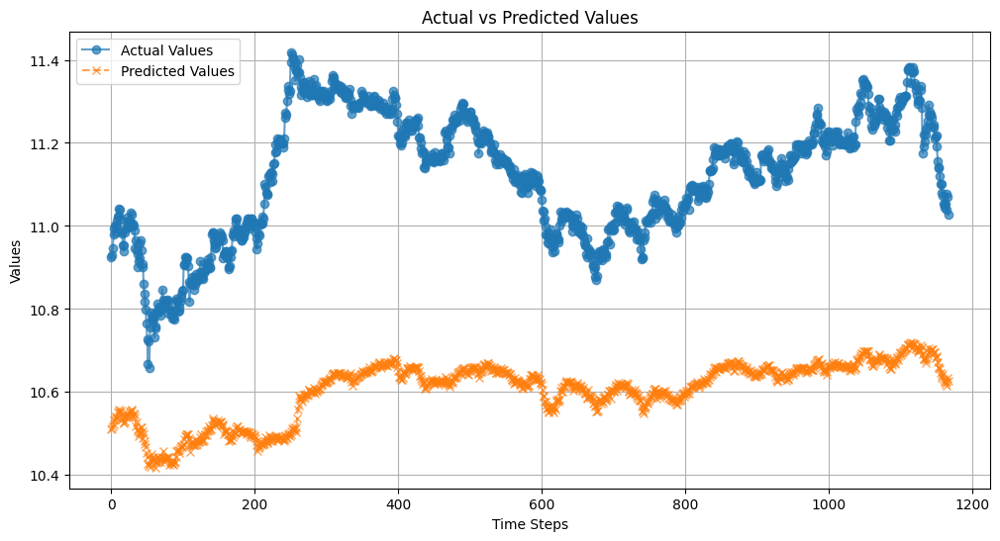

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps)
y_test = y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper1.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▃▂▃▁▁▂▁▂▂▂▄▂▂▃▁▂▂▂▃▃▂▆▄▂▃▄▃▃▄▃▃▅▄▃▂▄▄▄
val_mse,█▄▃▂▃▁▁▂▁▂▂▄▂▂▃▁▂▂▂▂▃▂▃▆▄▂▃▄▃▃▄▃▃▅▄▃▂▄▄▄
epoch,50
train_loss,0.00018
train_mse,0.00018
val_loss,0.01489
val_mse,0.01489


##### 2

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper2", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper2.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0672 - mse: 0.0672 - val_loss: 0.0223 - val_mse: 0.0223
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.6842e-04 - mse: 4.6842e-04 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.3538e-04 - mse: 3.3538e-04 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.0289e-04 - mse: 3.0289e-04 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.9266e-04 - mse: 2.9266e-04 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.6596e-04 - mse: 2.6596e-04 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.5543e-04 - mse: 2.5543e-04 - val_loss: 0.0124 - val_mse: 0.0124
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.3344e-04 - mse: 2.3344e-04 - val_loss: 0.0086 - val_mse: 0.00

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_38 (LSTM)                       │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_39 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_40 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 539,909 (2.06 MB)

 Trainable params: 179,969 (703.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 359,940 (1.37 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


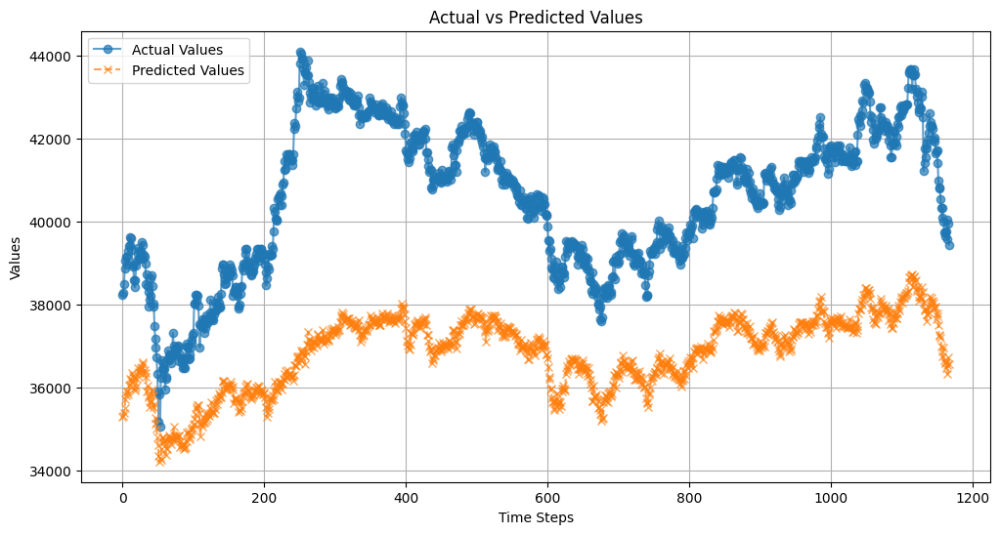

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps)
y_test = y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper2.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▄▂▁▂▂▂▁▁▁▂▂▂▂▂▃▃▂▃▂▃▂▂▂▂▂▃▂▂▂▃▁▂▃▂▂▁▁
val_mse,█▅▄▄▂▃▁▂▂▁▁▁▂▂▂▂▂▃▃▂▃▂▃▂▂▂▂▃▃▂▂▂▃▁▂▃▂▂▁▁
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.00865
val_mse,0.00865


##### 3

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper3", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper3.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int, y_train_int, time_steps)
X_val, y_val = create_sequences(x_val_int, y_val_int, time_steps)

model_int_hyper3 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper3.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper3.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper3.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0975 - mse: 0.0975 - val_loss: 0.0324 - val_mse: 0.0324
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 7.4384e-04 - mse: 7.4384e-04 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 4.5115e-04 - mse: 4.5115e-04 - val_loss: 0.0176 - val_mse: 0.0176
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.1703e-04 - mse: 4.1703e-04 - val_loss: 0.0189 - val_mse: 0.0189
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.1293e-04 - mse: 3.1293e-04 - val_loss: 0.0177 - val_mse: 0.0177
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.9863e-04 - mse: 2.9863e-04 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.0516e-04 - mse: 3.0516e-04 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.6936e-04 - mse: 2.6936e-04 - val_loss: 0.0169 - val_mse: 0

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_41 (LSTM)                       │ (None, 5, 128)              │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_42 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_44 (LSTM)                       │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 564,869 (2.15 MB)

 Trainable params: 188,289 (735.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 376,580 (1.44 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step


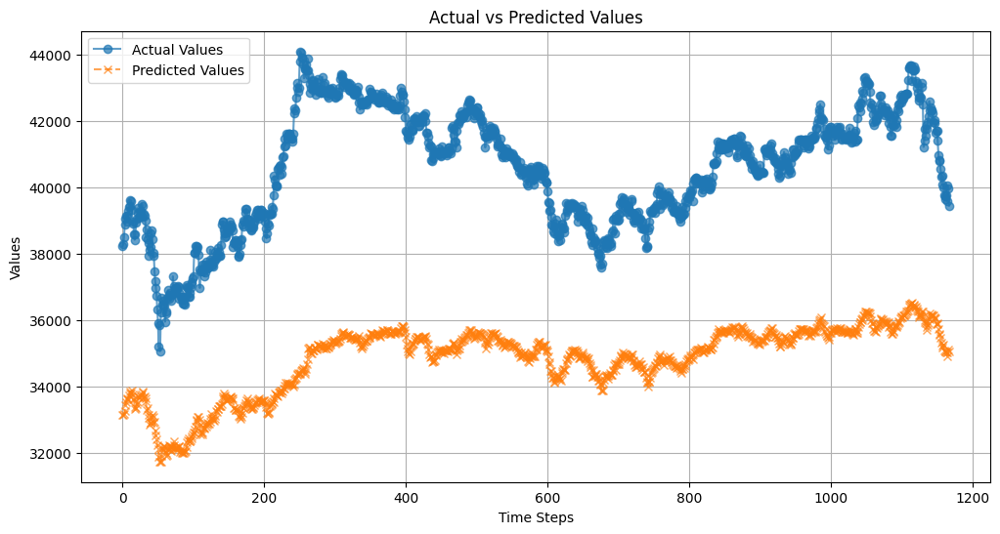

In [ ]:
X_test, y_test = create_sequences(x_test_int, y_test_int, wandb.config.time_steps)
y_test = y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper3.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
train_loss,█▅▄▃▃▃▃▃▃▃▃▂▃▃▃▂▂▂▂▃▂▂▂▃▂▂▁▁▁▁▁▁▁▁▁▁▂▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▄▃▃▃▃▂▃▂▂▂▂▂▁▂▂▁▁▂▂▂▂▂▂▃▂▂▂▁▁▃▂▂▂▂▁▂▁▂
val_mse,█▅▃▄▃▃▃▂▃▂▂▂▂▂▁▂▂▁▁▂▂▂▂▂▃▃▃▂▂▂▁▁▃▂▂▂▁▂▁▂
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.01487
val_mse,0.01487


#### Feature Selection

##### 4

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▂▁▂▁▁▁▂▂▂▂▁▁▄▂▂▂▂▂▃▂▄▃▃▃▃▄▄▄▃▃▃▄▄▃▃▁▃▃
val_mse,█▂▃▂▁▂▁▁▁▂▂▂▂▁▁▂▂▂▂▂▂▃▂▄▃▂▃▃▄▄▃▃▃▃▄▃▃▁▃▃
epoch,50
train_loss,0.00015
train_mse,0.00015
val_loss,0.00935
val_mse,0.00935


In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper4", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper4.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper4 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_int)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper4.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper4.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper4.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.1073 - mse: 0.1073 - val_loss: 0.0138 - val_mse: 0.0138
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.6234e-04 - mse: 3.6234e-04 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.7462e-04 - mse: 2.7462e-04 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 2.9739e-04 - mse: 2.9739e-04 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.6555e-04 - mse: 2.6555e-04 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.7859e-04 - mse: 2.7859e-04 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6959e-04 - mse: 2.6959e-04 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 2.4134e-04 - mse: 2.4134e-04 - val_loss: 0.0080 - val_mse:

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_31 (LSTM)                       │ (None, 5, 128)              │          72,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_32 (LSTM)                       │ (None, 5, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_33 (LSTM)                       │ (None, 5, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_34 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 589,829 (2.25 MB)

 Trainable params: 196,609 (768.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 393,220 (1.50 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


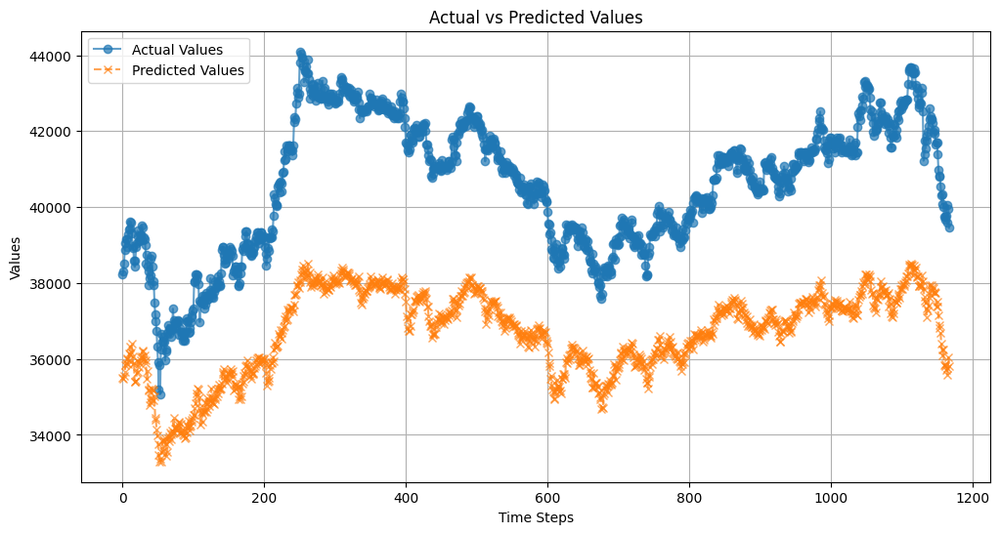

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper4.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

##### 5

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper5", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper5.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper5 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_int)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper5.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper5.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper5.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 0.1500 - mse: 0.1500 - val_loss: 0.0184 - val_mse: 0.0184
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 4.4083e-04 - mse: 4.4083e-04 - val_loss: 0.0128 - val_mse: 0.0128
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.3042e-04 - mse: 3.3042e-04 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.9128e-04 - mse: 2.9128e-04 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.5440e-04 - mse: 2.5440e-04 - val_loss: 0.0084 - val_mse: 0.0084
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.6493e-04 - mse: 2.6493e-04 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.4554e-04 - mse: 2.4554e-04 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.3733e-04 - mse: 2.3733e-04 - val_loss: 0.0091 - val_mse: 0.

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 3, 64)               │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 1, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_54 (LSTM)                       │ (None, 1, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_55 (LSTM)                       │ (None, 1, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_56 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 601,349 (2.29 MB)

 Trainable params: 200,449 (783.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 400,900 (1.53 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


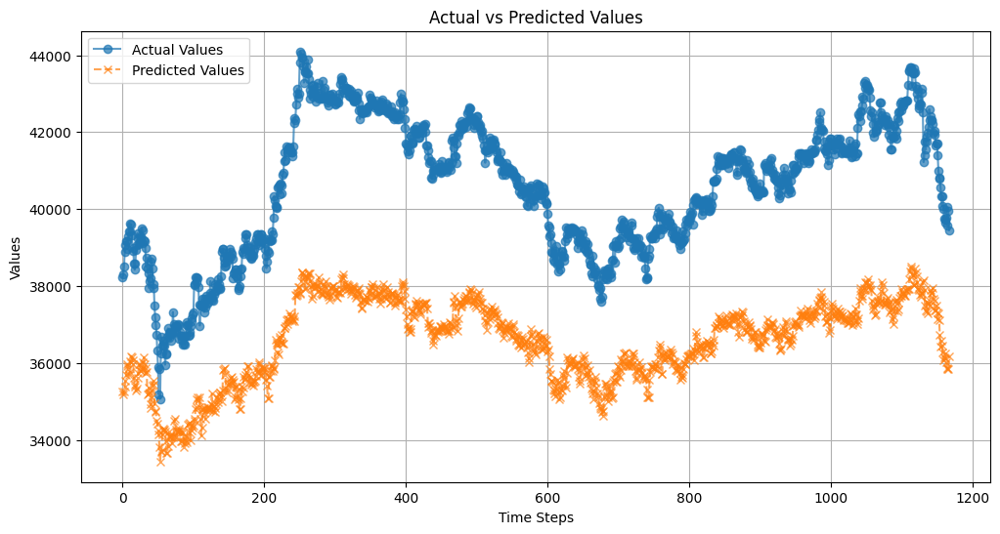

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper5.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

##### 6

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper6", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [128,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper6.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper6 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features0_int)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper6.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper6.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper6.summary()

Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.1527 - mse: 0.1527 - val_loss: 0.0172 - val_mse: 0.0172
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.4209e-04 - mse: 4.4209e-04 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6503e-04 - mse: 2.6503e-04 - val_loss: 0.0070 - val_mse: 0.0070
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4526e-04 - mse: 2.4526e-04 - val_loss: 0.0082 - val_mse: 0.0082
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4660e-04 - mse: 2.4660e-04 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4474e-04 - mse: 2.4474e-04 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.4072e-04 - mse: 2.4072e-04 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.5031e-04 - mse: 2.5031e-04 - val_loss: 0.0074 - val_mse: 0.

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 3, 64)               │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 1, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_60 (LSTM)                       │ (None, 1, 128)              │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_61 (LSTM)                       │ (None, 1, 64)               │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_62 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 601,349 (2.29 MB)

 Trainable params: 200,449 (783.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 400,900 (1.53 MB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


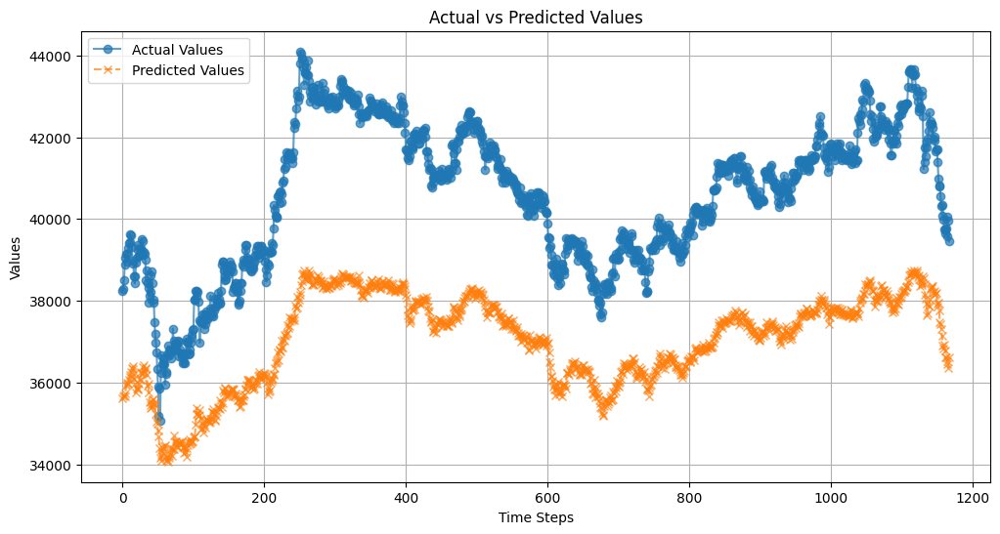

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper6.predict(X_test)
y_pred = y_scaler.inverse_transform(y_pred)
y_test = y_scaler.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▂▁▂▁▂▁▁▃▂▂▂▂▂▂▃▃▂▂▂▃▃▂▂▄▂▄▃▁▂▃▃▃▂▂▂▁▂▂▂
val_mse,█▂▁▁▁▁▁▃▂▄▂▂▂▂▂▃▃▂▂▂▃▂▂▄▃▄▃▁▂▃▃▃▂▂▂▁▂▂▂▂
epoch,50
train_loss,0.00022
train_mse,0.00022
val_loss,0.00836
val_mse,0.00836


##### 7

In [ ]:
wandb.finish()

epoch,▁▃▅▆█
train_loss,█▁▁▁▁
train_mse,█▁▁▁▁
val_loss,█▁▄▁▂
val_mse,█▁▄▁▂
epoch,5
train_loss,0.00024
train_mse,0.00024
val_loss,0.00602
val_mse,0.00602


In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper7", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper7.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper7 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper7.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper7.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper7.summary()

Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1390 - mse: 0.1390 - val_loss: 0.0180 - val_mse: 0.0180
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 5.1702e-04 - mse: 5.1702e-04 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.0731e-04 - mse: 3.0731e-04 - val_loss: 0.0072 - val_mse: 0.0072
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6635e-04 - mse: 2.6635e-04 - val_loss: 0.0061 - val_mse: 0.0061
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.7414e-04 - mse: 2.7414e-04 - val_loss: 0.0081 - val_mse: 0.0081
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.4536e-04 - mse: 2.4536e-04 - val_loss: 0.0100 - val_mse: 0.0100
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.5720e-04 - mse: 2.5720e-04 - val_loss: 0.0063 - val_mse: 0.0063
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 2.5359e-04 - mse: 2.5359e-04 - val_loss: 0.0072 - val_mse: 0.00

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)                    │ (None, 3, 64)               │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_6 (MaxPooling1D)       │ (None, 1, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_69 (LSTM)                       │ (None, 1, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_70 (LSTM)                       │ (None, 1, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_71 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_47 (Dense)                     │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_48 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 354,821 (1.35 MB)

 Trainable params: 118,273 (462.00 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 236,548 (924.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step


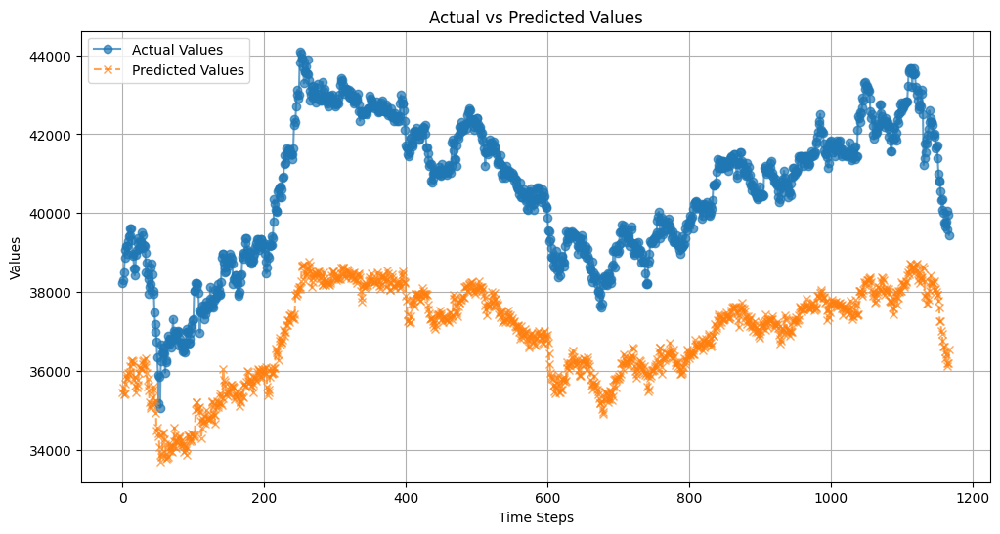

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper7.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

##### 8

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper8", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 5,
    "lstm_units": [64,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper8.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper8 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper8.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper8.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper8.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - loss: 0.1659 - mse: 0.1659 - val_loss: 0.0120 - val_mse: 0.0120
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 5.5236e-04 - mse: 5.5236e-04 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.8238e-04 - mse: 3.8238e-04 - val_loss: 0.0073 - val_mse: 0.0073
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.0442e-04 - mse: 3.0442e-04 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.8883e-04 - mse: 2.8883e-04 - val_loss: 0.0076 - val_mse: 0.0076
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.6176e-04 - mse: 2.6176e-04 - val_loss: 0.0088 - val_mse: 0.0088
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.3365e-04 - mse: 2.3365e-04 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.1885e-04 - mse: 2.1885e-04 - val_loss: 0.0088 - val_mse: 0.00

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)                    │ (None, 3, 64)               │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 1, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 1, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 1, 64)               │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 317,573 (1.21 MB)

 Trainable params: 105,857 (413.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 211,716 (827.02 KB)

37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


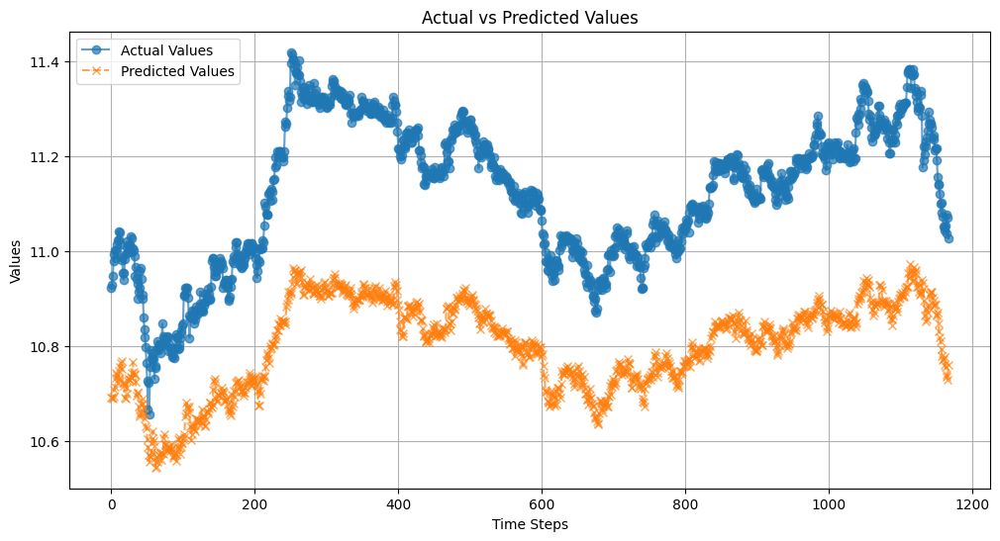

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper8.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

##### 9

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper9", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64,64,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper9.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper9 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper9.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper9.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper9.summary()

wandb: Currently logged in as: yebin. Use `wandb login --relogin` to force relogin


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.0409 - mse: 0.0409 - val_loss: 0.0302 - val_mse: 0.0302
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 7.4271e-04 - mse: 7.4271e-04 - val_loss: 0.0260 - val_mse: 0.0260
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 5.7182e-04 - mse: 5.7182e-04 - val_loss: 0.0217 - val_mse: 0.0217
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 4.7294e-04 - mse: 4.7294e-04 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 5.8415e-04 - mse: 5.8415e-04 - val_loss: 0.0164 - val_mse: 0.0164
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 5.1100e-04 - mse: 5.1100e-04 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.1331e-04 - mse: 4.1331e-04 - val_loss: 0.0222 - val_mse: 0.0222
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.1620e-04 - mse: 4.1620e-04 - val_loss: 0.0202 - val_mse:

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 44, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 44, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 317,573 (1.21 MB)

 Trainable params: 105,857 (413.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 211,716 (827.02 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


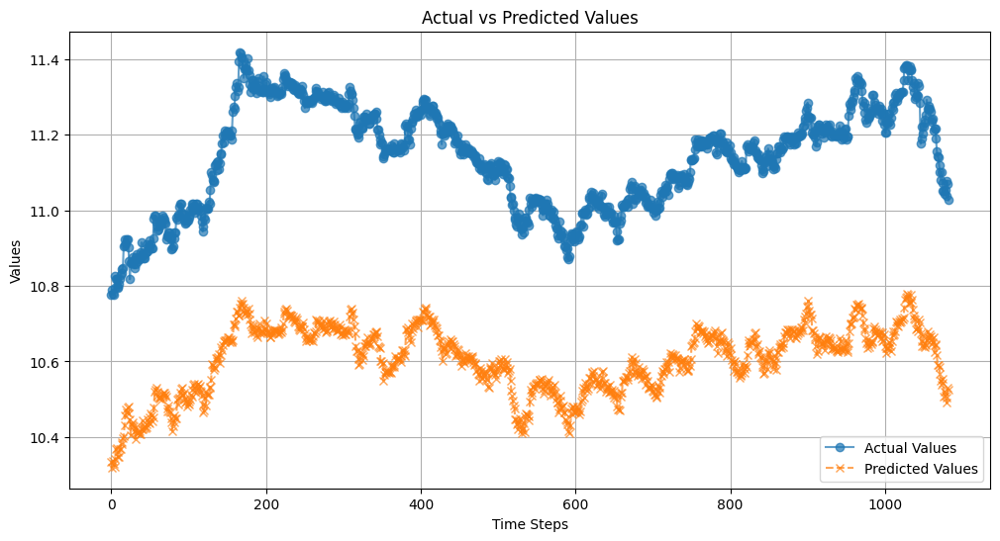

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper9.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▅▇▃▅▅▇▅▃▂▄▃▃▂▂▂▂▃▂▃▂▃▃▁▄▃▄▃▂▃▂▂▃▃▃▃▂▃▂
val_mse,█▇▅▇▃▅▅▇▅▃▂▄▃▃▂▂▂▂▃▂▃▂▃▃▁▄▂▃▄▃▂▃▂▂▃▂▃▃▃▂
epoch,50
train_loss,0.00014
train_mse,0.00014
val_loss,0.0131
val_mse,0.0131


##### 10

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper10", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,128],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper10.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper10 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    #tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper10.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper10.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper10.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.0330 - mse: 0.0330 - val_loss: 0.0168 - val_mse: 0.0168
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.5737e-04 - mse: 3.5737e-04 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.8718e-04 - mse: 3.8718e-04 - val_loss: 0.0175 - val_mse: 0.0175
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.7367e-04 - mse: 2.7367e-04 - val_loss: 0.0152 - val_mse: 0.0152
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.0680e-04 - mse: 3.0680e-04 - val_loss: 0.0205 - val_mse: 0.0205
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.6015e-04 - mse: 3.6015e-04 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.8815e-04 - mse: 2.8815e-04 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.3507e-04 - mse: 2.3507e-04 - val_loss: 0.0148 - val_mse:

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_1 (Conv1D)                    │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 44, 128)             │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 723,845 (2.76 MB)

 Trainable params: 241,281 (942.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 482,564 (1.84 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


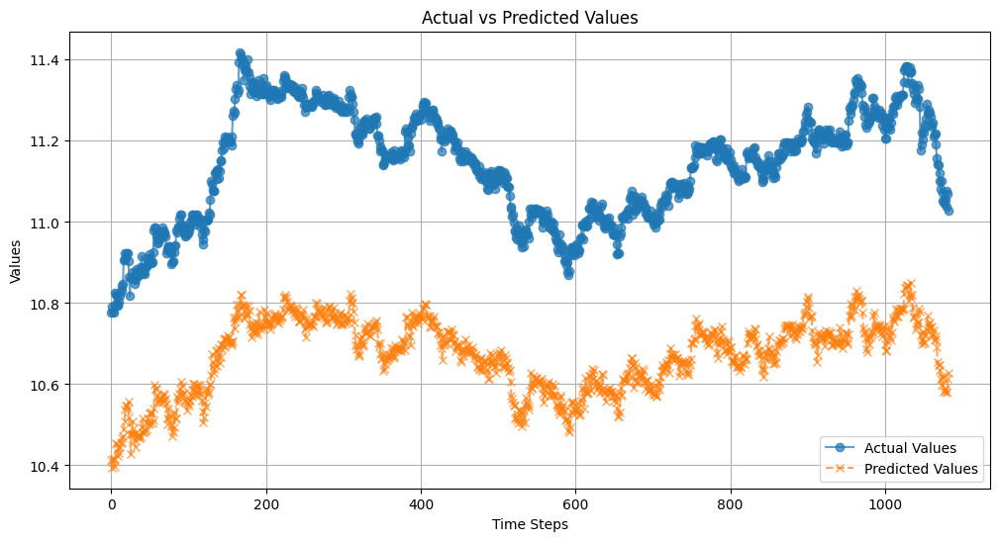

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper10.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆▂▆▅█▄▄▄▂▅▂▅▆▂▄▄▄▂▂▄▃▂▁▅▅▃▅▃▄▃▃▅▄▁▄▄▄▃▅▅
val_mse,▄▂▄▃▆▃▃▃▂▄▂▄▄▂█▃▃▃▂▂▂▃▂▁▃▅▂▂▂▃▄▃▃▁▃▃▃▃▄▄
epoch,50
train_loss,0.00012
train_mse,0.00012
val_loss,0.01605
val_mse,0.01605


##### 11 - 여기부터 망함

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper11", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper11.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper11 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh')),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper11.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper11.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper11.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 0.1243 - mse: 0.1243 - val_loss: 0.1197 - val_mse: 0.1197
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0067 - mse: 0.0067 - val_loss: 0.0487 - val_mse: 0.0487
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 9.3597e-04 - mse: 9.3597e-04 - val_loss: 0.0332 - val_mse: 0.0332
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 5.4872e-04 - mse: 5.4872e-04 - val_loss: 0.0303 - val_mse: 0.0303
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 2.9389e-04 - mse: 2.9389e-04 - val_loss: 0.0254 - val_mse: 0.0254
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 2.4966e-04 - mse: 2.4966e-04 - val_loss: 0.0251 - val_mse: 0.0251
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 2.1180e-04 - mse: 2.1180e-04 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 1.8992e-04 - mse: 1.8992e-04 - val_loss: 0.0200 - val_mse: 0.0200


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 44, 256)             │         197,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_1 (Bidirectional)      │ (None, 128)                 │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention (Attention)                │ (None)                      │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,143,749 (4.36 MB)

 Trainable params: 381,249 (1.45 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 762,500 (2.91 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


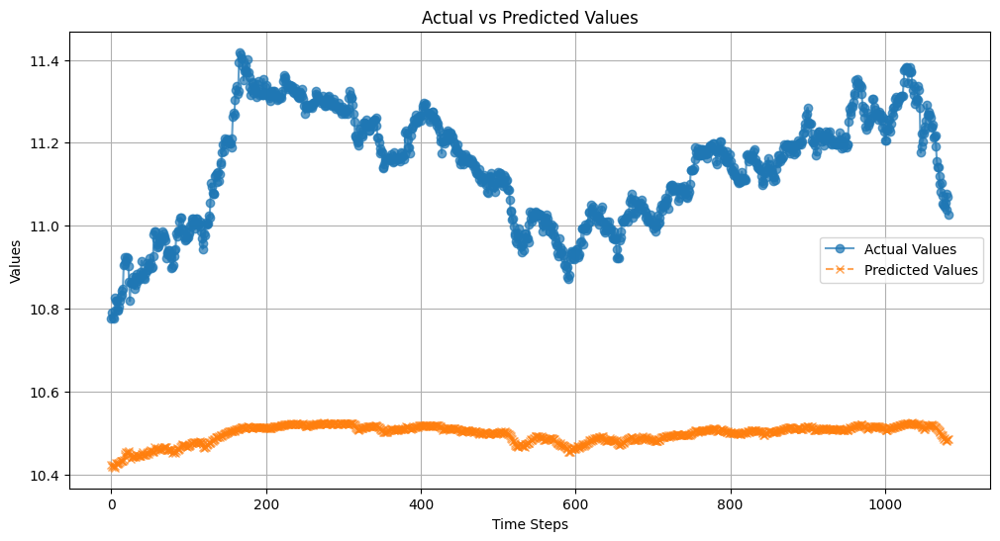

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper11.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,█▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50
train_loss,0.00012
train_mse,0.00012
val_loss,0.01512
val_mse,0.01512


##### 12

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper12", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper12.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper12 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper12.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper12.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper12.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1948 - mse: 0.1948 - val_loss: 0.2227 - val_mse: 0.2227
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0464 - mse: 0.0464 - val_loss: 0.2190 - val_mse: 0.2190
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0459 - mse: 0.0459 - val_loss: 0.2216 - val_mse: 0.2216
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0780 - val_mse: 0.0780
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0462 - val_mse: 0.0462
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - loss: 6.0135e-04 - mse: 6.0135e-04 - val_loss: 0.0337 - val_mse: 0.0337
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.4962e-04 - mse: 3.4962e-04 - val_loss: 0.0275 - val_mse: 0.0275
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 3.0152e-04 - mse: 3.0152e-04 - val_loss: 0.0276 - val_mse: 0.0276
Epoch 9/50
108/108 ━━━━━

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)                    │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_4 (Bidirectional)      │ (None, 44, 256)             │         197,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_5 (Bidirectional)      │ (None, 44, 128)             │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_12 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_1 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,254,917 (4.79 MB)

 Trainable params: 418,305 (1.60 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 836,612 (3.19 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


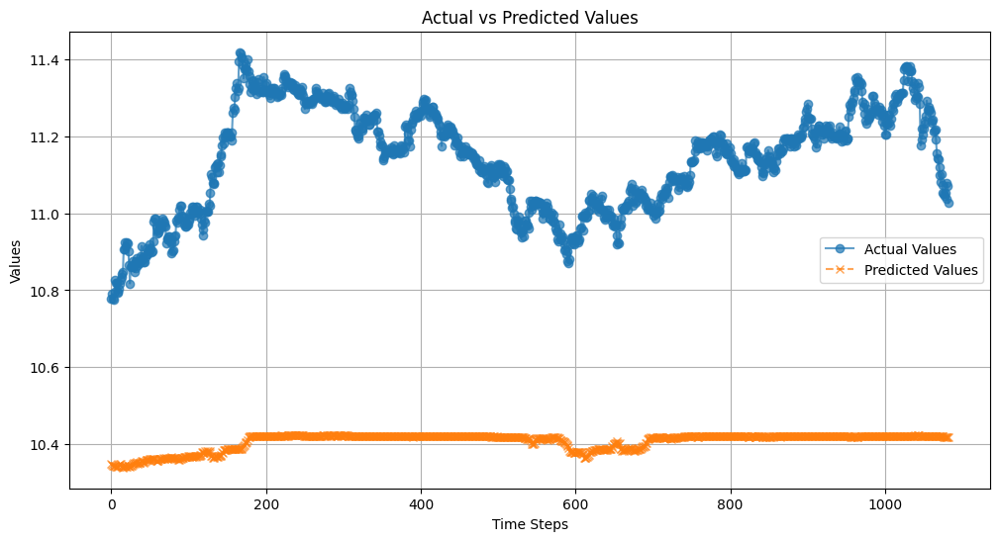

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper12.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▄▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▄▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,███▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_mse,███▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50
train_loss,0.00012
train_mse,0.00012
val_loss,0.01858
val_mse,0.01858


##### 13

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper13", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper13.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper13 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.Dropout(0.2),

    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dropout(0.2),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper13.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper13.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper13.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.2617 - mse: 0.2617 - val_loss: 0.2955 - val_mse: 0.2955
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0511 - mse: 0.0511 - val_loss: 0.2717 - val_mse: 0.2717
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0375 - mse: 0.0375 - val_loss: 0.1460 - val_mse: 0.1460
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.1549 - val_mse: 0.1549
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.1471 - val_mse: 0.1471
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - loss: 0.0143 - mse: 0.0143 - val_loss: 0.1355 - val_mse: 0.1355
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.1496 - val_mse: 0.1496
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0114 - mse: 0.0114 - val_loss: 0.1446 - val_mse: 0.1446
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)                    │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_4 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_6 (Bidirectional)      │ (None, 44, 256)             │         197,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_7 (Bidirectional)      │ (None, 44, 128)             │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_15 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_2 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,254,917 (4.79 MB)

 Trainable params: 418,305 (1.60 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 836,612 (3.19 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


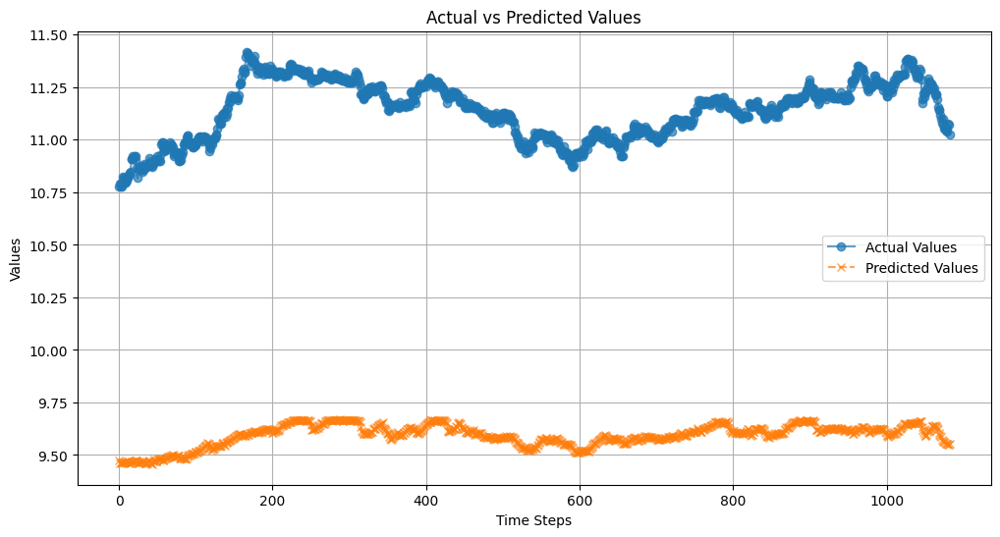

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper13.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▂▂▂▂▂▂▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▃▄▄▄▄▄▄▄▄▄▃▄▄
val_mse,█▇▂▂▂▂▂▂▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▃▄▄▄▄▄▄▄▄▃▄▄
epoch,50
train_loss,0.00937
train_mse,0.00937
val_loss,0.1891
val_mse,0.1891


##### 14

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁
train_mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁
val_loss,▅▆▆▆▇███████▇▇▆▅▅▅▄▄▄▄▄▂▂▂▂▁▂▁
val_mse,▅▆▆▆▇███████▇▇▆▅▅▅▄▄▄▄▄▂▂▂▂▁▂▁
epoch,30
train_loss,0.00017
train_mse,0.00017
val_loss,0.34614
val_mse,0.34614


In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper14", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper14.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper14 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dropout(0.2),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper14.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper14.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper14.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1731 - mse: 0.1731 - val_loss: 0.2678 - val_mse: 0.2678
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.0376 - mse: 0.0376 - val_loss: 0.1224 - val_mse: 0.1224
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0184 - mse: 0.0184 - val_loss: 0.1023 - val_mse: 0.1023
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0142 - mse: 0.0142 - val_loss: 0.1087 - val_mse: 0.1087
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0122 - mse: 0.0122 - val_loss: 0.1082 - val_mse: 0.1082
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.1168 - val_mse: 0.1168
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.1111 - val_mse: 0.1111
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.1183 - val_mse: 0.1183
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_8 (Bidirectional)      │ (None, 90, 256)             │         145,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_9 (Bidirectional)      │ (None, 90, 128)             │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_20 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_3 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,090,565 (4.16 MB)

 Trainable params: 363,521 (1.39 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 727,044 (2.77 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


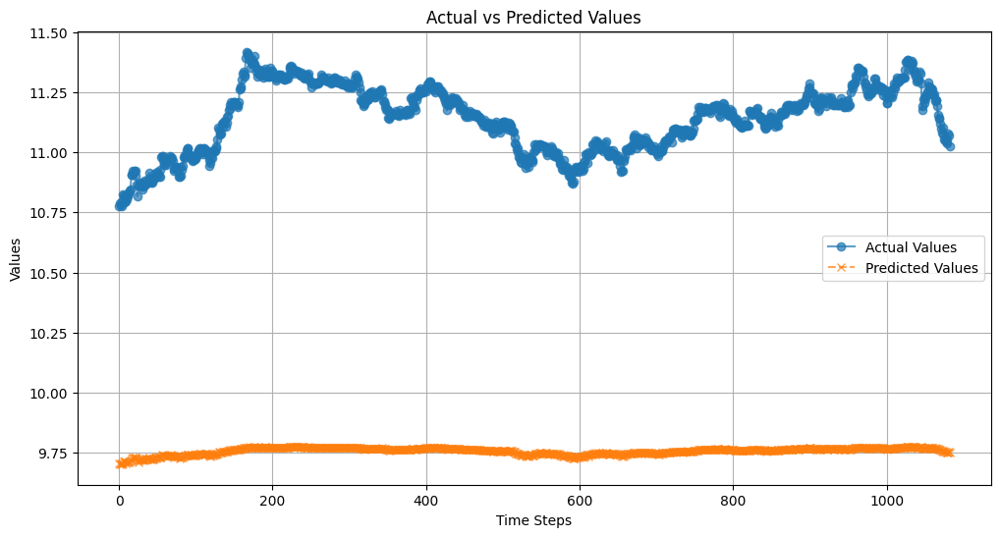

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper14.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▁▁▁▂▂▂▁▂▃▃▂▃▂▂▃▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▄▃▄▄▃
val_mse,█▂▁▁▁▁▂▂▁▂▂▃▂▃▂▃▃▂▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄
epoch,50
train_loss,0.00996
train_mse,0.00996
val_loss,0.15512
val_mse,0.15512


##### 15

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper15", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [256,128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper15.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper15 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[3], activation='tanh'),
    tf.keras.layers.Dropout(0.2),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper15.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper15.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper15.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 13s 37ms/step - loss: 0.1571 - mse: 0.1571 - val_loss: 0.2526 - val_mse: 0.2526
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.2758 - val_mse: 0.2758
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0457 - mse: 0.0457 - val_loss: 0.2137 - val_mse: 0.2137
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0473 - mse: 0.0473 - val_loss: 0.2405 - val_mse: 0.2405
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.2318 - val_mse: 0.2318
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0474 - mse: 0.0474 - val_loss: 0.2155 - val_mse: 0.2155
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.2193 - val_mse: 0.2193
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0477 - mse: 0.0477 - val_loss: 0.2298 - val_mse: 0.2298
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_21 (LSTM)                       │ (None, 90, 256)             │         276,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_22 (LSTM)                       │ (None, 90, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_23 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_24 (LSTM)                       │ (None, 32)                  │          12,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_4 (Attention)              │ (None)                      │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 128)                 │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,635,173 (6.24 MB)

 Trainable params: 545,057 (2.08 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,090,116 (4.16 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


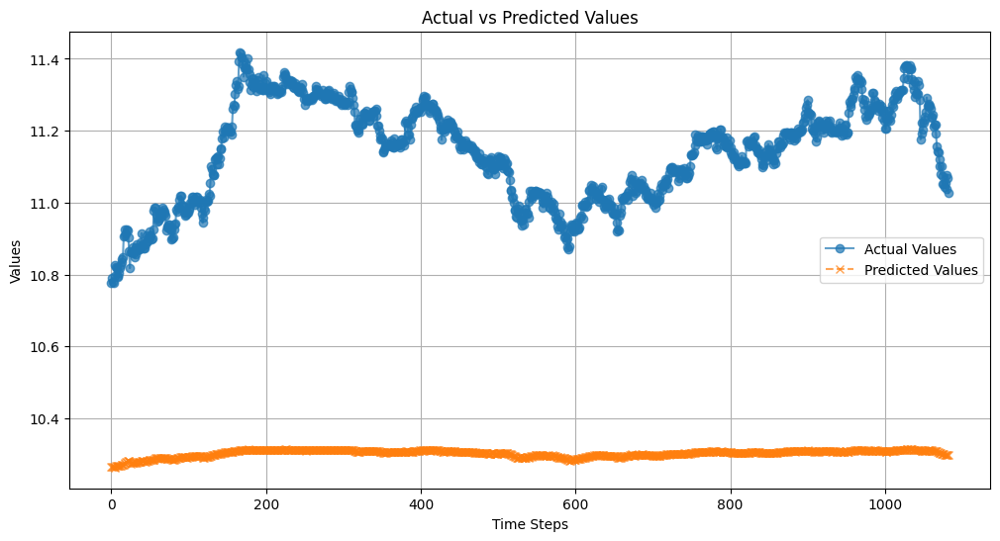

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper15.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss,█▅▄▅▅▅▄▅▅▅▅▅▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▅▄▅▅▅▅▅▅▅▅▅▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▇█▆▇▇▆▇▇▆▇▇▆▃▂▂▂▂▁▂▂▂▁▁▂▂▁▁▁▂▁▁▁▁▁▂▁▁▁▁▁
val_mse,▇█▆▇▇▆▇▆▇▇▆▃▂▂▂▂▂▁▂▂▂▁▁▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁
epoch,50
train_loss,0.01
train_mse,0.01
val_loss,0.03128
val_mse,0.03128


##### 16

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper16", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [256,128,64,32],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper16.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper16 = tf.keras.Sequential([
    Conv1D(32, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[2], activation='tanh'),
    tf.keras.layers.Dropout(0.2),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper16.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper16.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper16.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1723 - mse: 0.1723 - val_loss: 0.2846 - val_mse: 0.2846
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0483 - mse: 0.0483 - val_loss: 0.2504 - val_mse: 0.2504
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0468 - mse: 0.0468 - val_loss: 0.2829 - val_mse: 0.2829
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0476 - mse: 0.0476 - val_loss: 0.2740 - val_mse: 0.2740
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0454 - mse: 0.0454 - val_loss: 0.2777 - val_mse: 0.2777
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0449 - mse: 0.0449 - val_loss: 0.1642 - val_mse: 0.1642
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0242 - mse: 0.0242 - val_loss: 0.1438 - val_mse: 0.1438
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0154 - mse: 0.0154 - val_loss: 0.1492 - val_mse: 0.1492
Epoch 9/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_5 (Conv1D)                    │ (None, 88, 32)              │           1,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_5 (MaxPooling1D)       │ (None, 44, 32)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_25 (LSTM)                       │ (None, 44, 256)             │         295,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_26 (LSTM)                       │ (None, 44, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_27 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_5 (Attention)              │ (None)                      │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 128)                 │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,644,869 (6.27 MB)

 Trainable params: 548,289 (2.09 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,096,580 (4.18 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


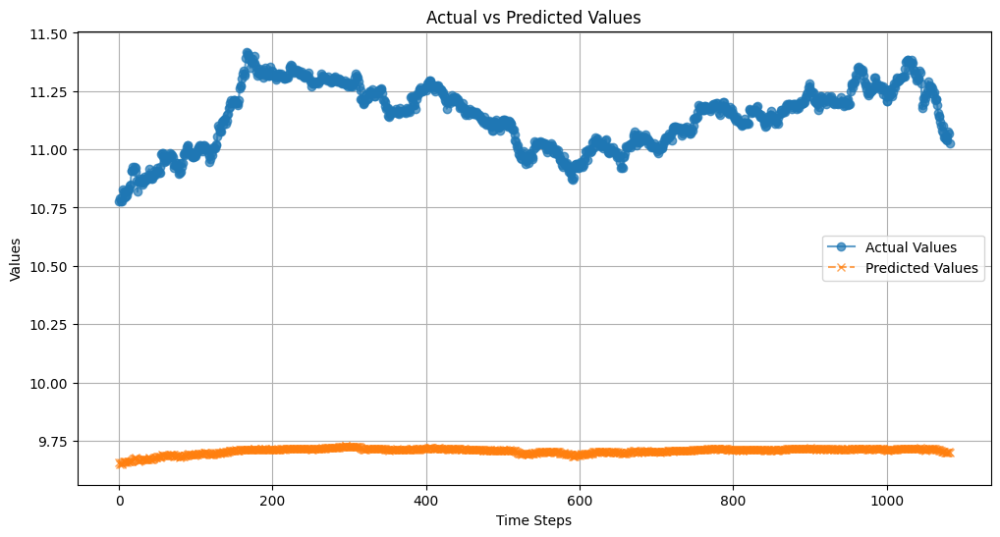

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper16.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 17

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss,█▄▄▄▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▄▄▄▄▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇███▂▃▂▂▁▂▂▂▃▃▂▂▂▃▂▃▃▃▃▃▃▃▃▃▃▃▄▃▃▄▃▃▄▃▃
val_mse,█▇███▃▂▂▁▁▂▂▃▂▂▂▃▂▃▃▃▃▃▃▃▃▃▃▃▃▃▄▃▃▄▃▃▄▃▃
epoch,50
train_loss,0.00963
train_mse,0.00963
val_loss,0.16336
val_mse,0.16336


In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper17", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper17.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper17 = tf.keras.Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper17.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper17.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper17.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.0479 - mse: 0.0479 - val_loss: 0.0143 - val_mse: 0.0143
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.3967e-04 - mse: 5.3967e-04 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 4.1566e-04 - mse: 4.1566e-04 - val_loss: 0.0329 - val_mse: 0.0329
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 2.9576e-04 - mse: 2.9576e-04 - val_loss: 0.0243 - val_mse: 0.0243
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 3.2919e-04 - mse: 3.2919e-04 - val_loss: 0.0247 - val_mse: 0.0247
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.6294e-04 - mse: 2.6294e-04 - val_loss: 0.0262 - val_mse: 0.0262
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.5263e-04 - mse: 2.5263e-04 - val_loss: 0.0225 - val_mse: 0.0225
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 2.3114e-04 - mse: 2.3114e-04 - val_loss: 0.0267 - val_mse: 

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)                    │ (None, 88, 64)              │           2,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_6 (MaxPooling1D)       │ (None, 44, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_28 (LSTM)                       │ (None, 44, 128)             │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_29 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 465,029 (1.77 MB)

 Trainable params: 155,009 (605.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 310,020 (1.18 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


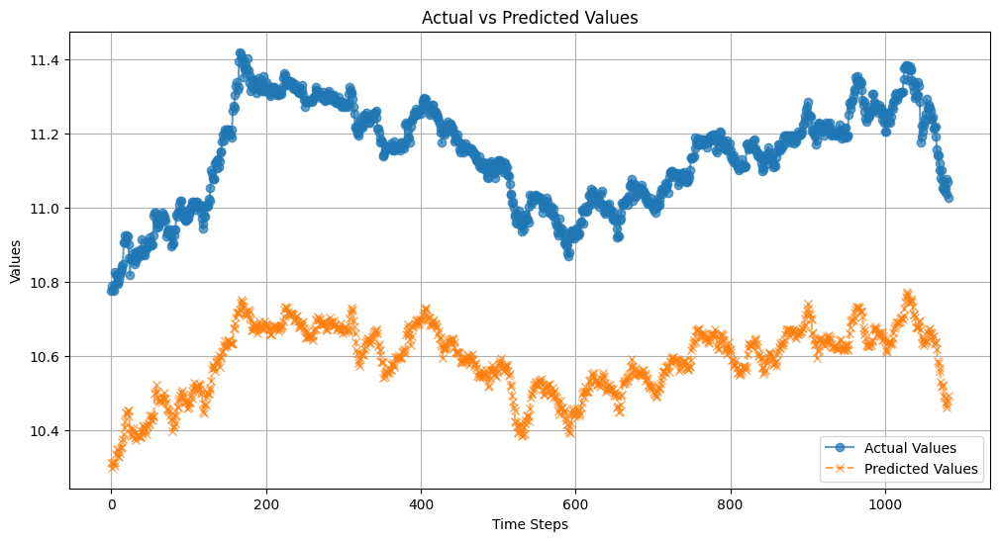

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper17.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇██
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▅█▅▅▆▆▄▅▅▃▄▄▃▅▃▅▁▂▂▄▂▁▃▃▃▄▂▃▂▁▁▃▃▁▁▁▂▂▂
val_mse,▂▅█▅▅▅▆▆▄▅▅▃▄▄▃▄▃▅▁▂▄▂▂▁▃▃▄▂▃▂▁▁▃▃▁▁▁▂▂▂
epoch,50
train_loss,0.00018
train_mse,0.00018
val_loss,0.01529
val_mse,0.01529


##### 18

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper18", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,128],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper18.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper18 = tf.keras.Sequential([
    Conv1D(128, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper18.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper18.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_hyper18.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0383 - mse: 0.0383 - val_loss: 0.0424 - val_mse: 0.0424
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 4.5439e-04 - mse: 4.5439e-04 - val_loss: 0.0300 - val_mse: 0.0300
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 3.5708e-04 - mse: 3.5708e-04 - val_loss: 0.0270 - val_mse: 0.0270
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 3.2315e-04 - mse: 3.2315e-04 - val_loss: 0.0296 - val_mse: 0.0296
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 3.4755e-04 - mse: 3.4755e-04 - val_loss: 0.0241 - val_mse: 0.0241
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 2.9579e-04 - mse: 2.9579e-04 - val_loss: 0.0230 - val_mse: 0.0230
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.5180e-04 - mse: 3.5180e-04 - val_loss: 0.0315 - val_mse: 0.0315
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.2717e-04 - mse: 3.2717e-04 - val_loss: 0.0233 - val_mse:

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_7 (Conv1D)                    │ (None, 88, 128)             │           5,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_7 (MaxPooling1D)       │ (None, 44, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_30 (LSTM)                       │ (None, 44, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_31 (LSTM)                       │ (None, 128)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 879,365 (3.35 MB)

 Trainable params: 293,121 (1.12 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 586,244 (2.24 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


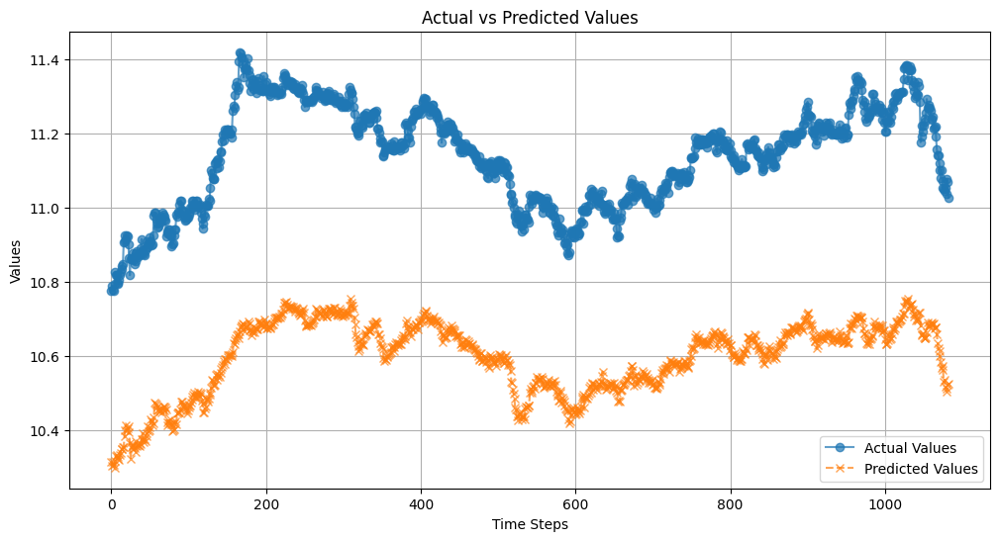

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper18.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▅▅▅▄▆▄▅▄▃▂▃▄▄▃▂▃▃▂▃▃▂▂▁▃▂▂▁▂▂▃▃▁▂▂▃▂▂▃▂
val_mse,█▅▅▅▄▆▅▄▃▄▂▄▃▄▃▂▃▃▂▃▃▂▂▁▃▂▂▁▂▂▃▃▁▂▂▃▂▂▃▂
epoch,50
train_loss,0.00013
train_mse,0.00013
val_loss,0.01718
val_mse,0.01718


##### 19

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper19", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper19.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',       # val_loss가 개선되지 않으면 학습률 감소
    factor=0.5,               # 학습률을 절반으로 감소
    patience=5,               # 5 Epoch 동안 개선 없으면 학습률 감소
    min_lr=1e-6,              # 최소 학습률 설정
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

model_int_hyper19 = tf.keras.Sequential([
    Conv1D(128, kernel_size=3, activation='relu', input_shape=(time_steps, len(features0_int))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    #tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_hyper19.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper19.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper19.optimizer.learning_rate.numpy(),
    })

model_int_hyper19.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0328 - mse: 0.0328 - val_loss: 0.0288 - val_mse: 0.0288 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 5.1080e-04 - mse: 5.1080e-04 - val_loss: 0.0189 - val_mse: 0.0189 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 4.0166e-04 - mse: 4.0166e-04 - val_loss: 0.0212 - val_mse: 0.0212 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.2441e-04 - mse: 3.2441e-04 - val_loss: 0.0187 - val_mse: 0.0187 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 3.0150e-04 - mse: 3.0150e-04 - val_loss: 0.0266 - val_mse: 0.0266 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 2.9827e-04 - mse: 2.9827e-04 - val_loss: 0.0292 - val_mse: 0.0292 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 3.2827e-04 - mse: 3.2827e-04 - val_loss: 0.

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_10 (Conv1D)                   │ (None, 88, 128)             │           5,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_10 (MaxPooling1D)      │ (None, 44, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_36 (LSTM)                       │ (None, 44, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_37 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 571,013 (2.18 MB)

 Trainable params: 190,337 (743.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 380,676 (1.45 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


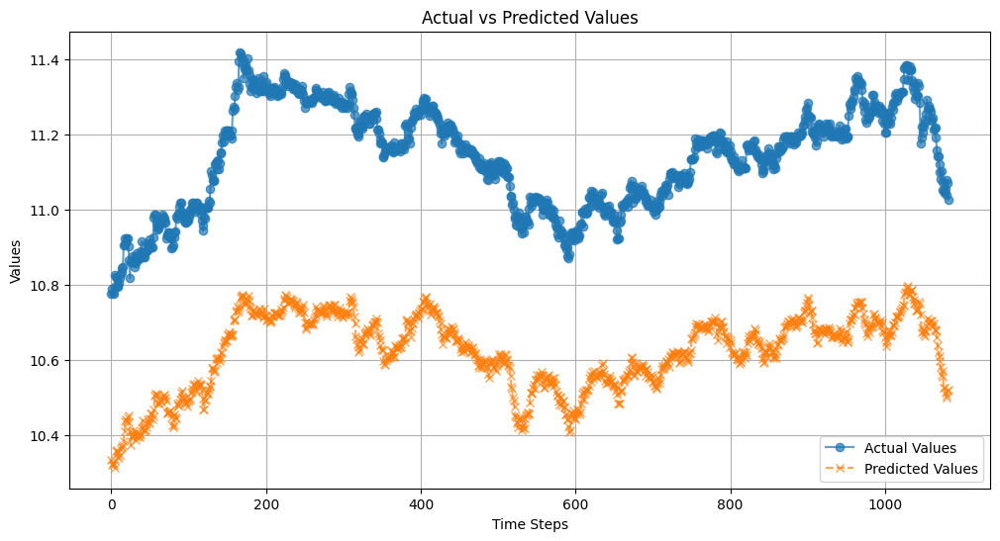

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper19.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▄▅▃▇▄▆▄▃▄▅▅▅▃▄▅▃▄▅▃▆▄▃▃▂▄▂▃▂▂▃▂▂▂▃▁▁▂▂▄
val_mse,█▄▅▃▇▄▆▄▃▄▅▅▅▃▄▅▃▄▅▃▆▄▃▃▂▃▄▂▃▂▄▃▂▂▂▁▁▂▂▄
epoch,50
learning_rate,0.001
train_loss,0.00012
train_mse,0.00012
val_loss,0.0194


##### 20 - 놀랍게도 현재까지 베스트

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Final - Interp", name="hyper20", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper20.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_int_hyper20 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper20.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper20.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper20.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper20.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.3341 - mse: 0.3341 - val_loss: 0.0210 - val_mse: 0.0210 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 7.9045e-04 - mse: 7.9045e-04 - val_loss: 0.0193 - val_mse: 0.0193 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 5.4366e-04 - mse: 5.4366e-04 - val_loss: 0.0168 - val_mse: 0.0168 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.0876e-04 - mse: 4.0876e-04 - val_loss: 0.0158 - val_mse: 0.0158 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.1181e-04 - mse: 3.1181e-04 - val_loss: 0.0149 - val_mse: 0.0149 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.7444e-04 - mse: 2.7444e-04 - val_loss: 0.0141 - val_mse: 0.0141 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.4335e-04 - mse: 3.4335e-04 - val_loss: 

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18            │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_12 (Conv1D)        │ (None, 88, 128)        │          5,120 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_12          │ (None, 44, 128)        │              0 │ conv1d_12[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_46 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_12[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 44, 128)        │              0 │ max_pooling1d_12[0][0… │
│                           │                        │                │ lstm_46[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_7 (Flatten)       │ (None, 5632)           │              0 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_34 (Dense)          │ (None, 64)             │        360,512 │ flatten_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_47 (LSTM)            │ (None, 64)             │         49,408 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 64)             │              0 │ dense_34[0][0],        │
│                           │                        │                │ lstm_47[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_35 (Dense)          │ (None, 64)             │          4,160 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_36 (Dense)          │ (None, 1)              │             65 │ dense_35[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,652,549 (6.30 MB)

 Trainable params: 550,849 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,101,700 (4.20 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


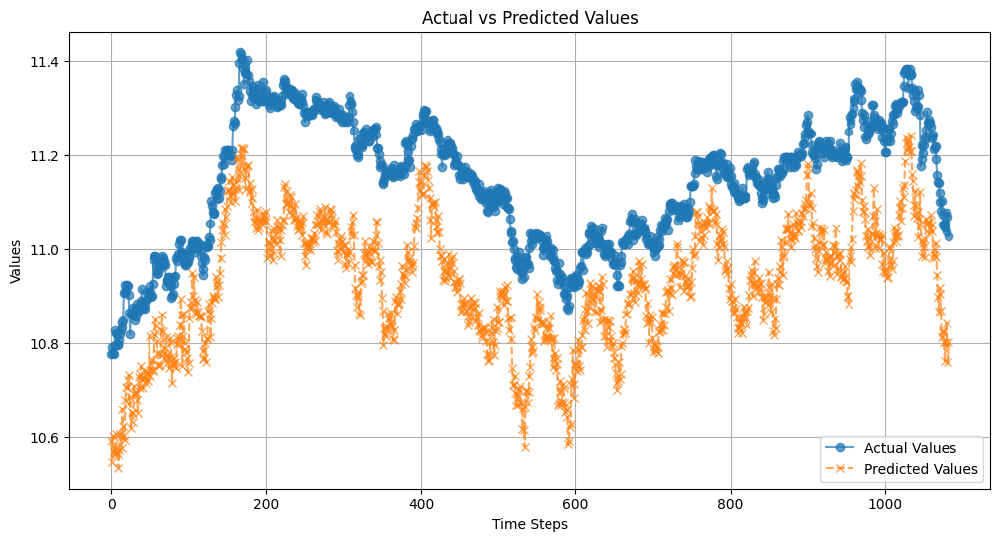

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper20.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▅▅▄▄▃▃▃▂▁▃▂▂▂▂▂▃▁▃▂▁▂▃▁▁▁▁▂▂▂▃▂▁▂▄▃▃▂▅
val_mse,█▇▅▅▄▄▃▄▃▃▂▂▁▃▂▂▂▂▂▃▃▃▂▂▃▂▁▁▁▂▃▂▃▂▂▄▃▃▂▅
epoch,50
learning_rate,0.001
train_loss,0.00024
train_mse,0.00024
val_loss,0.01536


##### 21

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM Final - Interp", name="hyper21", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper21.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# 모델
input_layer = Input(shape=(time_steps, len(features0_int)))

conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)


lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True, dropout=0.2)(pool1)
skip1 = Add()([pool1, lstm1])

lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', dropout=0.2)(skip1)
skip1_flattened = Flatten()(skip1)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)
skip2 = Add()([skip1_reshaped, lstm2])

dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

# 컴파일
model_int_hyper21 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper21.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper21.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper21.optimizer.learning_rate.numpy(),
    })

model_int_hyper21.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.7592 - mse: 0.7592 - val_loss: 0.0101 - val_mse: 0.0101 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0095 - val_mse: 0.0095 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0107 - val_mse: 0.0107 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 8.2412e-04 - mse: 8.2412e-04 - val_loss: 0.0090 - val_mse: 0.0090 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 6.3871e-04 - mse: 6.3871e-04 - val_loss: 0.0089 - val_mse: 0.0089 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 5.0262e-04 - mse: 5.0262e-04 - val_loss: 0.0108 - val_mse: 0.0108 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 6.1779e-04 - mse: 6.1779e-04 - val_loss: 0.0087 - val_mse

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19            │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_13 (Conv1D)        │ (None, 88, 128)        │          5,120 │ input_layer_19[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_13          │ (None, 44, 128)        │              0 │ conv1d_13[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_48 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_13[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 44, 128)        │              0 │ max_pooling1d_13[0][0… │
│                           │                        │                │ lstm_48[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_8 (Flatten)       │ (None, 5632)           │              0 │ add_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_37 (Dense)          │ (None, 64)             │        360,512 │ flatten_8[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_49 (LSTM)            │ (None, 64)             │         49,408 │ add_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_5 (Add)               │ (None, 64)             │              0 │ dense_37[0][0],        │
│                           │                        │                │ lstm_49[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_38 (Dense)          │ (None, 64)             │          4,160 │ add_5[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_39 (Dense)          │ (None, 1)              │             65 │ dense_38[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,652,549 (6.30 MB)

 Trainable params: 550,849 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,101,700 (4.20 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


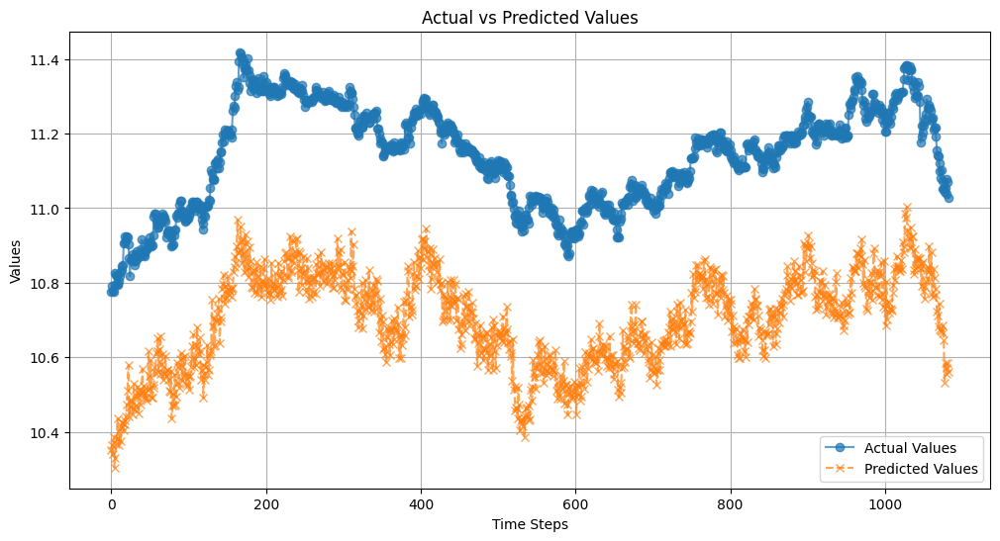

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper21.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▂▁▁▃▁▂▂▁▂▂▂▂▂▂▂▃▄▄▃▄▆▆▇▅▄▅▅▇▃▆▄▅▅▆█▆▇█▇
val_mse,▂▂▃▂▁▁▁▁▂▂▂▂▂▂▂▄▂▃▄▄▇▄▆▆▇▄▅▅▇▃▆▄▅▅▆█▆▇█▇
epoch,50
learning_rate,0.001
train_loss,0.00017
train_mse,0.00017
val_loss,0.01844


##### 22

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM Final - Interp", name="hyper22", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper22.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(64, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_int_hyper22 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper22.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper22.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper22.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper22.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.4713 - mse: 0.4713 - val_loss: 0.0265 - val_mse: 0.0265 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0266 - val_mse: 0.0266 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 8.6514e-04 - mse: 8.6514e-04 - val_loss: 0.0239 - val_mse: 0.0239 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 7.3209e-04 - mse: 7.3209e-04 - val_loss: 0.0233 - val_mse: 0.0233 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.7870e-04 - mse: 5.7870e-04 - val_loss: 0.0230 - val_mse: 0.0230 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 5.0948e-04 - mse: 5.0948e-04 - val_loss: 0.0234 - val_mse: 0.0234 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 4.6810e-04 - mse: 4.6810e-04 - val_loss: 0.0217 -

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22            │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_16 (Conv1D)        │ (None, 88, 64)         │          2,560 │ input_layer_22[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_16          │ (None, 44, 64)         │              0 │ conv1d_16[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_53 (LSTM)            │ (None, 44, 64)         │         33,024 │ max_pooling1d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 44, 64)         │              0 │ max_pooling1d_16[0][0… │
│                           │                        │                │ lstm_53[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_10 (Flatten)      │ (None, 2816)           │              0 │ add_9[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_43 (Dense)          │ (None, 64)             │        180,288 │ flatten_10[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_54 (LSTM)            │ (None, 64)             │         33,024 │ add_9[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_10 (Add)              │ (None, 64)             │              0 │ dense_43[0][0],        │
│                           │                        │                │ lstm_54[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_44 (Dense)          │ (None, 64)             │          4,160 │ add_10[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_45 (Dense)          │ (None, 1)              │             65 │ dense_44[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 759,365 (2.90 MB)

 Trainable params: 253,121 (988.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 506,244 (1.93 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


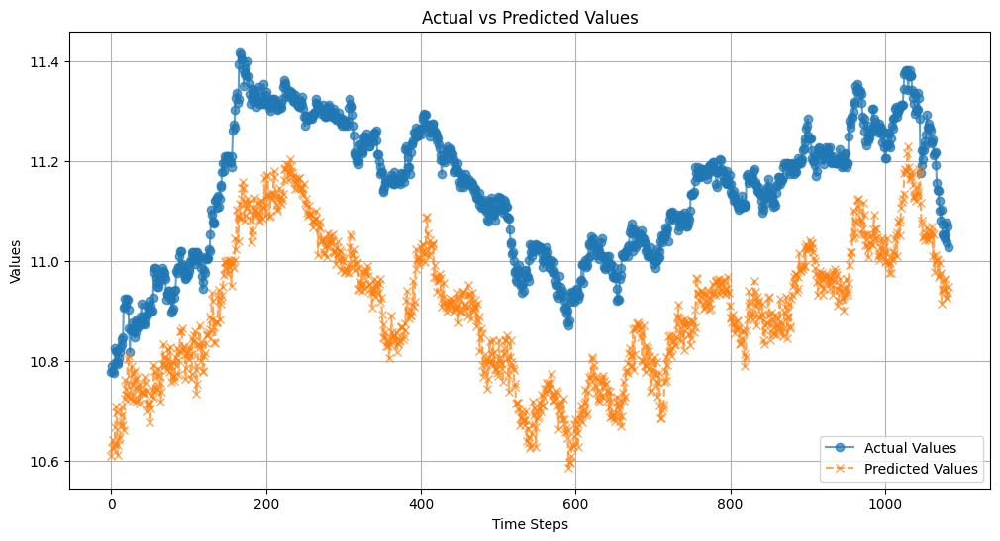

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper22.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▁▃▃▃▅▆▄▆▄▆▄▅▆▆▆▆▅▅█▆▇▅▇▄▅▇▄▃▅▄▆▄▂▃▃▃▂▃▃
val_mse,▂▁▄▃▃▅▅█▅██▇▅▆▇▆▇▇▇▆█▇█▆█▅▅█▅▄▅▄▇▄▃▃▄▄▃▄
epoch,50
learning_rate,0.001
train_loss,9e-05
train_mse,9e-05
val_loss,0.03242


##### 23

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▇▇▆▆▆▅▅▅▄▄▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁
val_mse,█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
learning_rate,0.001
train_loss,0.00022
train_mse,0.00022
val_loss,0.18993


In [ ]:
# WandB 초기화
wandb.init(project="LSTM Final - Interp", name="hyper23", config={
    "epochs": 50,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/interp_hyper23.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_int, selected_y_train_int, time_steps)
X_val, y_val = create_sequences(selected_x_val_int, selected_y_val_int, time_steps)

# Skip Connection 모델 구현 (Functional API)
input_layer = Input(shape=(time_steps, len(features0_int)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip1)

skip1_flattened = Flatten()(skip1)  # (batch_size, 5632)
skip1_reshaped = Dense(wandb.config.lstm_units[1])(skip1_flattened)  # (batch_size, 64)

# Add 레이어에 입력
skip2 = Add()([skip1_reshaped, lstm2])

# Dense Layers
dense1 = Dense(64, activation='relu')(skip2)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_int_hyper23 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_int_hyper23.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 모델 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_hyper23.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_int_hyper23.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_int_hyper23.summary()

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.4362 - mse: 0.4362 - val_loss: 0.0099 - val_mse: 0.0099 - learning_rate: 0.0010
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0091 - val_mse: 0.0091 - learning_rate: 0.0010
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 5.7991e-04 - mse: 5.7991e-04 - val_loss: 0.0095 - val_mse: 0.0095 - learning_rate: 0.0010
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 4.8196e-04 - mse: 4.8196e-04 - val_loss: 0.0096 - val_mse: 0.0096 - learning_rate: 0.0010
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 4.1560e-04 - mse: 4.1560e-04 - val_loss: 0.0100 - val_mse: 0.0100 - learning_rate: 0.0010
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 3.7456e-04 - mse: 3.7456e-04 - val_loss: 0.0101 - val_mse: 0.0101 - learning_rate: 0.0010
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 3.5219e-04 - mse: 3.5219e-04 - val_loss: 0.0105 - val_mse: 0.01

Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32            │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_24 (Conv1D)        │ (None, 88, 128)        │          5,120 │ input_layer_32[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_22          │ (None, 44, 128)        │              0 │ conv1d_24[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_79 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_22[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_17 (Add)              │ (None, 44, 128)        │              0 │ max_pooling1d_22[0][0… │
│                           │                        │                │ lstm_79[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_12 (Flatten)      │ (None, 5632)           │              0 │ add_17[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_62 (Dense)          │ (None, 64)             │        360,512 │ flatten_12[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_80 (LSTM)            │ (None, 64)             │         49,408 │ add_17[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_18 (Add)              │ (None, 64)             │              0 │ dense_62[0][0],        │
│                           │                        │                │ lstm_80[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_63 (Dense)          │ (None, 64)             │          4,160 │ add_18[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_64 (Dense)          │ (None, 1)              │             65 │ dense_63[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,652,549 (6.30 MB)

 Trainable params: 550,849 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,101,700 (4.20 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


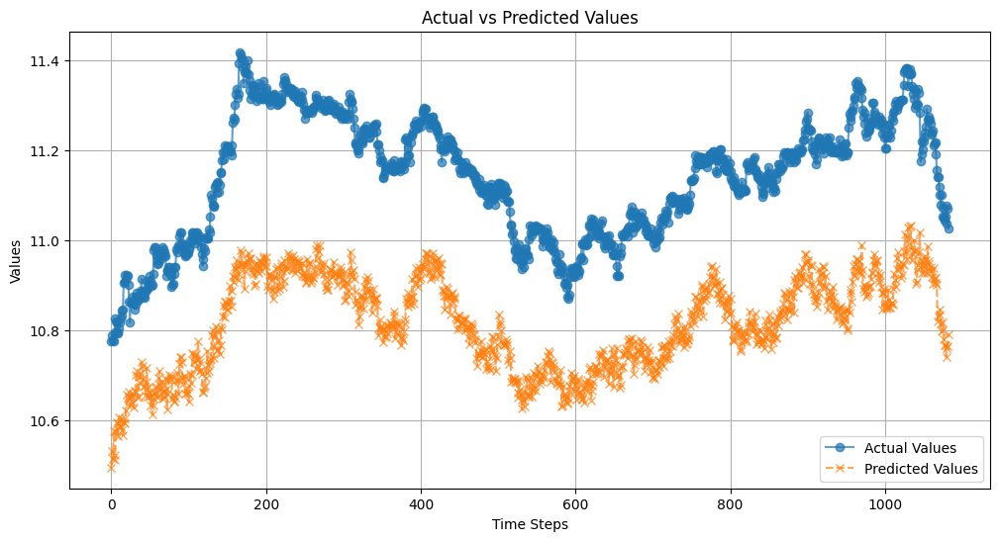

In [ ]:
X_test, y_test = create_sequences(selected_x_test_int, selected_y_test_int, wandb.config.time_steps)
y_test = selected_y_test_int[wandb.config.time_steps:]

y_pred = model_int_hyper23.predict(X_test)
y_pred = y_scaler_selected_int_df.inverse_transform(y_pred)
y_test = y_scaler_selected_int_df.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

# Before Outlier LSTM - Same

##### initial

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="initial", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 30,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_same_bf_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_same_bf_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.4841 - val_mse: 0.4841
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 6.0644e-04 - mse: 6.0644e-04 - val_loss: 0.5071 - val_mse: 0.5071
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.8012e-04 - mse: 3.8012e-04 - val_loss: 0.5127 - val_mse: 0.5127
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 4.1810e-04 - mse: 4.1810e-04 - val_loss: 0.5134 - val_mse: 0.5134
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.5754e-04 - mse: 3.5754e-04 - val_loss: 0.5403 - val_mse: 0.5403
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 2.6332e-04 - mse: 2.6332e-04 - val_loss: 0.5612 - val_mse: 0.5612
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 2.7603e-04 - mse: 2.7603e-04 - val_loss: 0.5669 - val_mse: 0.5669
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 3.8715e-04 - mse: 3.8715e-04 - val_loss: 0.5706 - val_mse: 0.5

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_16 (LSTM)                       │ (None, 30, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_17 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

36/36 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


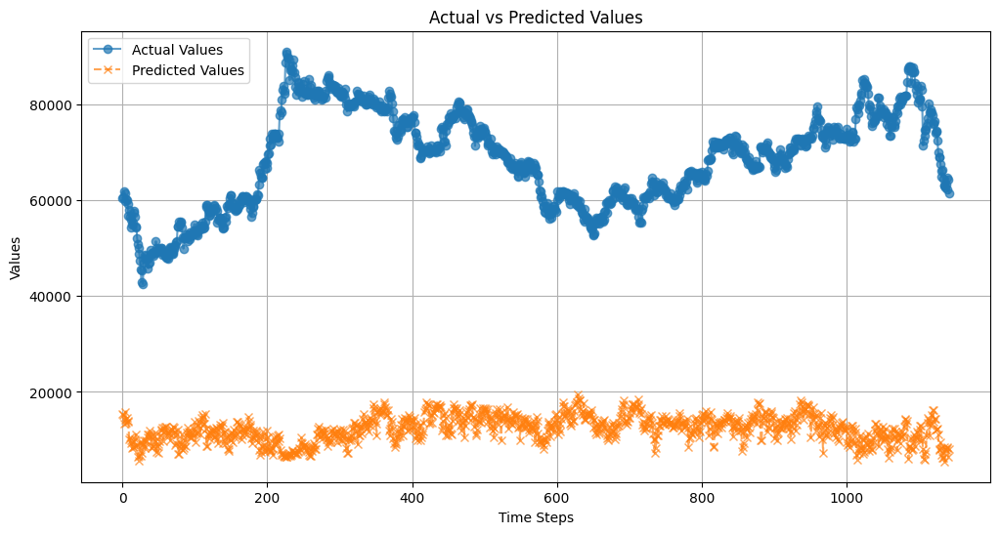

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_init.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 1

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="hyper1", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_hyper1 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_bf_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_same_bf_hyper1.optimizer.learning_rate.numpy(),
    })

model_same_bf_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.3924 - val_mse: 0.3924
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 7.8806e-04 - mse: 7.8806e-04 - val_loss: 0.4333 - val_mse: 0.4333
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 6.7671e-04 - mse: 6.7671e-04 - val_loss: 0.4380 - val_mse: 0.4380
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 6.3430e-04 - mse: 6.3430e-04 - val_loss: 0.4548 - val_mse: 0.4548
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.0013e-04 - mse: 5.0013e-04 - val_loss: 0.4252 - val_mse: 0.4252
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 4.6366e-04 - mse: 4.6366e-04 - val_loss: 0.4213 - val_mse: 0.4213
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 4.3702e-04 - mse: 4.3702e-04 - val_loss: 0.3952 - val_mse: 0.3952
Epoch 8/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 3.9060e-04 - mse: 3.9060e-04 - val_loss: 0.4142 - val_mse:

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_38 (LSTM)                       │ (None, 90, 128)             │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_39 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_40 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 527,237 (2.01 MB)

 Trainable params: 175,745 (686.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 351,492 (1.34 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


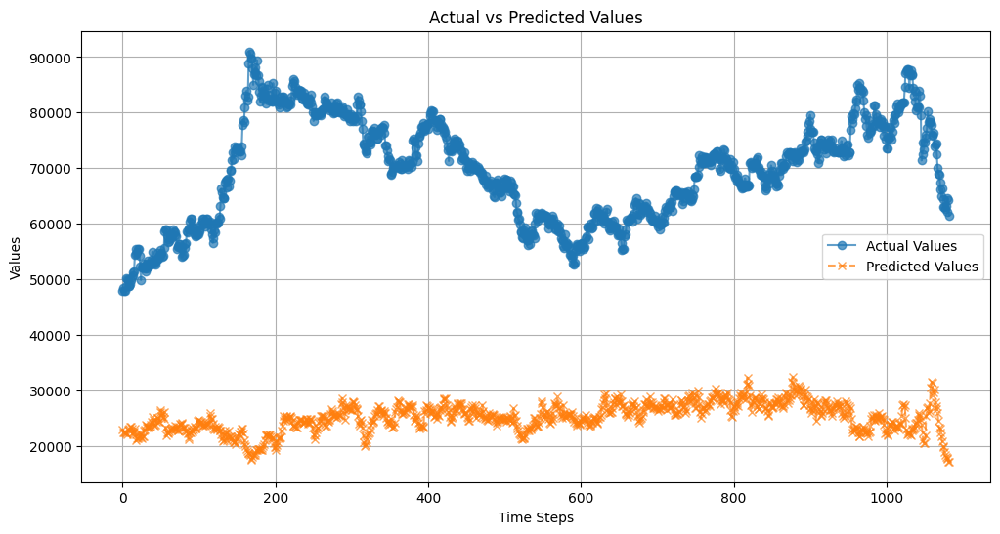

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper1.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▆▇██▇▇▆▇▆▇▆▆▆▄▄▄▅▃▅▃▃▃▃▂▂▂▂▂▁▁
val_mse,▆▇██▇▇▆▇▆▇▆▆▆▄▄▄▅▃▅▃▃▃▃▂▂▂▂▂▁▁
epoch,30
learning_rate,0.001
train_loss,0.00017
train_mse,0.00017
val_loss,0.21332


##### 2

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="hyper2", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(1)
])

model_same_bf_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_same_bf_hyper2.optimizer.learning_rate.numpy(),
    })

model_same_bf_hyper2.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.0276 - mse: 0.0276 - val_loss: 0.4979 - val_mse: 0.4979
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 6.6879e-04 - mse: 6.6879e-04 - val_loss: 0.4765 - val_mse: 0.4765
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 7.1110e-04 - mse: 7.1110e-04 - val_loss: 0.4833 - val_mse: 0.4833
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 5.7777e-04 - mse: 5.7777e-04 - val_loss: 0.4810 - val_mse: 0.4810
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 5.8207e-04 - mse: 5.8207e-04 - val_loss: 0.4693 - val_mse: 0.4693
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 5.6584e-04 - mse: 5.6584e-04 - val_loss: 0.4570 - val_mse: 0.4570
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 4.5542e-04 - mse: 4.5542e-04 - val_loss: 0.4847 - val_mse: 0.4847
Epoch 8/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 3.8203e-04 - mse: 3.8203e-04 - val_loss: 0.4589 - val_mse:

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_41 (LSTM)                       │ (None, 90, 128)             │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_42 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 514,757 (1.96 MB)

 Trainable params: 171,585 (670.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 343,172 (1.31 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


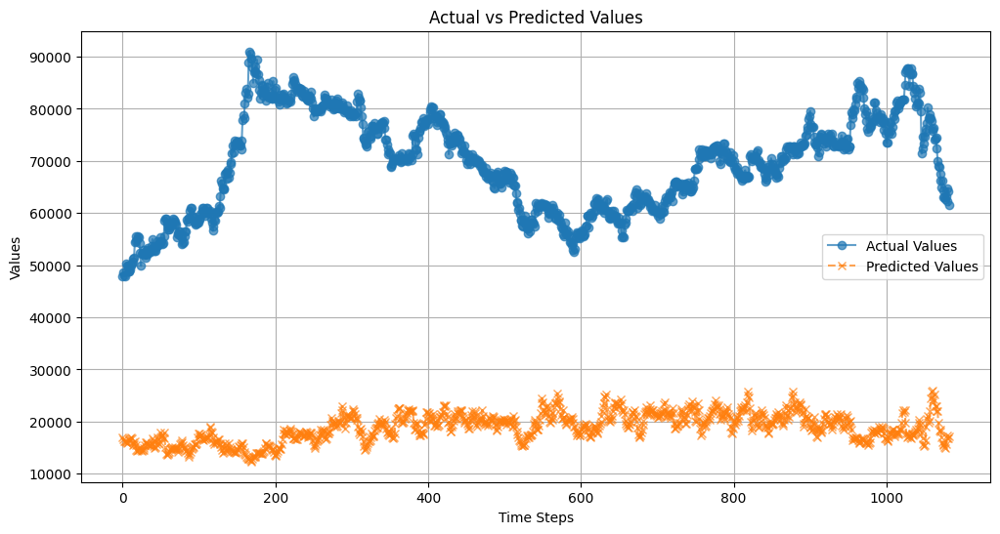

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper2.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 3

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="hyper3", config={
    "epochs": 30,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper3.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_hyper3 = tf.keras.Sequential([
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True)),
    Bidirectional(tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_bf_hyper3.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper3.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_same_bf_hyper3.optimizer.learning_rate.numpy(),
    })

model_same_bf_hyper3.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - loss: 0.0333 - mse: 0.0333 - val_loss: 0.6616 - val_mse: 0.6616
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 8.7198e-04 - mse: 8.7198e-04 - val_loss: 0.6425 - val_mse: 0.6425
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 4.2559e-04 - mse: 4.2559e-04 - val_loss: 0.6385 - val_mse: 0.6385
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - loss: 5.0414e-04 - mse: 5.0414e-04 - val_loss: 0.6343 - val_mse: 0.6343
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 4.8673e-04 - mse: 4.8673e-04 - val_loss: 0.6198 - val_mse: 0.6198
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 4.4418e-04 - mse: 4.4418e-04 - val_loss: 0.6032 - val_mse: 0.6032
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 5.1793e-04 - mse: 5.1793e-04 - val_loss: 0.5964 - val_mse: 0.5964
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 3.3743e-04 - mse: 3.3743e-04 - val_loss: 0.5946 - val_mse: 0.5946
Epoch 9

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ bidirectional_14 (Bidirectional)     │ (None, 90, 256)             │         178,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional_15 (Bidirectional)     │ (None, 90, 128)             │         164,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_61 (LSTM)                       │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_50 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_51 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,188,485 (4.53 MB)

 Trainable params: 396,161 (1.51 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 792,324 (3.02 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


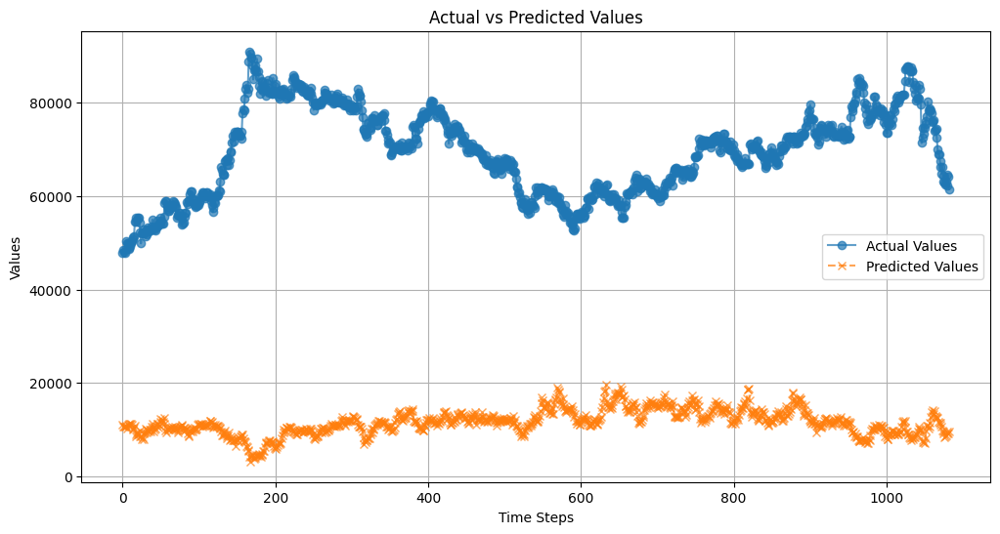

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper3.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▇▇▇▆▆▆▆▆▅▄▅▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▁▁
val_mse,█▇▇▇▇▆▆▆▆▆▅▄▅▄▄▄▄▃▃▃▃▃▂▃▂▂▂▂▁▁
epoch,30
learning_rate,0.001
train_loss,0.00025
train_mse,0.00025
val_loss,0.39987


##### 4

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="hyper4", config={
    "epochs": 30,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper4.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_hyper4 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    Attention(),
    tf.keras.layers.Flatten(),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_bf_hyper4.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper4.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_same_bf_hyper4.optimizer.learning_rate.numpy(),
    })

model_same_bf_hyper4.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - loss: 0.0993 - mse: 0.0993 - val_loss: 0.5556 - val_mse: 0.5556
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.4304 - val_mse: 0.4304
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 8.6217e-04 - mse: 8.6217e-04 - val_loss: 0.4056 - val_mse: 0.4056
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 8.8325e-04 - mse: 8.8325e-04 - val_loss: 0.4083 - val_mse: 0.4083
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 6.3203e-04 - mse: 6.3203e-04 - val_loss: 0.4100 - val_mse: 0.4100
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 7.2525e-04 - mse: 7.2525e-04 - val_loss: 0.3981 - val_mse: 0.3981
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - loss: 5.8513e-04 - mse: 5.8513e-04 - val_loss: 0.4246 - val_mse: 0.4246
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 5.7132e-04 - mse: 5.7132e-04 - val_loss: 0.4232 - val_mse: 0.4232
Epoch 9/30
54/5

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_62 (LSTM)                       │ (None, 90, 128)             │          89,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_63 (LSTM)                       │ (None, 90, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_64 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ attention_8 (Attention)              │ (None)                      │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_11 (Flatten)                 │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_52 (Dense)                     │ (None, 64)                  │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_53 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 527,813 (2.01 MB)

 Trainable params: 175,937 (687.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 351,876 (1.34 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


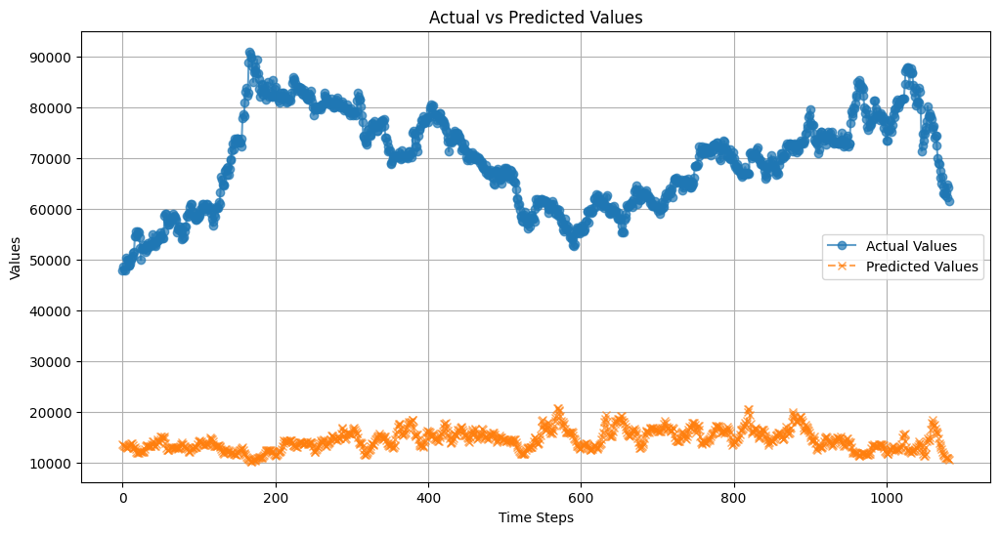

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper4.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▃▂▂▂▁▂▂▃▂▃▃▃▃▄▃▃▃▃▃▃▃▂▂▁▂▂▁▁▂
val_mse,█▃▂▂▂▁▂▂▃▂▃▃▃▃▄▃▃▃▃▃▃▃▂▂▁▂▂▁▁▂
epoch,30
learning_rate,0.001
train_loss,0.00019
train_mse,0.00019
val_loss,0.40404


##### 5

In [ ]:
wandb.finish()

In [ ]:
wandb.init(project="LSTM BF Outlier - Same", name="hyper5", config={
    "epochs": 30,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128,64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper5.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

model_same_bf_hyper5 = tf.keras.Sequential([
    Conv1D(128, kernel_size=3, activation='relu', input_shape=(time_steps, len(features))),
    MaxPooling1D(pool_size=2),

    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_same_bf_hyper5.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper5.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
        "learning_rate": model_same_bf_hyper5.optimizer.learning_rate.numpy(),
    })

model_same_bf_hyper5.summary()

Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 0.0381 - mse: 0.0381 - val_loss: 0.7303 - val_mse: 0.7303
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.7162 - val_mse: 0.7162
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.7253 - val_mse: 0.7253
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 7.8155e-04 - mse: 7.8155e-04 - val_loss: 0.6922 - val_mse: 0.6922
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 9.2086e-04 - mse: 9.2086e-04 - val_loss: 0.7042 - val_mse: 0.7042
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 6.6459e-04 - mse: 6.6459e-04 - val_loss: 0.7032 - val_mse: 0.7032
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 6.6412e-04 - mse: 6.6412e-04 - val_loss: 0.7029 - val_mse: 0.7029
Epoch 8/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 6.6883e-04 - mse: 6.6883e-04 - val_loss: 0.6823 - val_mse: 0.6823
Epoch 9/30
54/54 ━━━━━━━

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_18 (Conv1D)                   │ (None, 88, 128)             │          17,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_18 (MaxPooling1D)      │ (None, 44, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_68 (LSTM)                       │ (None, 44, 128)             │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_69 (LSTM)                       │ (None, 44, 64)              │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_70 (LSTM)                       │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_56 (Dense)                     │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_57 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 706,949 (2.70 MB)

 Trainable params: 235,649 (920.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 471,300 (1.80 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


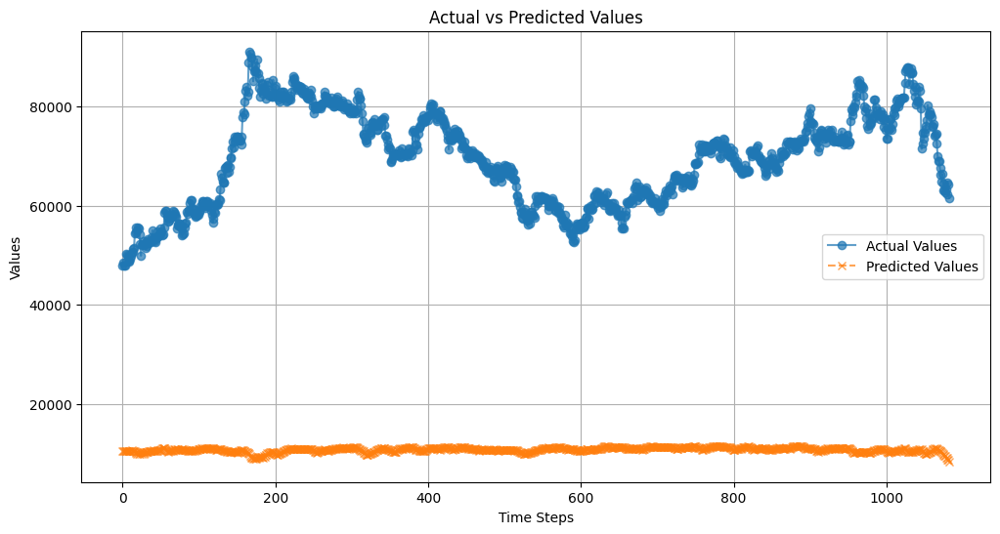

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper5.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 6

In [ ]:
wandb.finish()

In [ ]:
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Add, Flatten

# WandB 초기화
wandb.init(project="LSTM BF Outlier - Same", name="hyper6", config={
    "epochs": 30,
    "batch_size": 64,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper6.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

# 모델 정의 (Functional API)
input_layer = Input(shape=(time_steps, len(features)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)(skip1)

skip1_adjusted = Conv1D(64, kernel_size=1, activation='relu')(skip1)  # (batch_size, new_time_steps, 64)
skip2 = Add()([skip1_adjusted, lstm2])

# 세 번째 LSTM (Skip Connection 적용 X)
lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip2)

# Dense Layers
dense1 = Dense(64, activation='relu')(lstm3)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_same_bf_hyper6 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_same_bf_hyper6.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper6.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['mse'][0],
        "learning_rate": model_same_bf_hyper6.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_same_bf_hyper6.summary()

Epoch 1/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 0.0332 - mse: 0.0332 - val_loss: 0.1344 - val_mse: 0.1344 - learning_rate: 0.0010
Epoch 2/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 9.6600e-04 - mse: 9.6600e-04 - val_loss: 0.1050 - val_mse: 0.1050 - learning_rate: 0.0010
Epoch 3/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 6.9161e-04 - mse: 6.9161e-04 - val_loss: 0.1276 - val_mse: 0.1276 - learning_rate: 0.0010
Epoch 4/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 5.6049e-04 - mse: 5.6049e-04 - val_loss: 0.1123 - val_mse: 0.1123 - learning_rate: 0.0010
Epoch 5/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 5.4150e-04 - mse: 5.4150e-04 - val_loss: 0.1064 - val_mse: 0.1064 - learning_rate: 0.0010
Epoch 6/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 3.7787e-04 - mse: 3.7787e-04 - val_loss: 0.1175 - val_mse: 0.1175 - learning_rate: 0.0010
Epoch 7/30
54/54 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 6.2813e-04 - mse: 6.2813e-04 - val_loss: 0.1129 - val_m

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_30            │ (None, 90, 45)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_20 (Conv1D)        │ (None, 88, 128)        │         17,408 │ input_layer_30[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_20          │ (None, 44, 128)        │              0 │ conv1d_20[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_73 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_20[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_13 (Add)              │ (None, 44, 128)        │              0 │ max_pooling1d_20[0][0… │
│                           │                        │                │ lstm_73[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_21 (Conv1D)        │ (None, 44, 64)         │          8,256 │ add_13[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_74 (LSTM)            │ (None, 44, 64)         │         49,408 │ add_13[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_14 (Add)              │ (None, 44, 64)         │              0 │ conv1d_21[0][0],       │
│                           │                        │                │ lstm_74[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_75 (LSTM)            │ (None, 64)             │         33,024 │ add_14[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_58 (Dense)          │ (None, 64)             │          4,160 │ lstm_75[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_59 (Dense)          │ (None, 1)              │             65 │ dense_58[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 731,717 (2.79 MB)

 Trainable params: 243,905 (952.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 487,812 (1.86 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


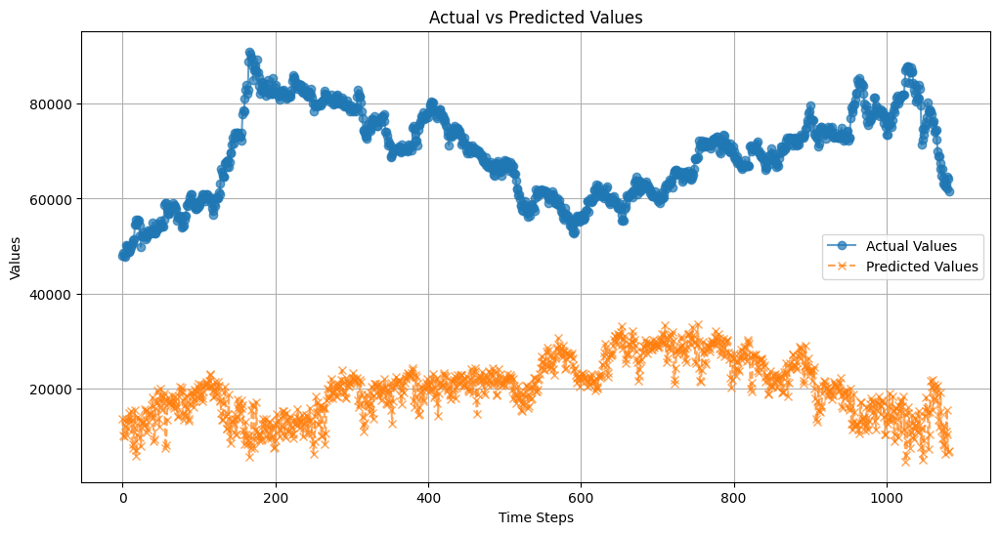

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper6.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 7

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▃▁▃▁▁▂▂▃▃▄▅▄▅▅▆▆▆▇▇█▆▇▆▇█▇▇▆▇▇
val_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,30
learning_rate,0.001
train_loss,0.00025
train_mse,0.00025
val_loss,0.1962


In [ ]:
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Add, Flatten

# WandB 초기화
wandb.init(project="LSTM BF Outlier - Same", name="hyper7", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper7.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_same_wo, y_train_same_wo, time_steps)
X_val, y_val = create_sequences(x_val_same_wo, y_val_same_wo, time_steps)

# 모델 정의 (Functional API)
input_layer = Input(shape=(time_steps, len(features)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)(skip1)

skip1_adjusted = Conv1D(64, kernel_size=1, activation='relu')(skip1)  # (batch_size, new_time_steps, 64)
skip2 = Add()([skip1_adjusted, lstm2])

# 세 번째 LSTM (Skip Connection 적용 X)
lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip2)

# Dense Layers
dense1 = Dense(64, activation='relu')(lstm3)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_same_bf_hyper7 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_same_bf_hyper7.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper7.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['mse'][0],
        "learning_rate": model_same_bf_hyper7.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_same_bf_hyper7.summary()

Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.0259 - mse: 0.0259 - val_loss: 0.7642 - val_mse: 0.7642 - learning_rate: 0.0010
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 6.3615e-04 - mse: 6.3615e-04 - val_loss: 0.6915 - val_mse: 0.6915 - learning_rate: 0.0010
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 6.6300e-04 - mse: 6.6300e-04 - val_loss: 0.6738 - val_mse: 0.6738 - learning_rate: 0.0010
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 3.5894e-04 - mse: 3.5894e-04 - val_loss: 0.6662 - val_mse: 0.6662 - learning_rate: 0.0010
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 5.3364e-04 - mse: 5.3364e-04 - val_loss: 0.6376 - val_mse: 0.6376 - learning_rate: 0.0010
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 3.7351e-04 - mse: 3.7351e-04 - val_loss: 0.6044 - val_mse: 0.6044 - learning_rate: 0.0010
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 3.6956e-04 - mse: 3.6956e-04 - val_loss: 

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_31            │ (None, 90, 45)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_22 (Conv1D)        │ (None, 88, 128)        │         17,408 │ input_layer_31[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_21          │ (None, 44, 128)        │              0 │ conv1d_22[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_76 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_21[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_15 (Add)              │ (None, 44, 128)        │              0 │ max_pooling1d_21[0][0… │
│                           │                        │                │ lstm_76[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_23 (Conv1D)        │ (None, 44, 64)         │          8,256 │ add_15[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_77 (LSTM)            │ (None, 44, 64)         │         49,408 │ add_15[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_16 (Add)              │ (None, 44, 64)         │              0 │ conv1d_23[0][0],       │
│                           │                        │                │ lstm_77[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_78 (LSTM)            │ (None, 64)             │         33,024 │ add_16[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_60 (Dense)          │ (None, 64)             │          4,160 │ lstm_78[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_61 (Dense)          │ (None, 1)              │             65 │ dense_60[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 731,717 (2.79 MB)

 Trainable params: 243,905 (952.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 487,812 (1.86 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


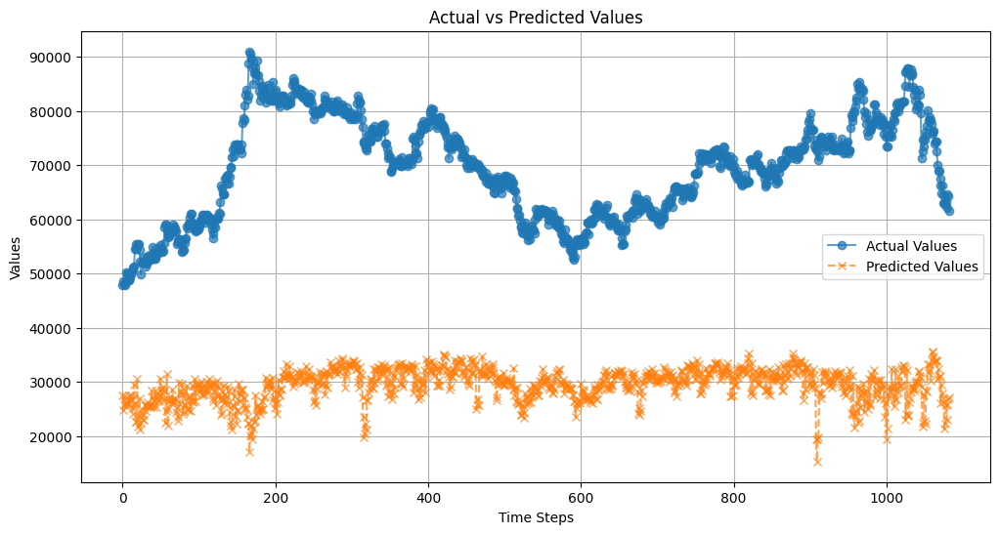

In [ ]:
X_test, y_test = create_sequences(x_test_same_wo, y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper7.predict(X_test)
y_pred = y_scaler_same_wo.inverse_transform(y_pred)
y_test = y_scaler_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

#### Feature Selection

##### 8

In [ ]:
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Add, Flatten


In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM BF Outlier - Same", name="hyper8", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper8.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_same_wo, selected_y_train_same_wo, time_steps)
X_val, y_val = create_sequences(selected_x_val_same_wo, selected_y_val_same_wo, time_steps)

# 모델 정의 (Functional API)
input_layer = Input(shape=(time_steps, len(features2_same)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)(skip1)

skip1_adjusted = Conv1D(64, kernel_size=1, activation='relu')(skip1)  # (batch_size, new_time_steps, 64)
skip2 = Add()([skip1_adjusted, lstm2])

# 세 번째 LSTM (Skip Connection 적용 X)
lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip2)

# Dense Layers
dense1 = Dense(64, activation='relu')(lstm3)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_same_bf_hyper8 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_same_bf_hyper8.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper8.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['mse'][0],
        "learning_rate": model_same_bf_hyper8.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_same_bf_hyper8.summary()

Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0195 - mse: 0.0195 - val_loss: 0.3543 - val_mse: 0.3543 - learning_rate: 0.0010
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 5.6432e-04 - mse: 5.6432e-04 - val_loss: 0.3273 - val_mse: 0.3273 - learning_rate: 0.0010
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 4.0207e-04 - mse: 4.0207e-04 - val_loss: 0.3331 - val_mse: 0.3331 - learning_rate: 0.0010
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 4.9996e-04 - mse: 4.9996e-04 - val_loss: 0.3083 - val_mse: 0.3083 - learning_rate: 0.0010
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 5.5330e-04 - mse: 5.5330e-04 - val_loss: 0.2939 - val_mse: 0.2939 - learning_rate: 0.0010
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.8475e-04 - mse: 3.8475e-04 - val_loss: 0.2909 - val_mse: 0.2909 - learning_rate: 0.0010
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 3.6688e-04 - mse: 3.6688e-04 - val_loss: 

Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33            │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_25 (Conv1D)        │ (None, 88, 128)        │          5,120 │ input_layer_33[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_23          │ (None, 44, 128)        │              0 │ conv1d_25[0][0]        │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_81 (LSTM)            │ (None, 44, 128)        │        131,584 │ max_pooling1d_23[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_19 (Add)              │ (None, 44, 128)        │              0 │ max_pooling1d_23[0][0… │
│                           │                        │                │ lstm_81[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_26 (Conv1D)        │ (None, 44, 64)         │          8,256 │ add_19[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_82 (LSTM)            │ (None, 44, 64)         │         49,408 │ add_19[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_20 (Add)              │ (None, 44, 64)         │              0 │ conv1d_26[0][0],       │
│                           │                        │                │ lstm_82[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_83 (LSTM)            │ (None, 64)             │         33,024 │ add_20[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_65 (Dense)          │ (None, 64)             │          4,160 │ lstm_83[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_66 (Dense)          │ (None, 1)              │             65 │ dense_65[0][0]         │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 694,853 (2.65 MB)

 Trainable params: 231,617 (904.75 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 463,236 (1.77 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


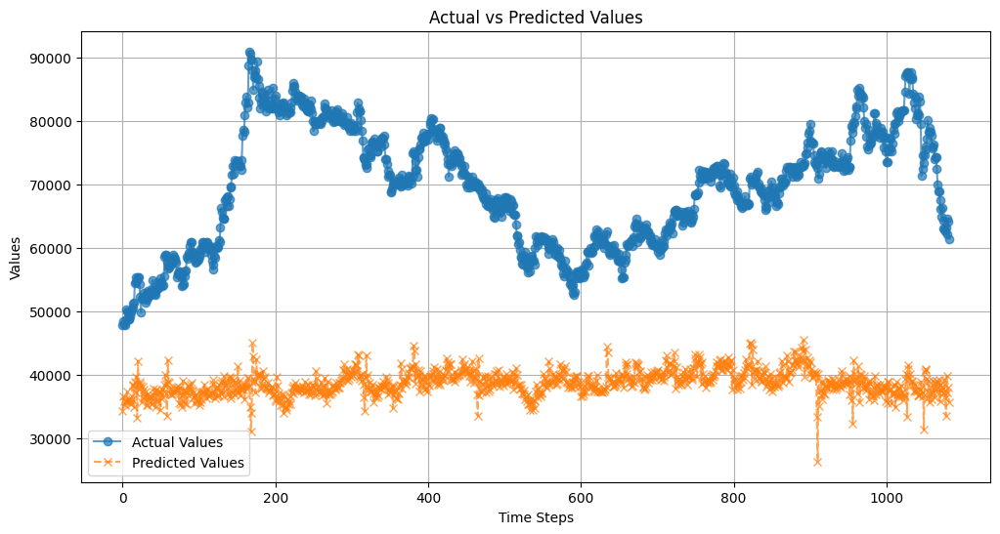

In [ ]:
X_test, y_test = create_sequences(selected_x_test_same_wo, selected_y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper8.predict(X_test)
y_pred = y_scaler_selected_same_wo.inverse_transform(y_pred)
y_test = y_scaler_selected_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 9

In [ ]:
wandb.finish()

In [ ]:
# WandB 초기화
wandb.init(project="LSTM BF Outlier - Same", name="hyper9", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 128],
    "optimizer": "adam",
    "loss": "mse",
}, reinit=True)

# Checkpoint 설정
model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_same_hyper9.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

# Learning Rate Scheduler
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# 데이터 준비
time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(selected_x_train_same_wo, selected_y_train_same_wo, time_steps)
X_val, y_val = create_sequences(selected_x_val_same_wo, selected_y_val_same_wo, time_steps)

# 모델 정의 (Functional API)
input_layer = Input(shape=(time_steps, len(features2_same)))

# Conv1D + MaxPooling
conv1 = Conv1D(128, kernel_size=3, activation='relu')(input_layer)
pool1 = MaxPooling1D(pool_size=2)(conv1)

# 첫 번째 LSTM
lstm1 = LSTM(wandb.config.lstm_units[0], activation='tanh', return_sequences=True)(pool1)

# 첫 번째 Skip Connection
skip1 = Add()([pool1, lstm1])

# 두 번째 LSTM
lstm2 = LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True)(skip1)

skip1_adjusted = Conv1D(128, kernel_size=1, activation='relu')(skip1)  # (batch_size, new_time_steps, 64)
skip2 = Add()([skip1_adjusted, lstm2])

# 세 번째 LSTM (Skip Connection 적용 X)
lstm3 = LSTM(wandb.config.lstm_units[1], activation='tanh')(skip2)

# Dense Layers
dense1 = Dense(64, activation='relu')(lstm3)
output_layer = Dense(1)(dense1)

# 모델 정의 및 컴파일
model_same_bf_hyper9 = tf.keras.Model(inputs=input_layer, outputs=output_layer)
model_same_bf_hyper9.compile(optimizer=wandb.config.optimizer, loss=wandb.config.loss, metrics=['mse'])

# 학습
train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_same_bf_hyper9.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    # WandB 로그 기록
    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['mse'][0],
        "learning_rate": model_same_bf_hyper9.optimizer.learning_rate.numpy(),
    })

# 모델 요약
model_same_bf_hyper9.summary()

Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.0227 - mse: 0.0227 - val_loss: 0.0312 - val_mse: 0.0312 - learning_rate: 0.0010
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 4.4416e-04 - mse: 4.4416e-04 - val_loss: 0.0433 - val_mse: 0.0433 - learning_rate: 0.0010
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 3.8516e-04 - mse: 3.8516e-04 - val_loss: 0.0439 - val_mse: 0.0439 - learning_rate: 0.0010
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 3.9559e-04 - mse: 3.9559e-04 - val_loss: 0.0710 - val_mse: 0.0710 - learning_rate: 0.0010
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 3.6056e-04 - mse: 3.6056e-04 - val_loss: 0.0918 - val_mse: 0.0918 - learning_rate: 0.0010
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 2.4077e-04 - mse: 2.4077e-04 - val_loss: 0.1349 - val_mse: 0.1349 - learning_rate: 0.0010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 2.6940e-04 - mse: 2.6940e-04 - val_loss:

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 90, 13)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_3 (Conv1D)         │ (None, 88, 128)        │          5,120 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling1d_2           │ (None, 44, 128)        │              0 │ conv1d_3[0][0]         │
│ (MaxPooling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_3 (LSTM)             │ (None, 44, 128)        │        131,584 │ max_pooling1d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (None, 44, 128)        │              0 │ max_pooling1d_2[0][0], │
│                           │                        │                │ lstm_3[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_4 (Conv1D)         │ (None, 44, 128)        │         16,512 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_4 (LSTM)             │ (None, 44, 128)        │        131,584 │ add_2[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (None, 44, 128)        │              0 │ conv1d_4[0][0],        │
│                           │                        │                │ lstm_4[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm_5 (LSTM)             │ (None, 128)            │        131,584 │ add_3[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │          8,256 │ lstm_5[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,274,117 (4.86 MB)

 Trainable params: 424,705 (1.62 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 849,412 (3.24 MB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


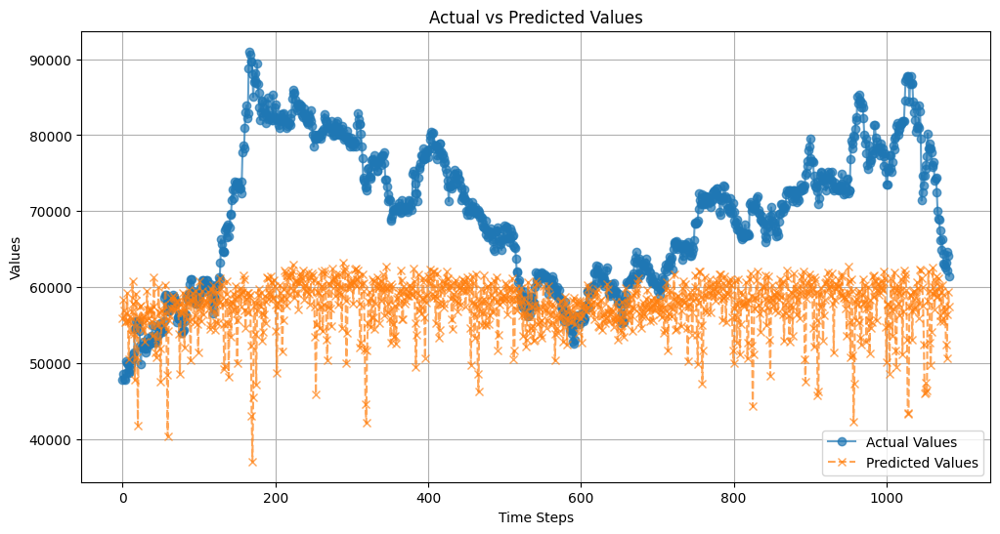

In [ ]:
X_test, y_test = create_sequences(selected_x_test_same_wo, selected_y_test_same_wo, wandb.config.time_steps)

y_pred = model_same_bf_hyper9.predict(X_test)
y_pred = y_scaler_selected_same_wo.inverse_transform(y_pred)
y_test = y_scaler_selected_same_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

# Before Outlier LSTM - Interp

##### initial

In [ ]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,▂▃▃▅▇█▇▄▆▃▂▂▁▃▂▂▃▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▂▂▂▂▂
val_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,50
learning_rate,0.001
train_loss,0.00018
train_mse,0.00018
val_loss,0.02278


In [ ]:
wandb.init(project="LSTM BF Outlier - Interp", name="initial", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 30,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_interp.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int_wo, y_train_int_wo, time_steps)
X_val, y_val = create_sequences(x_val_int_wo, y_val_int_wo, time_steps)

model_int_bf_init = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_int_bf_init.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_bf_init.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_bf_init.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0343 - mse: 0.0343 - val_loss: 1.0546 - val_mse: 1.0546
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 7.2230e-04 - mse: 7.2230e-04 - val_loss: 1.0238 - val_mse: 1.0238
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 4.2844e-04 - mse: 4.2844e-04 - val_loss: 1.0150 - val_mse: 1.0150
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.6143e-04 - mse: 4.6143e-04 - val_loss: 0.9851 - val_mse: 0.9851
Epoch 5/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 4.8689e-04 - mse: 4.8689e-04 - val_loss: 0.9823 - val_mse: 0.9823
Epoch 6/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 3.1900e-04 - mse: 3.1900e-04 - val_loss: 0.9638 - val_mse: 0.9638
Epoch 7/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 2.9919e-04 - mse: 2.9919e-04 - val_loss: 0.9440 - val_mse: 0.9440
Epoch 8/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 5.4470e-04 - mse: 5.4470e-04 - val_loss: 0.9423 - val_mse:

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 30, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step


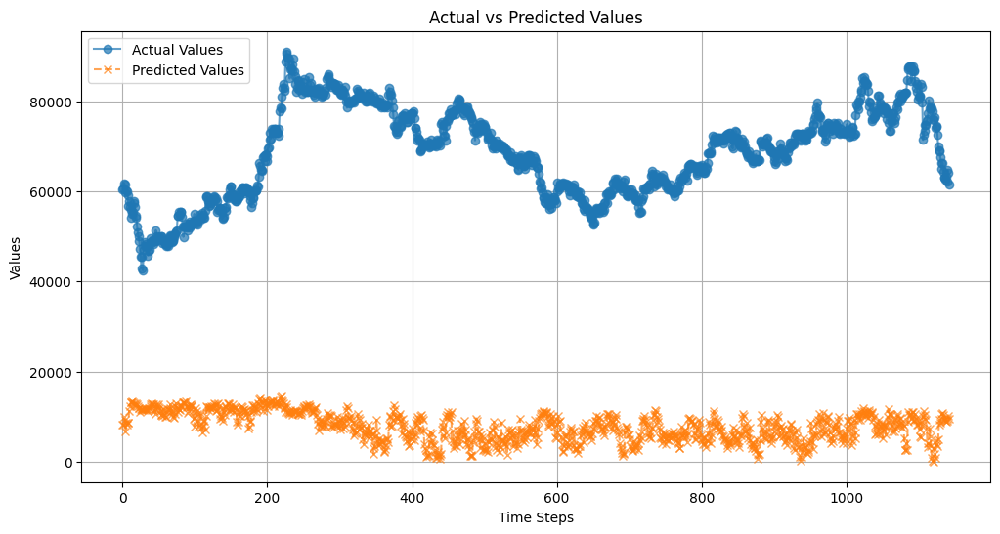

In [ ]:
X_test, y_test = create_sequences(x_test_int_wo, y_test_int_wo, wandb.config.time_steps)

y_pred = model_int_bf_init.predict(X_test)
y_pred = y_scaler_int_wo.inverse_transform(y_pred)
y_test = y_scaler_int_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 1

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▇▇▇▆▆▆▆▅▅▄▄▄▄▃▂▃▂▂▂▂▂▁▁▁▁▂▁▁
val_mse,█▇▇▇▇▆▆▆▆▅▅▄▄▄▄▃▂▃▂▂▂▂▂▁▁▁▁▂▁▁
epoch,30
train_loss,0.00016
train_mse,0.00016
val_loss,0.68033
val_mse,0.68033


In [ ]:
wandb.init(project="LSTM BF Outlier - Interp", name="hyper1", config={
    "epochs": 30,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_interp_hyper1.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int_wo, y_train_int_wo, time_steps)
X_val, y_val = create_sequences(x_val_int_wo, y_val_int_wo, time_steps)

model_int_bf_hyper1 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),
    tf.keras.layers.Dense(1)
])

model_int_bf_hyper1.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_bf_hyper1.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_bf_hyper1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0248 - mse: 0.0248 - val_loss: 0.7561 - val_mse: 0.7561
Epoch 2/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 5.8595e-04 - mse: 5.8595e-04 - val_loss: 0.7174 - val_mse: 0.7174
Epoch 3/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 4.0156e-04 - mse: 4.0156e-04 - val_loss: 0.6896 - val_mse: 0.6896
Epoch 4/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 3.8181e-04 - mse: 3.8181e-04 - val_loss: 0.6715 - val_mse: 0.6715
Epoch 5/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 3.2991e-04 - mse: 3.2991e-04 - val_loss: 0.6653 - val_mse: 0.6653
Epoch 6/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 3.3770e-04 - mse: 3.3770e-04 - val_loss: 0.6331 - val_mse: 0.6331
Epoch 7/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 3.1475e-04 - mse: 3.1475e-04 - val_loss: 0.6466 - val_mse: 0.6466
Epoch 8/30
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 3.2514e-04 - mse: 3.2514e-04 - val_loss: 0.6421 - val_mse:

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                        │ (None, 90, 64)              │          28,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,749 (717.77 KB)

 Trainable params: 61,249 (239.25 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 122,500 (478.52 KB)

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step


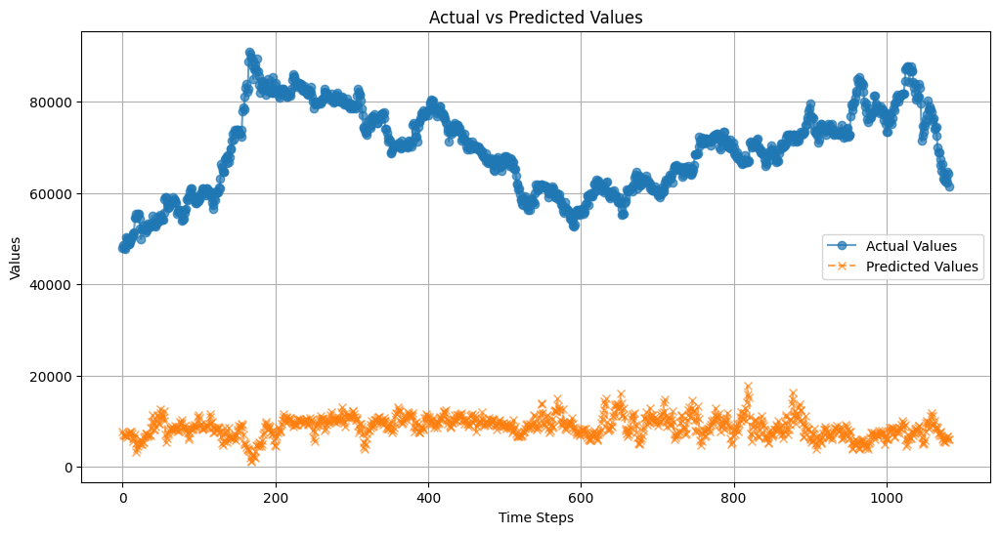

In [ ]:
X_test, y_test = create_sequences(x_test_int_wo, y_test_int_wo, wandb.config.time_steps)

y_pred = model_int_bf_hyper1.predict(X_test)
y_pred = y_scaler_int_wo.inverse_transform(y_pred)
y_test = y_scaler_int_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 2

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▆▆▆▅▅▅▄▄▄▃▄▄▃▃▄▃▃▃▂▂▂▂▂▂▂▂▁▂
val_mse,█▇▆▆▆▅▅▅▄▄▄▃▄▄▃▃▄▃▃▃▂▂▂▂▂▂▂▂▁▂
epoch,30
train_loss,0.00017
train_mse,0.00017
val_loss,0.50028
val_mse,0.50028


In [ ]:
wandb.init(project="LSTM BF Outlier - Interp", name="hyper2", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_interp_hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int_wo, y_train_int_wo, time_steps)
X_val, y_val = create_sequences(x_val_int_wo, y_val_int_wo, time_steps)

model_int_bf_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_bf_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_bf_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_bf_hyper2.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0201 - mse: 0.0201 - val_loss: 0.7065 - val_mse: 0.7065
Epoch 2/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 6.8994e-04 - mse: 6.8994e-04 - val_loss: 0.7093 - val_mse: 0.7093
Epoch 3/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 4.1726e-04 - mse: 4.1726e-04 - val_loss: 0.7033 - val_mse: 0.7033
Epoch 4/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 3.8226e-04 - mse: 3.8226e-04 - val_loss: 0.7133 - val_mse: 0.7133
Epoch 5/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 3.8046e-04 - mse: 3.8046e-04 - val_loss: 0.7144 - val_mse: 0.7144
Epoch 6/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 3.5751e-04 - mse: 3.5751e-04 - val_loss: 0.7010 - val_mse: 0.7010
Epoch 7/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 2.9724e-04 - mse: 2.9724e-04 - val_loss: 0.6973 - val_mse: 0.6973
Epoch 8/50
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 2.7064e-04 - mse: 2.7064e-04 - val_loss: 0.6891 - val_mse:

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step


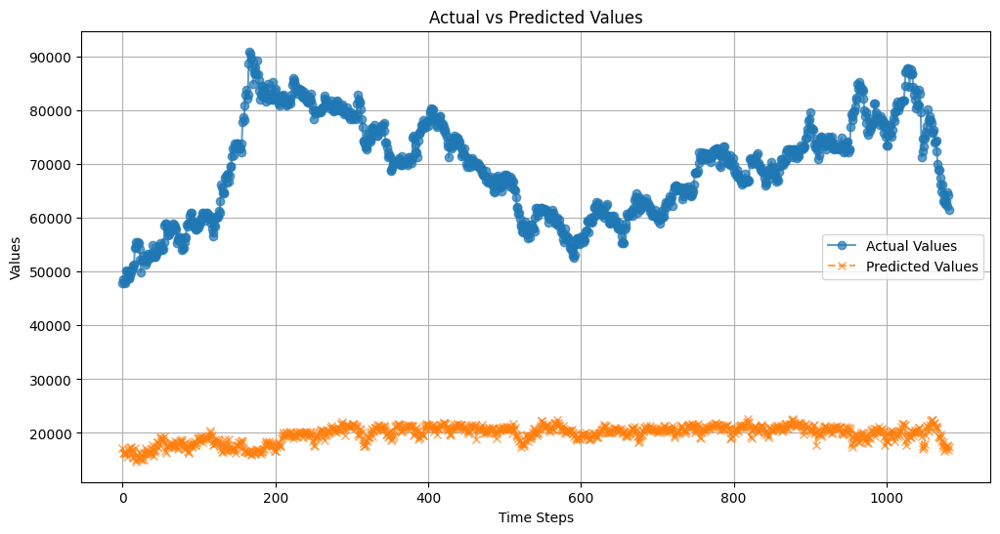

In [ ]:
X_test, y_test = create_sequences(x_test_int_wo, y_test_int_wo, wandb.config.time_steps)

y_pred = model_int_bf_hyper2.predict(X_test)
y_pred = y_scaler_int_wo.inverse_transform(y_pred)
y_test = y_scaler_int_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 3

In [ ]:
wandb.finish()

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇██
train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_mse,█▅▅▇▄▃▄▄▃▃▂▂▂▃▂▁▂▃▁▂▂▁▂▂▁▂▂▁▁▁▁▂▁▁▁▂▂▁▁▂
val_loss,████████▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▃▃▃▂▃▂▂▂▂▂▁▁▁▁
val_mse,████████▇▇▇▆▆▆▆▅▅▅▅▅▄▄▄▄▃▃▄▃▃▃▃▂▂▂▂▂▁▁▁▁
epoch,50
train_loss,0.00017
train_mse,0.00017
val_loss,0.34749
val_mse,0.34749


In [ ]:
wandb.init(project="LSTM BF Outlier - Interp", name="hyper3", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [128, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_interp_hyper3.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int_wo, y_train_int_wo, time_steps)
X_val, y_val = create_sequences(x_val_int_wo, y_val_int_wo, time_steps)

model_int_bf_hyper3 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh', return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_bf_hyper3.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_bf_hyper3.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_bf_hyper3.summary()

In [ ]:
X_test, y_test = create_sequences(x_test_int_wo, y_test_int_wo, wandb.config.time_steps)

y_pred = model_int_bf_hyper3.predict(X_test)
y_pred = y_scaler_int_wo.inverse_transform(y_pred)
y_test = y_scaler_int_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()

##### 4

In [ ]:
wandb.init(project="LSTM BF Outlier - Interp", name="hyper2", config={
    "epochs": 50,
    "batch_size": 32,
    "time_steps": 90,
    "lstm_units": [64, 64],
    "optimizer": "adam",
    "loss": "mse",
},reinit=True)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Time Series Project/Stock Price/Model/model_path/bf_interp_hyper2.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    #verbose=1
)

time_steps = wandb.config.time_steps
X_train, y_train = create_sequences(x_train_int_wo, y_train_int_wo, time_steps)
X_val, y_val = create_sequences(x_val_int_wo, y_val_int_wo, time_steps)

model_int_bf_hyper2 = tf.keras.Sequential([
    tf.keras.layers.LSTM(wandb.config.lstm_units[0], activation='tanh', input_shape=(time_steps, len(features)), return_sequences=True),
    tf.keras.layers.LSTM(wandb.config.lstm_units[1], activation='tanh'),

    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)
])

model_int_bf_hyper2.compile(optimizer=wandb.config.optimizer, loss='mse', metrics=['mse'])

train_loss_history = []
val_loss_history = []

for epoch in range(wandb.config.epochs):
    print(f"Epoch {epoch + 1}/{wandb.config.epochs}")
    history = model_int_bf_hyper2.fit(
        X_train, y_train,
        epochs=1,
        batch_size=wandb.config.batch_size,
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks = [early_stopping, model_checkpoint]
    )

    train_loss_history.append(history.history['loss'][0])
    val_loss_history.append(history.history['val_loss'][0])

    wandb.log({
        "epoch": epoch + 1,
        "train_loss": history.history['loss'][0],
        "val_loss": history.history['val_loss'][0],
        "train_mse": history.history['mse'][0],
        "val_mse": history.history['val_mse'][0],
    })

model_int_bf_hyper2.summary()

In [ ]:
X_test, y_test = create_sequences(x_test_int_wo, y_test_int_wo, wandb.config.time_steps)

y_pred = model_int_bf_hyper2.predict(X_test)
y_pred = y_scaler_int_wo.inverse_transform(y_pred)
y_test = y_scaler_int_wo.inverse_transform(y_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test, label='Actual Values', linestyle='-', marker='o', alpha=0.7)
plt.plot(y_pred, label='Predicted Values', linestyle='--', marker='x', alpha=0.7)
plt.title('Actual vs Predicted Values')
plt.xlabel('Time Steps')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()